In [1]:
import os,sys
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
import seaborn as sns
%matplotlib inline
import numpy as np
import scipy
import pandas as pd
import json
import pymongo
from IPython.display import clear_output
from itertools import chain
from collections import Counter
from datetime import timedelta, datetime
from dateutil.relativedelta import relativedelta
import random as rnd
from bson import ObjectId
import pickle, gzip
import time
import math 
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.neural_network import MLPRegressor
import pickle
import seaborn as sns; sns.set()

# Multilayer Perceptron for time series prediction



We propose a model for predicting entire time series starting from the first days of
recording. The implementation is straightforward: we gather all the information
available and for each day and for each time series a **Multilayer perceptron** is trained to predict the
value of the next day. The latter is then used as starting input, together with the
whole time series until that day, and the regression goes on. The first 6 days of
statistic are given as input to the model.

TIME SERIES


<ul>
<li> track_pop : Spotify Popularity Index;</li>
<li> art_pop : Popularity of the artist on Spotify;</li>
<li> art_foll : Followers artist on Spotify;</li>
<li> yt_views : Views related video on YouTube;</li>
<li> yt_like : Like related video on YouTube;</li>
<li> yt_dislike : Dislike related video on YouTube;</li>
<li> yt_comments : Comments related video on YouTube;</li>


</ul>

In [2]:
path_proj = os.getcwd()+ '/'
path_save = path_proj + 'csv/'
figure_save = path_proj + 'figures'

In [3]:
pickle_in = open("time_series_sync.pkl","rb")
time_series = pickle.load(pickle_in) #dictionary of dictionary storing time series. Primary key: 'track_id', Secondary key: time series label
df_track_pro = pd.read_csv(path_save + 'df_track+.csv')


In [5]:
time_series[list(time_series.keys())[0]].keys()

dict_keys(['track_pop', 'art_pop', 'art_foll', 'yt_views', 'yt_like', 'yt_dislike', 'yt_comments'])

In [6]:
def df_spotify_to_youtube(min_days_of_record):
    
    track_id_list = [track_id for track_id in time_series.keys() if len(time_series[track_id]['track_pop']) >= min_days_of_record] 
    #devo selezionare gli id con almeno yt_day_target di records 
    #ricordati che yt_day_target_sara' successivo a spotify _input_days
    df = df_track_pro.loc[df_track_pro['track_id'].isin(track_id_list)].copy()
    
    for day in np.arange(min_days_of_record):
        
        df['SP_pop day ' +str(day)] =  [ time_series[track_id]['track_pop'][day] for track_id in track_id_list]
        df['art_pop day ' +str(day)] =  [ time_series[track_id]['art_pop'][day] for track_id in track_id_list]
        df['art_foll day ' +str(day)] =  np.log(np.array([ time_series[track_id]['art_foll'][day] for track_id in track_id_list])+1)
        
        df['YT views day ' +str(day)] =  np.log(np.array([ time_series[track_id]['yt_views'][day] for track_id in track_id_list])+1)
        df['YT Like day ' +str(day)] =  np.log(np.array([ time_series[track_id]['yt_like'][day] for track_id in track_id_list])+1)
        df['YT Dislike day ' +str(day)] =  np.log(np.array([ time_series[track_id]['yt_dislike'][day] for track_id in track_id_list])+1)
        df['YT Comm day ' +str(day)] =  np.log(np.array([ time_series[track_id]['yt_comments'][day] for track_id in track_id_list])+1)
        
        df['YT response ' +str(day)] = np.exp(df['YT Comm day ' +str(day)])/np.exp(df['YT views day ' +str(day)])
        df['YT likeness ' +str(day)] = np.exp(df['YT Like day ' +str(day)])/(df['YT Like day ' +str(day)]+df['YT Dislike day ' +str(day)]+1)
        if(day>=1):
            df['YT daily views day ' +str(day)] =  np.log(
                np.exp(df['YT views day '+str(day)])-np.exp(df['YT views day ' +str(day-1)])+1)
            df['YT daily Like day ' +str(day)] =  np.exp(df['YT Like day '+str(day)])-np.exp(df['YT Like day ' +str(day-1)])
            df['YT daily Dislike day ' +str(day)] =  np.exp(df['YT Dislike day '+str(day)])-np.exp(df['YT Dislike day ' +str(day-1)])
            df['YT daily Comm day ' +str(day)] =  np.exp(df['YT Comm day '+str(day)])-np.exp(df['YT Comm day ' +str(day-1)])
    #df['YT views day' + str(yt_day_target)] = np.log(np.array([time_series[k]['yt_views'][yt_day_target-1]
    #                                                           for k in id_]))
    
    to_drop = ['time_signature', 'dz_track_id',
               'dz_artist_id', 'dz_artist_name', 
               'dz_album_id', 'dz_album_name',
               'dzRelDate', 'dzDuration', 
               'dzTrackPos', 'dzDiskN', 
               'dzBpm', 'dzGain',
               'ytChannel_ref', 'ytChannel_id', 'ytVideo_title', 
               'ytVideo_releaseDate','track_id',
               'day_zero', 
               '1week', '2week', '3week', '4week',
               'artist_popularity', 'dzRank', 'dzArtFanN', 'dzAlbumN','Unnamed: 0',
               'name', 'type', 'added_at', 'album_id', 'album_name', 'artist_id',
               'explicit', 'is_local', 'track','release_date','album_type','release_date_precision',
               'artist_name'
              ]
    df = df.drop(columns = to_drop)
    #df = df.select_dtypes('number')
    return df

In [10]:
saving_path_regression = (figure_save+'/completeRegression')
if(not os.path.isdir(saving_path_regression)):
    os.makedirs(saving_path_regression)
    print('New Directory Created!')

New Directory Created!


In [12]:
super_df = df_spotify_to_youtube(min_days_of_record = 20)
super_df.dropna(inplace=True)
copy_super_df = super_df.copy()

/home/gianluca/anaconda3/lib/python3.8/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [13]:
static_features = list(super_df.columns)[1:18] #physical features, fixed 
dynamic_features = list(super_df.columns)[18:] #features that describes a time-series
print(static_features)
print(dynamic_features[0:7])

['disc_number', 'duration_ms', 'track_number', 'n_available_markets', 'album_total_tracks', 'n_artists', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
['SP_pop day 0', 'art_pop day 0', 'art_foll day 0', 'YT views day 0', 'YT Like day 0', 'YT Dislike day 0', 'YT Comm day 0']


## Splitting dataset train-test set

In [15]:
train_id = set(np.random.choice(super_df['id'].values, int(.7*super_df.shape[0])))
test_id = set(super_df['id'].values)-train_id #prima test_id
predicting_time_series = ['SP_pop day ', 'art_pop day ', 'art_foll day ', 'YT views day ', 'YT Like day ',
                     'YT Dislike day ', 'YT Comm day ', 'YT response ', 'YT likeness ', 'YT daily views day ',
                     'YT daily Like day ', 'YT daily Dislike day ', 'YT daily Comm day '
                    ] #these are the time series we aim to predict 


## Definition of the model, training and predictions


Number of input  91
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


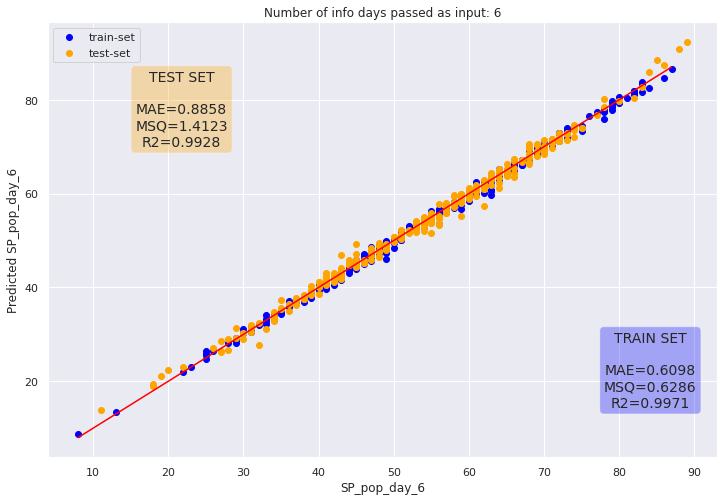

Number of input  91
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


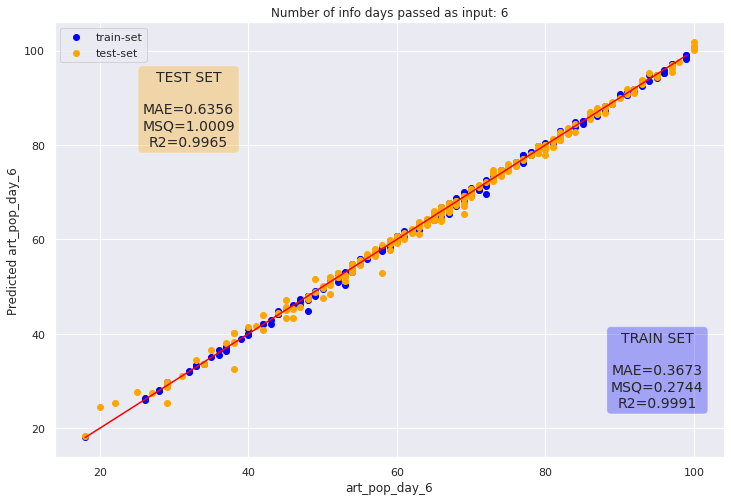

Number of input  91
Starting NN optimization!


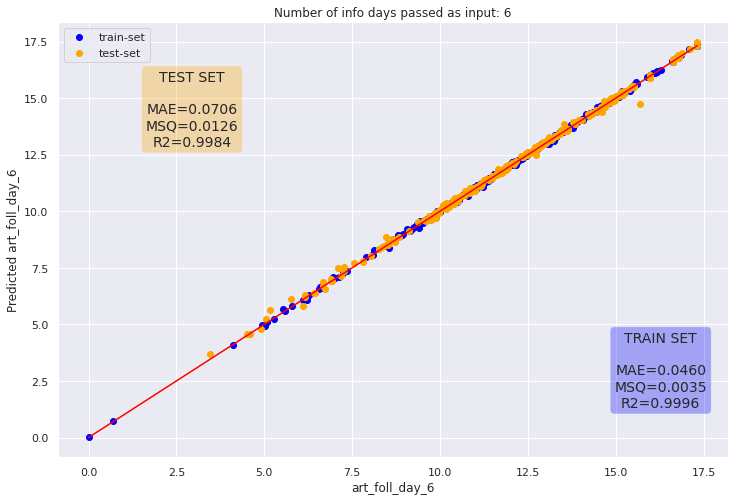

Number of input  91
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


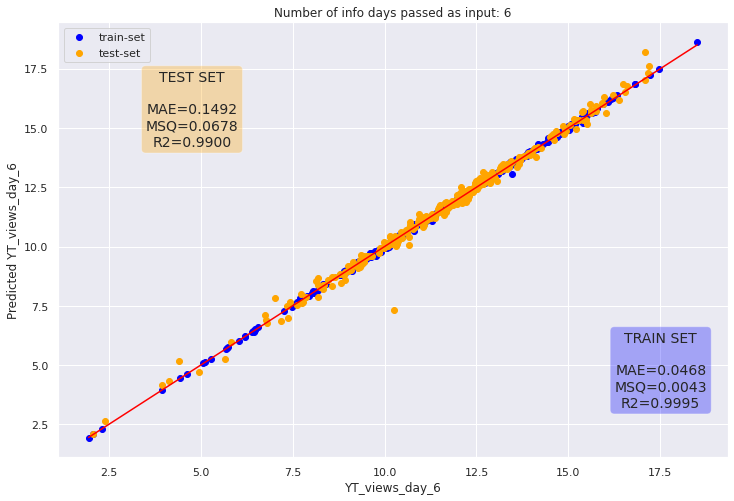

Number of input  91
Starting NN optimization!


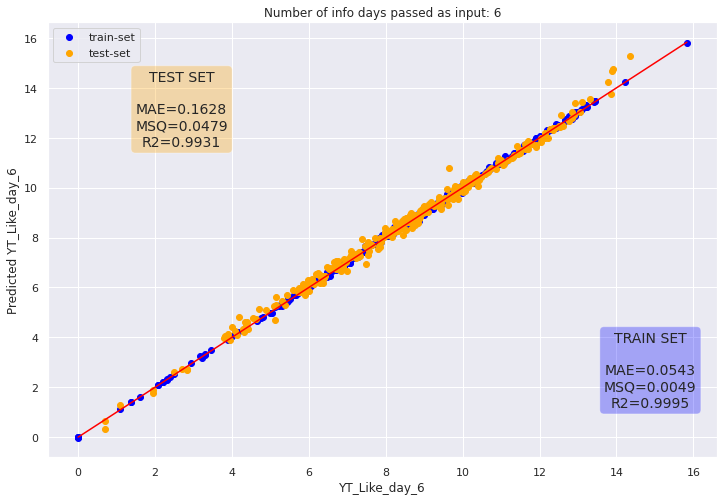

Number of input  91
Starting NN optimization!


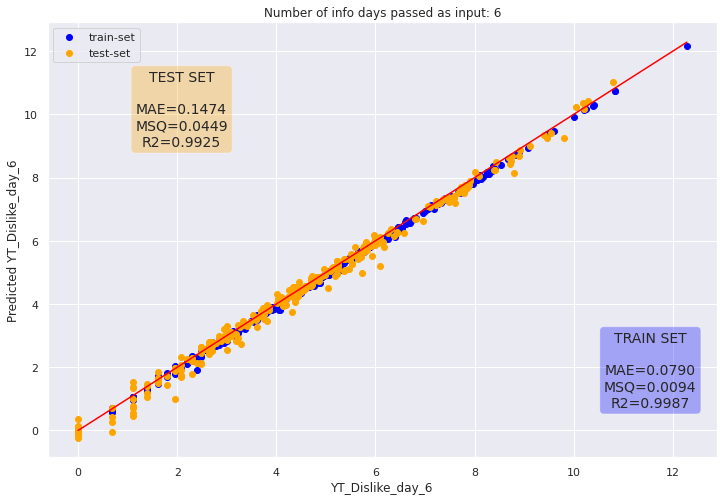

Number of input  91
Starting NN optimization!


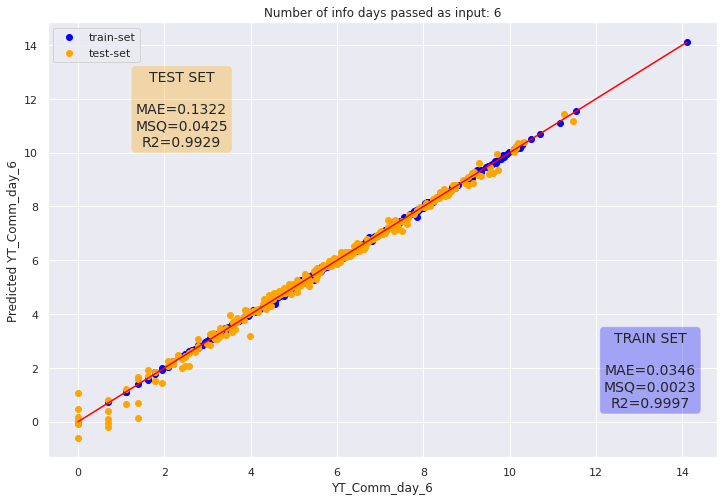

Number of input  91
Starting NN optimization!


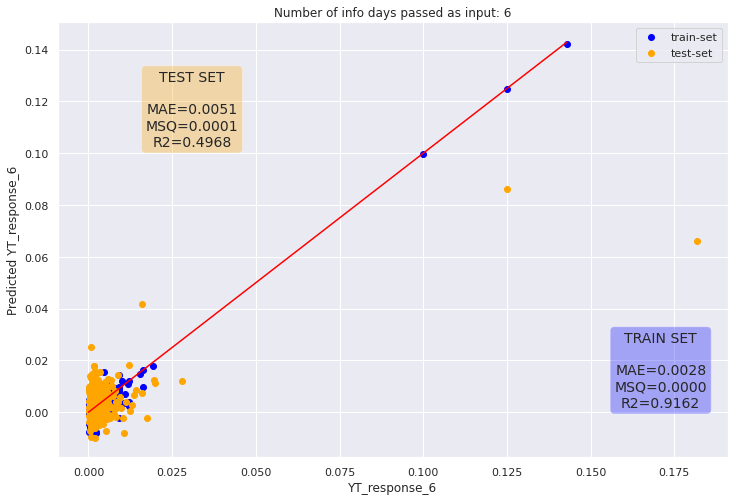

Number of input  91
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


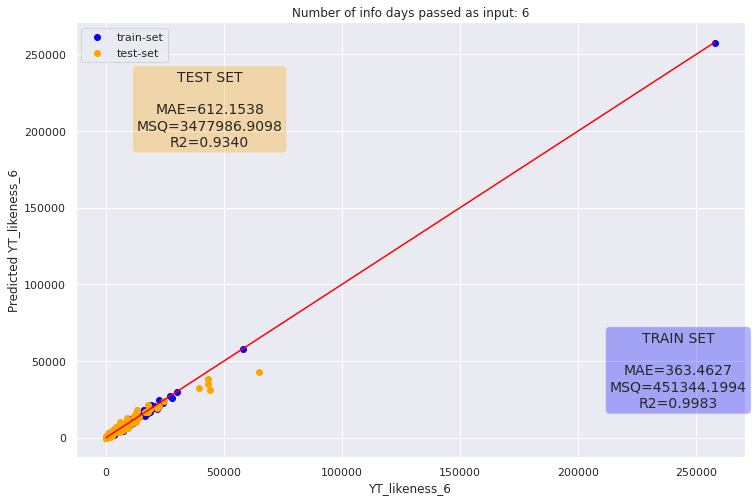

Number of input  91
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


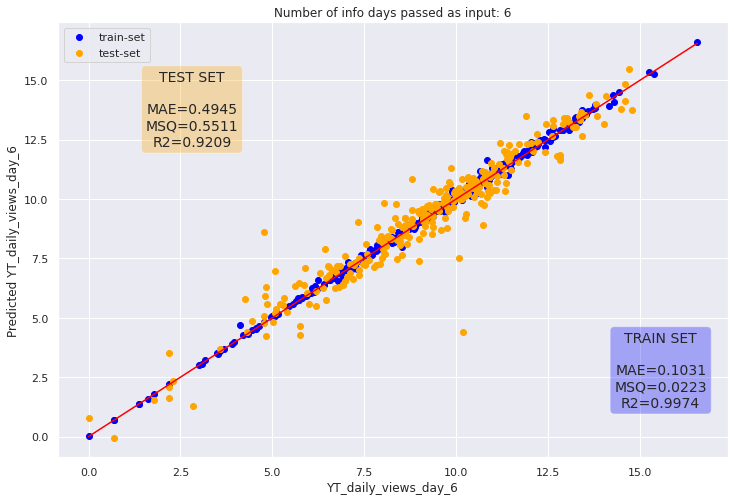

Number of input  91
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


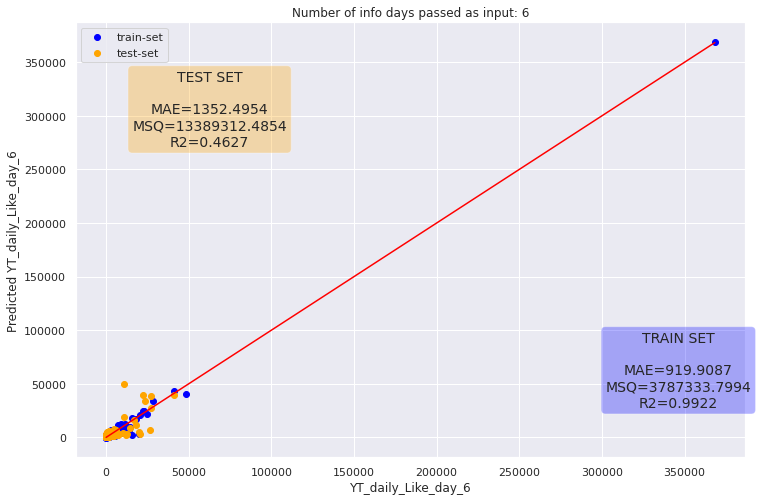

Number of input  91
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


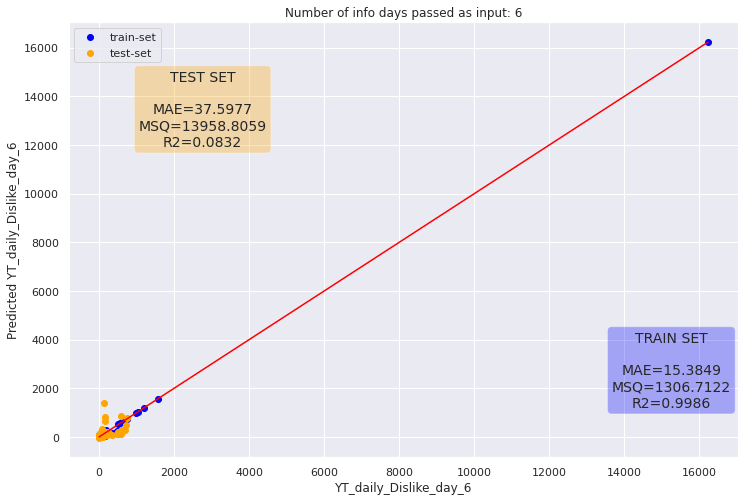

Number of input  91
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


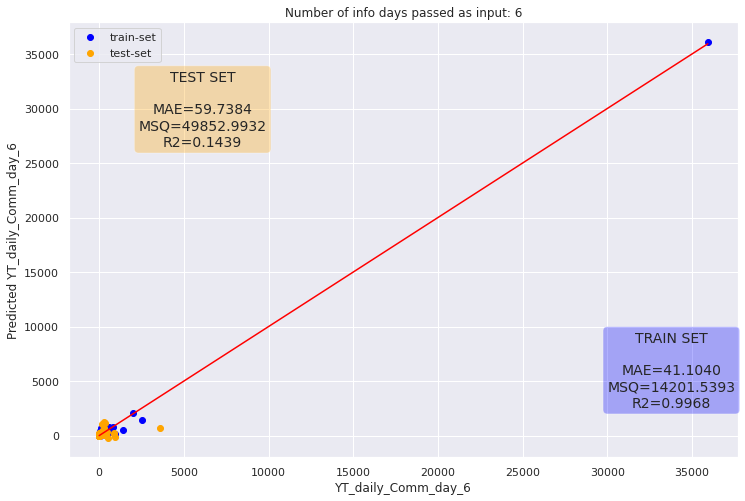

Number of input  104
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


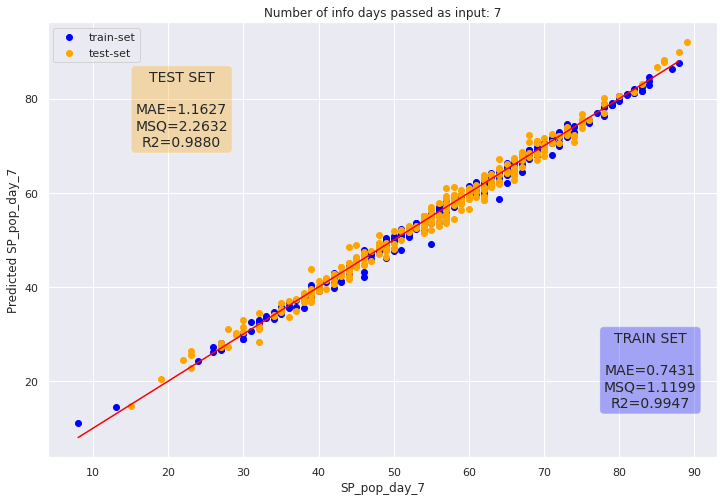

Number of input  104
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


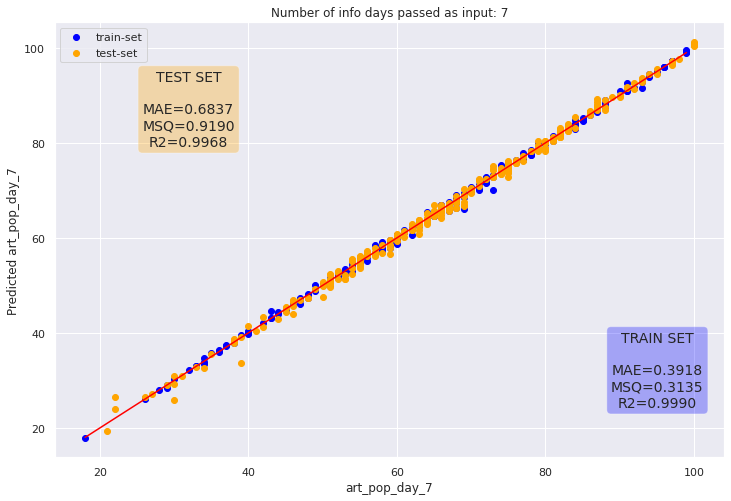

Number of input  104
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


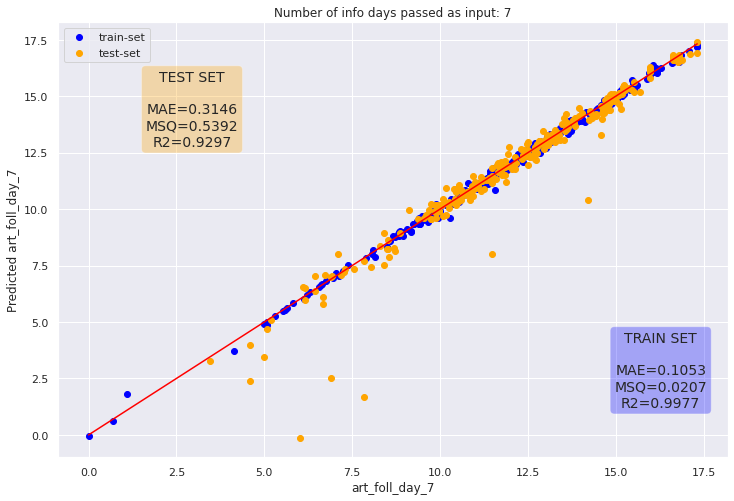

Number of input  104
Starting NN optimization!


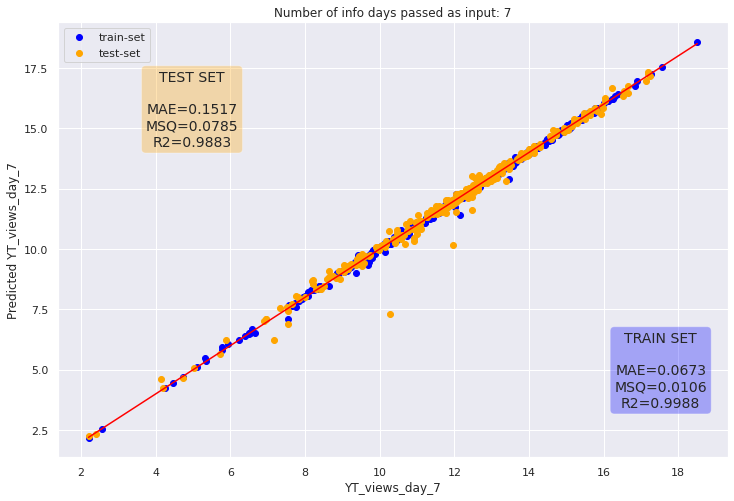

Number of input  104
Starting NN optimization!


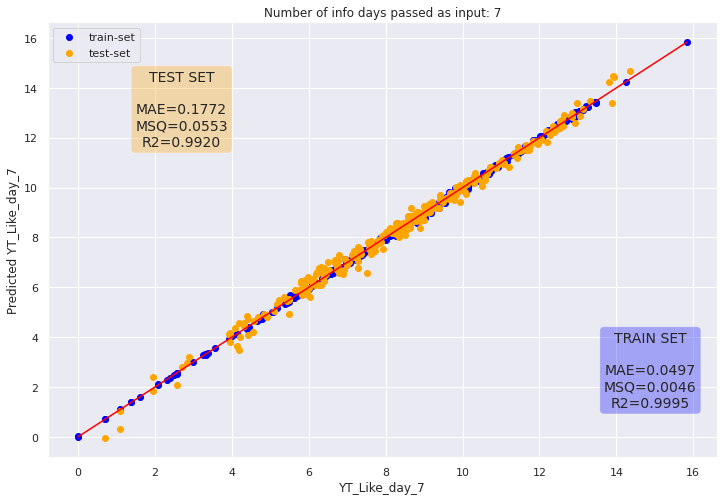

Number of input  104
Starting NN optimization!


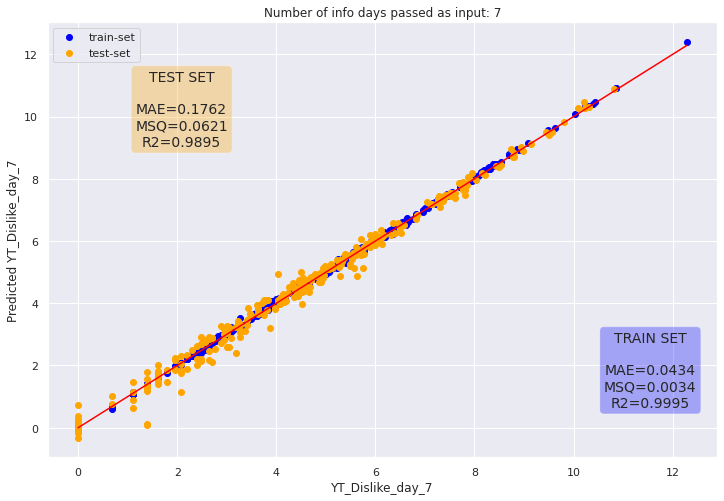

Number of input  104
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


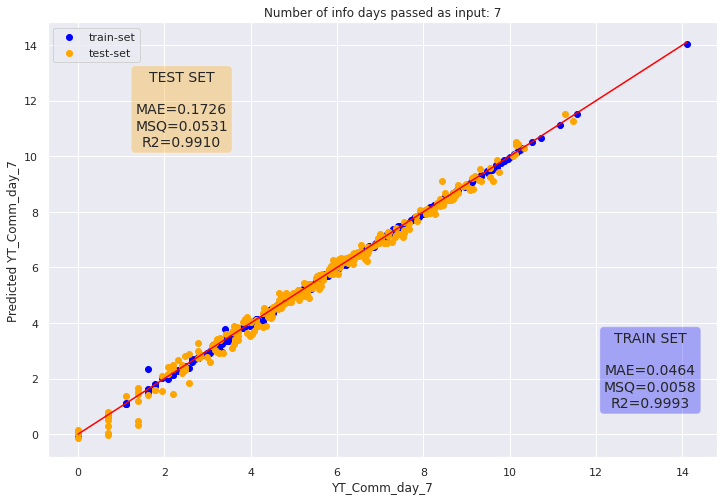

Number of input  104
Starting NN optimization!


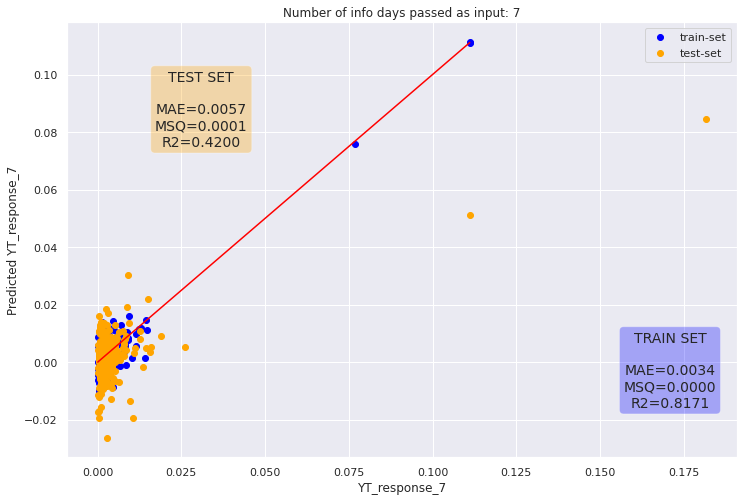

Number of input  104
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


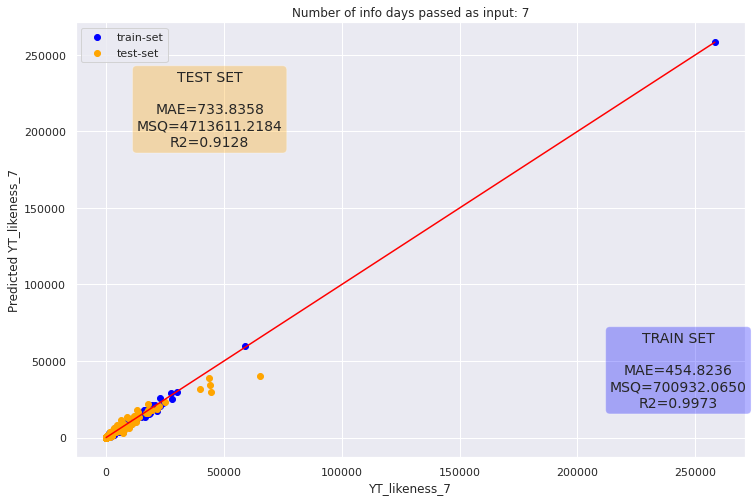

Number of input  104
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


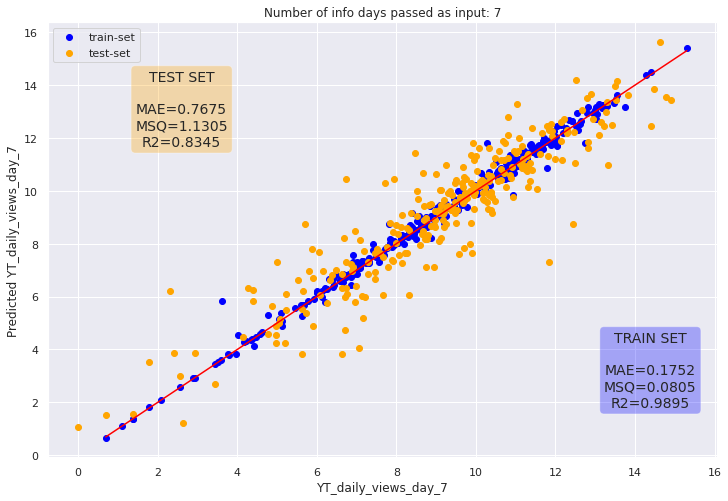

Number of input  104
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


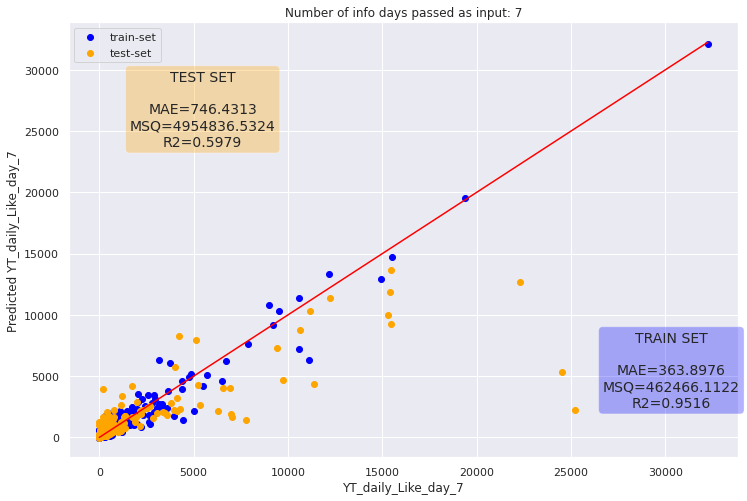

Number of input  104
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


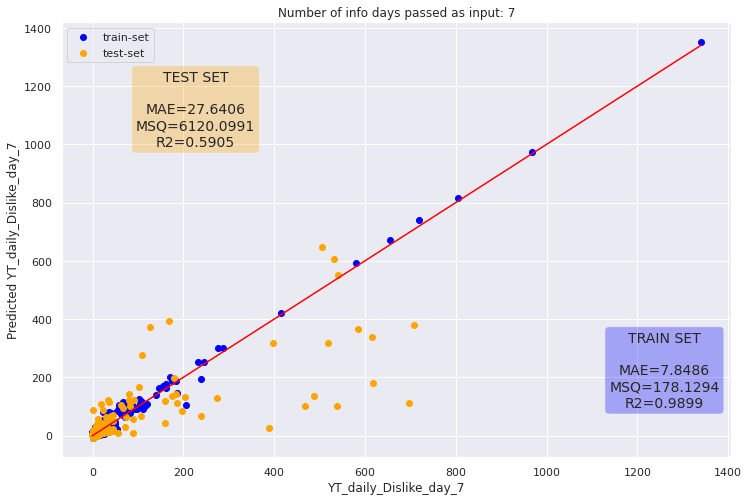

Number of input  104
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


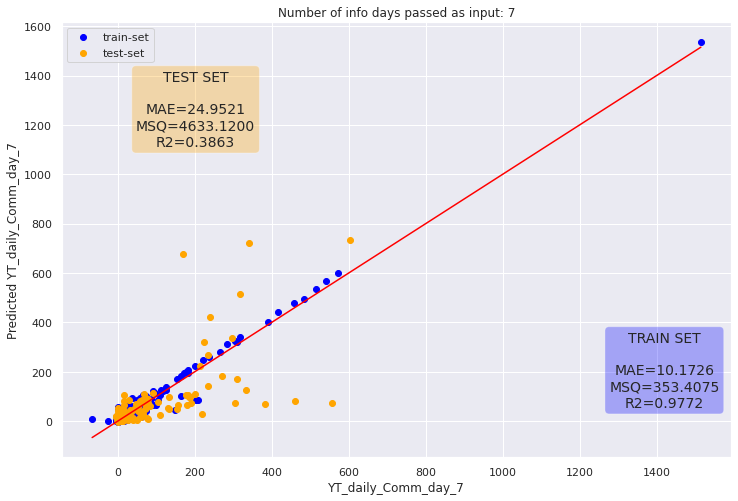

Number of input  117
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


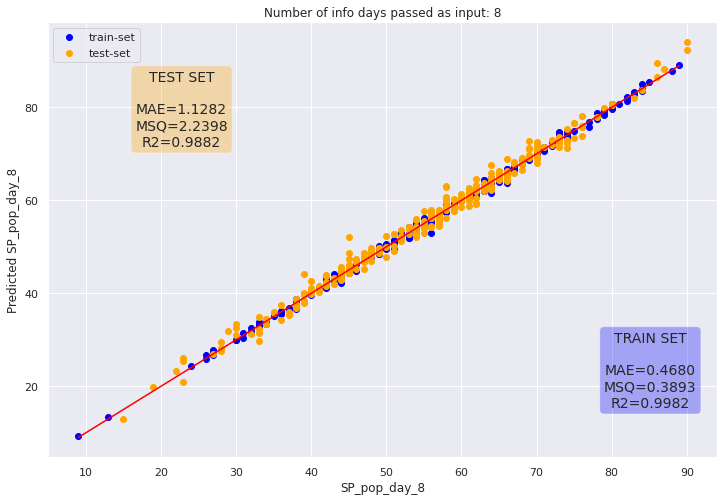

Number of input  117
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


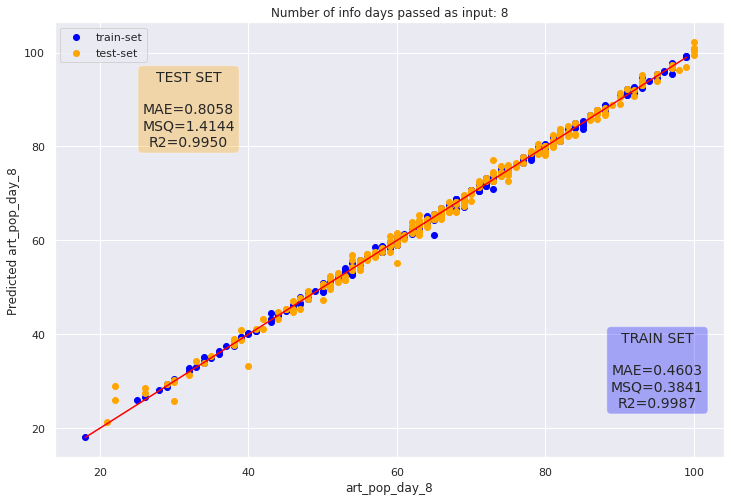

Number of input  117
Starting NN optimization!


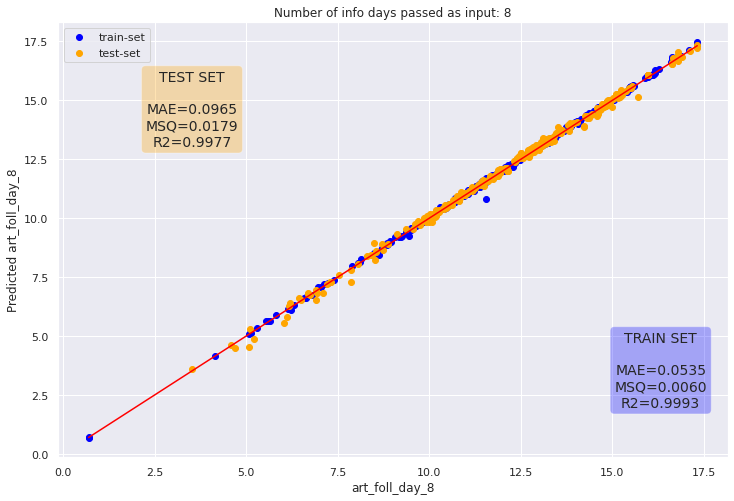

Number of input  117
Starting NN optimization!


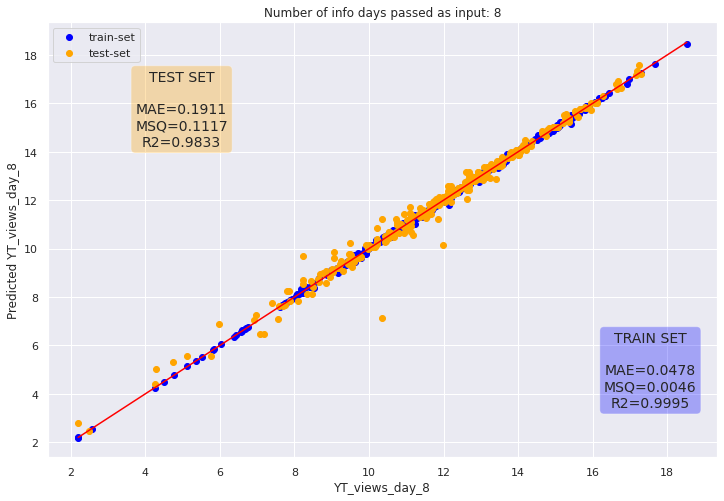

Number of input  117
Starting NN optimization!


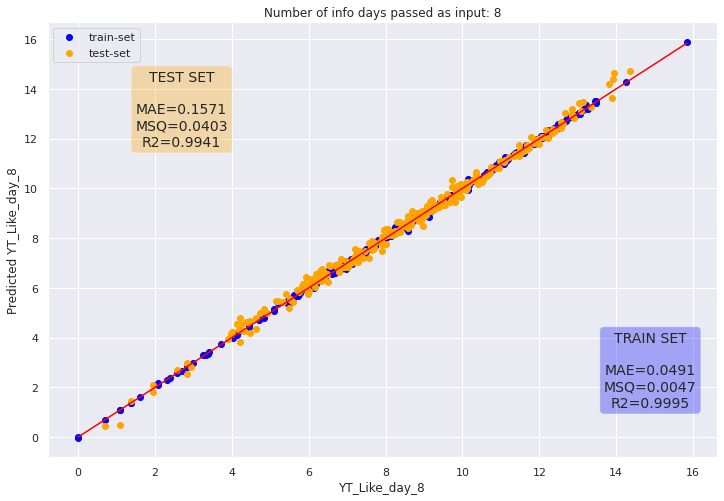

Number of input  117
Starting NN optimization!


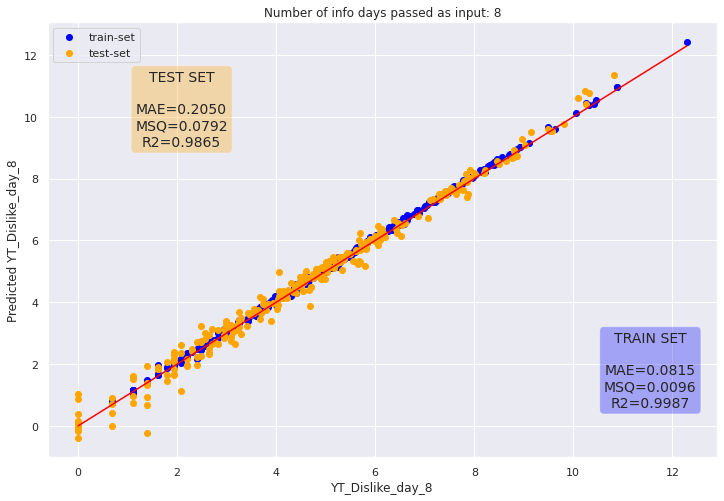

Number of input  117
Starting NN optimization!


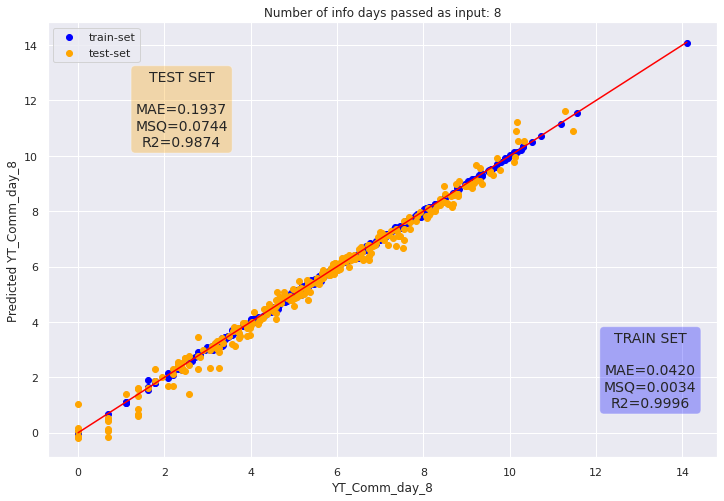

Number of input  117
Starting NN optimization!


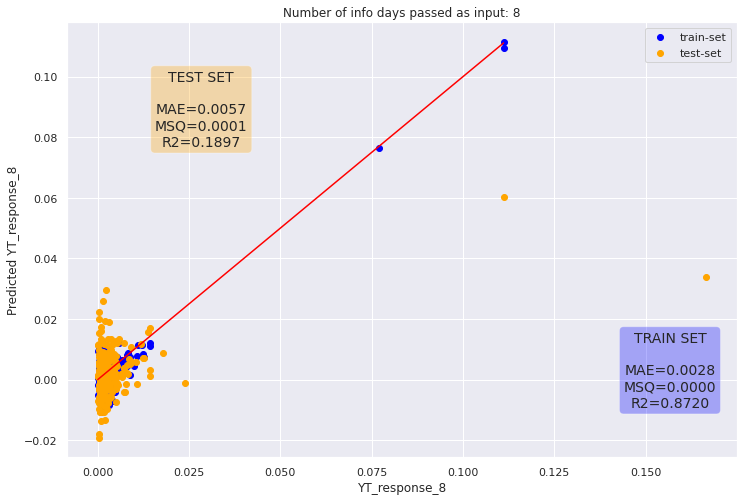

Number of input  117
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


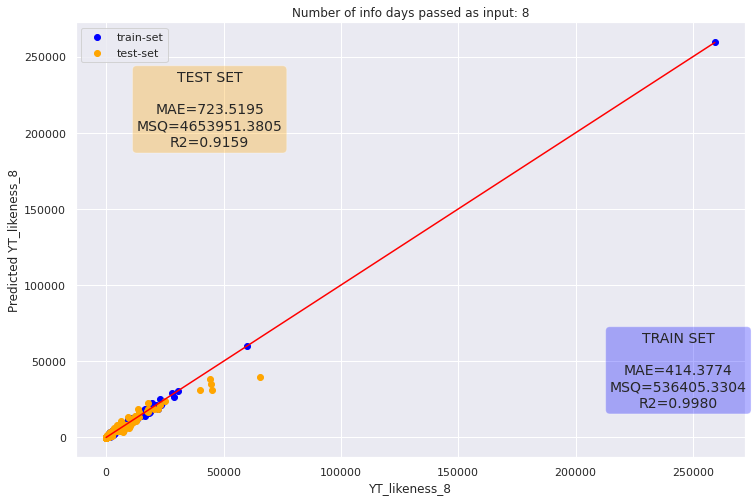

Number of input  117
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


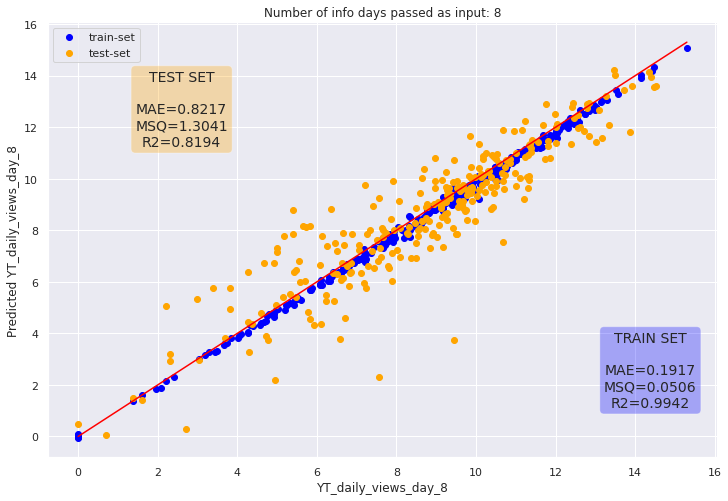

Number of input  117
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


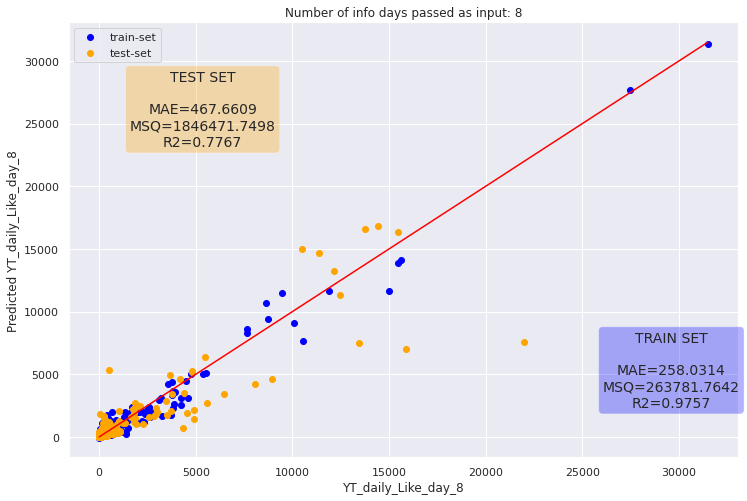

Number of input  117
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


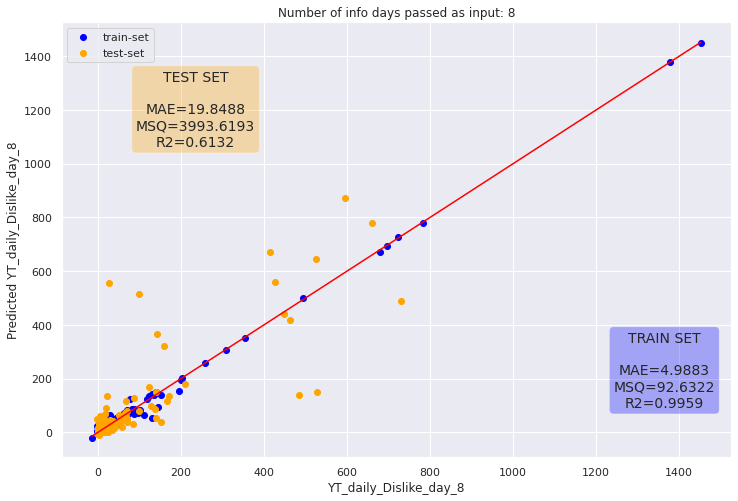

Number of input  117
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


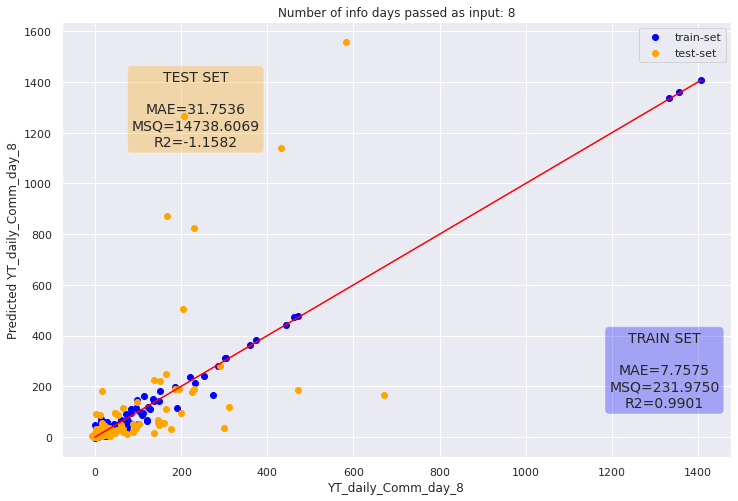

Number of input  130
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


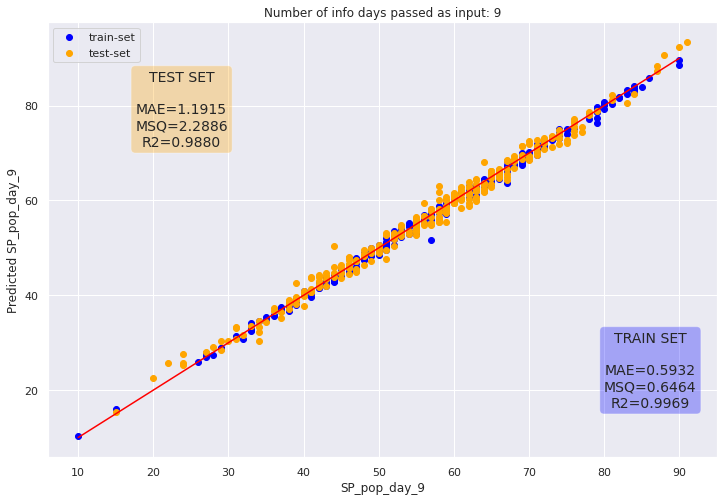

Number of input  130
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


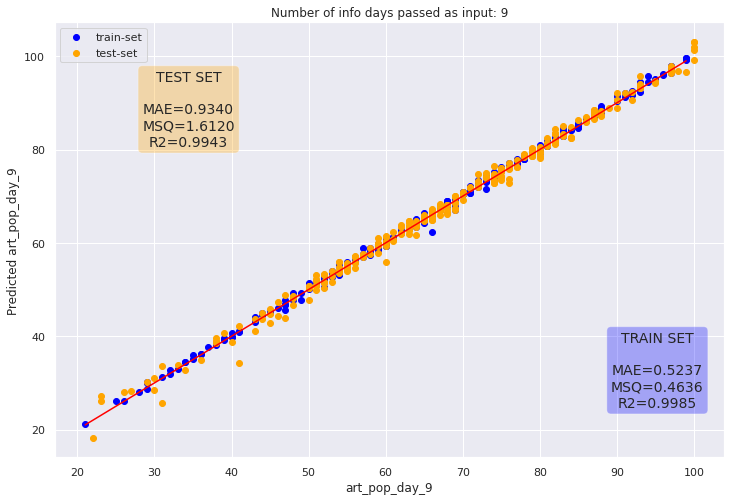

Number of input  130
Starting NN optimization!


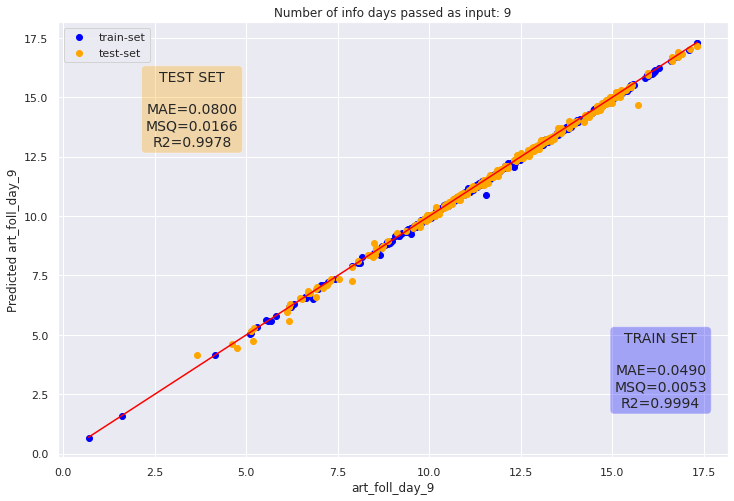

Number of input  130
Starting NN optimization!


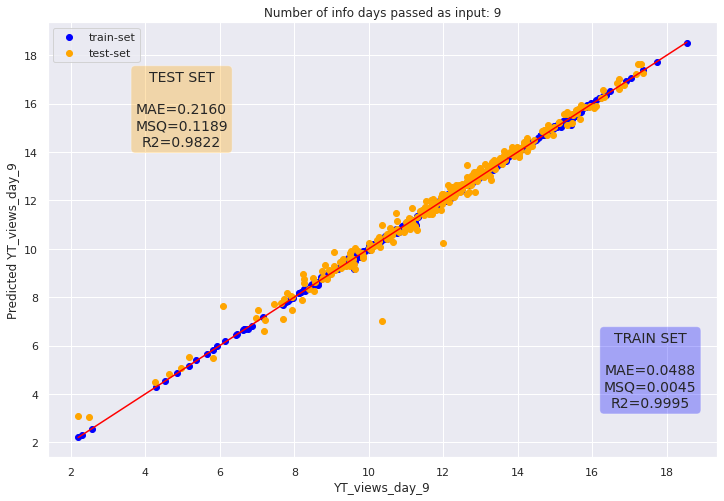

Number of input  130
Starting NN optimization!


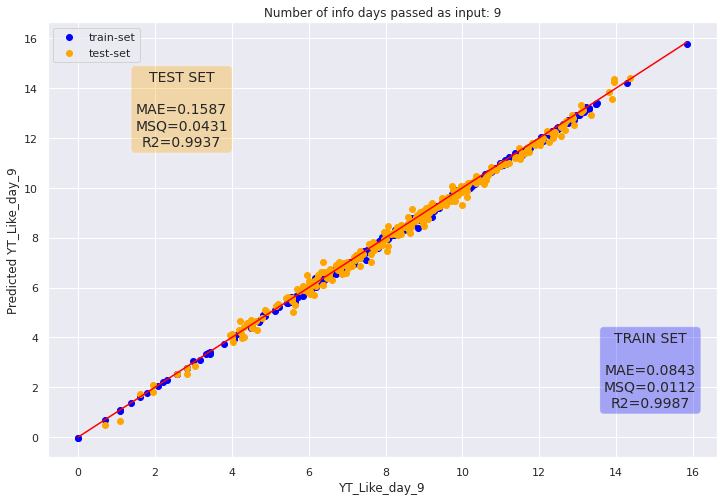

Number of input  130
Starting NN optimization!


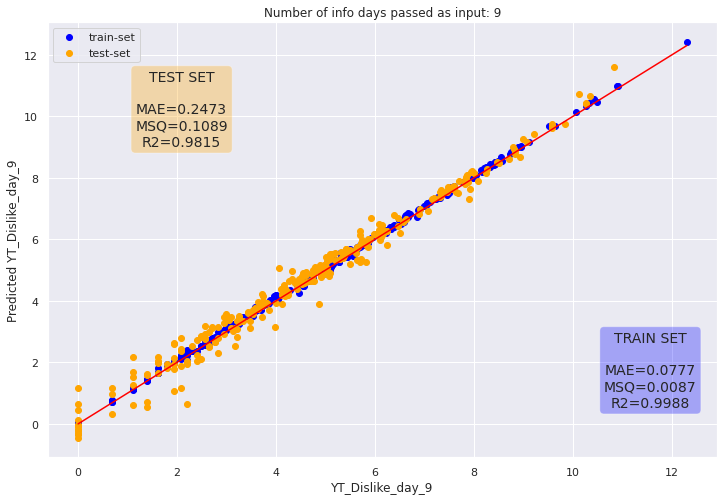

Number of input  130
Starting NN optimization!


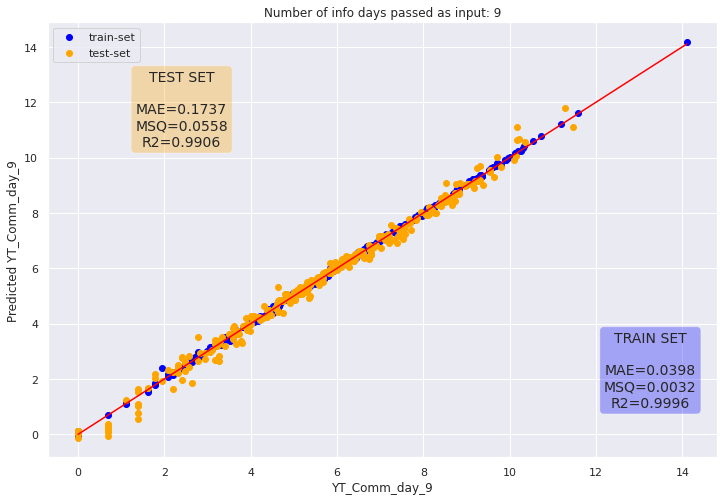

Number of input  130
Starting NN optimization!


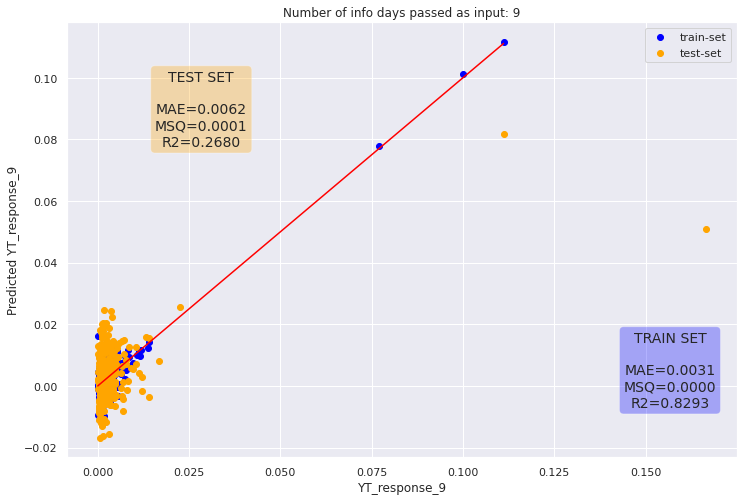

Number of input  130
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


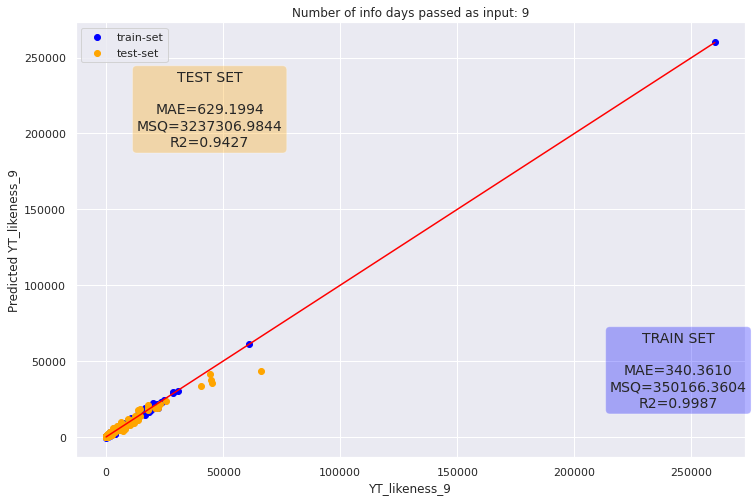

Number of input  130
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


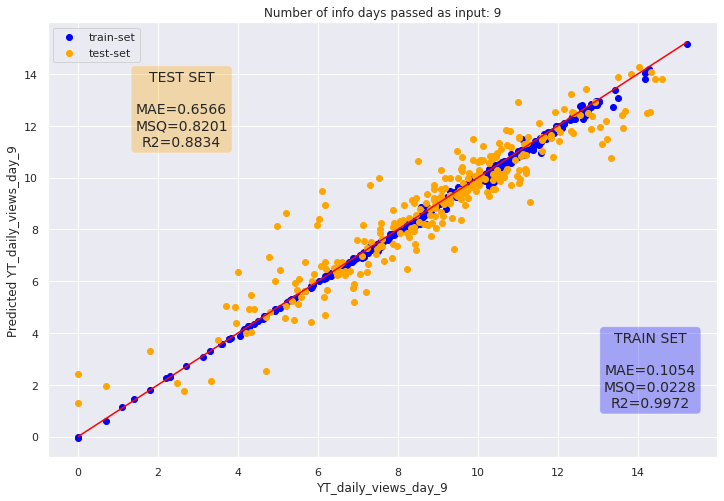

Number of input  130
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


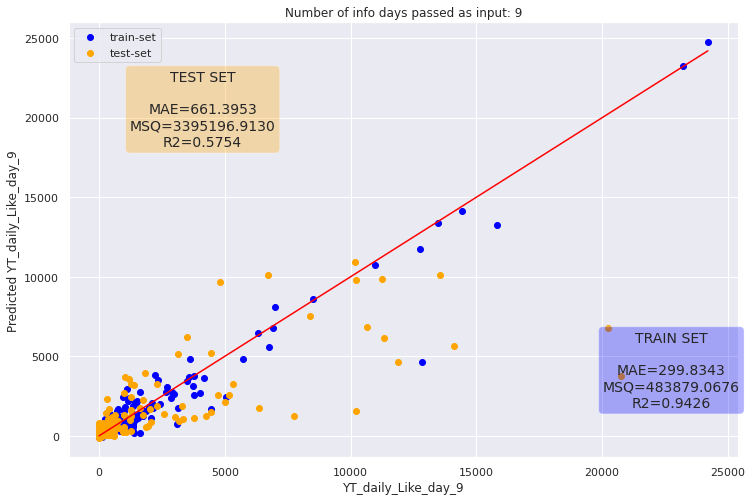

Number of input  130
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


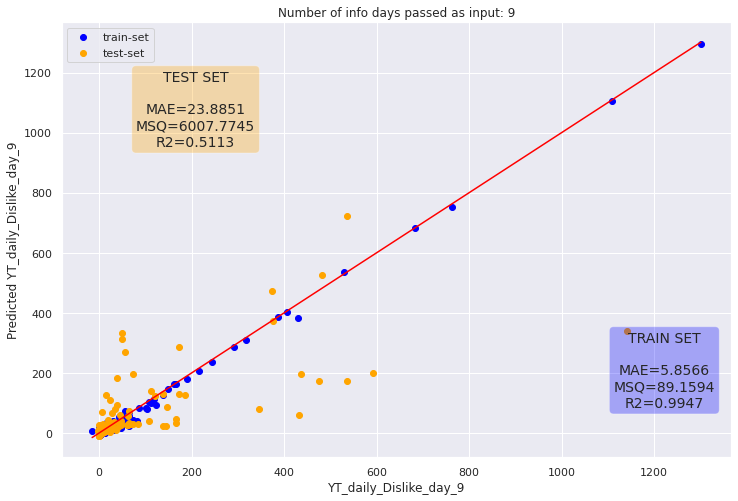

Number of input  130
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


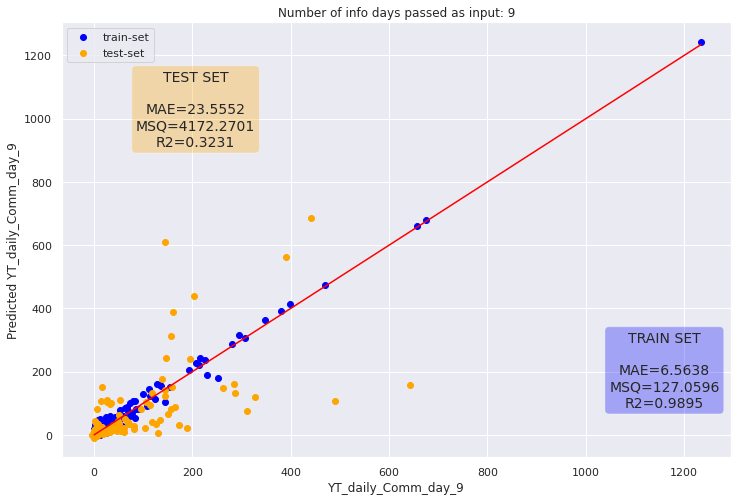

Number of input  143
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


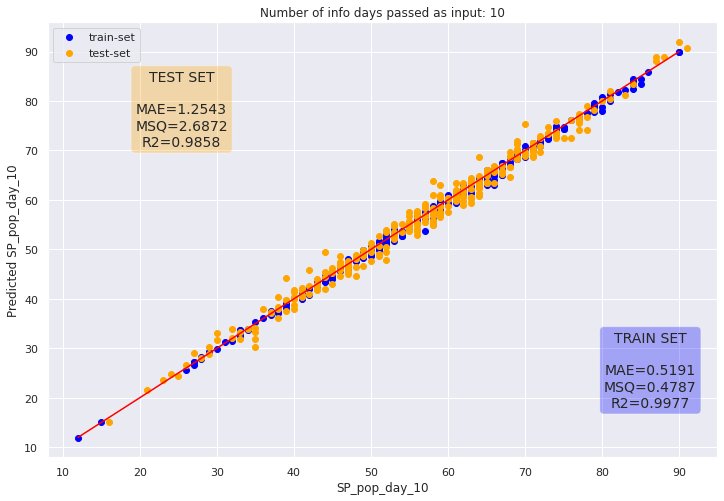

Number of input  143
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


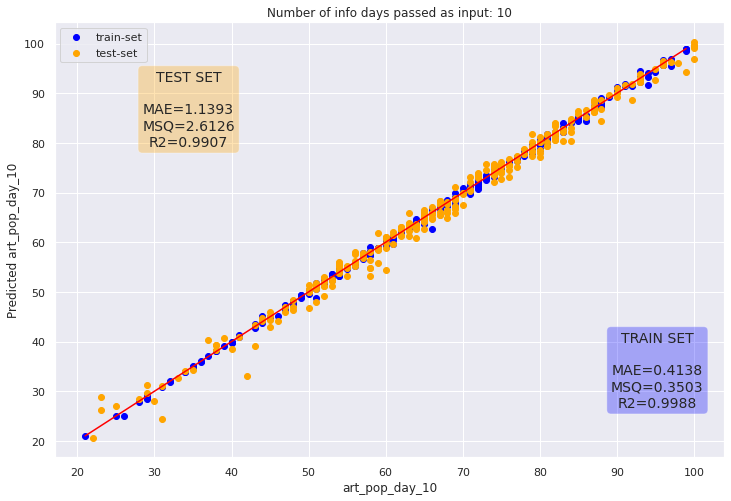

Number of input  143
Starting NN optimization!


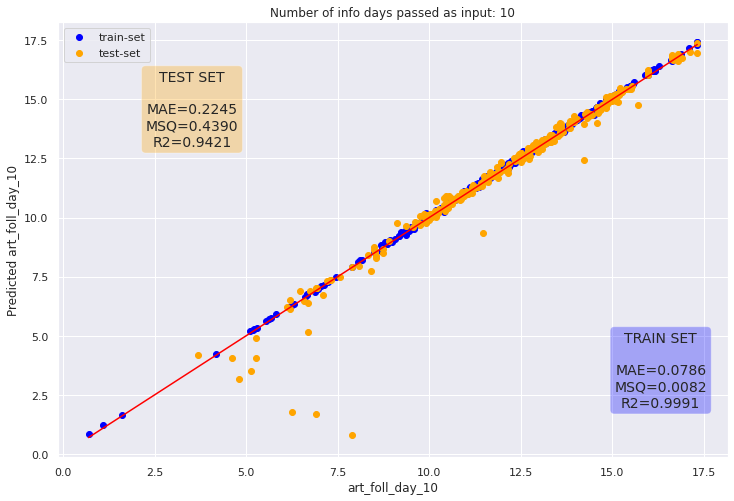

Number of input  143
Starting NN optimization!


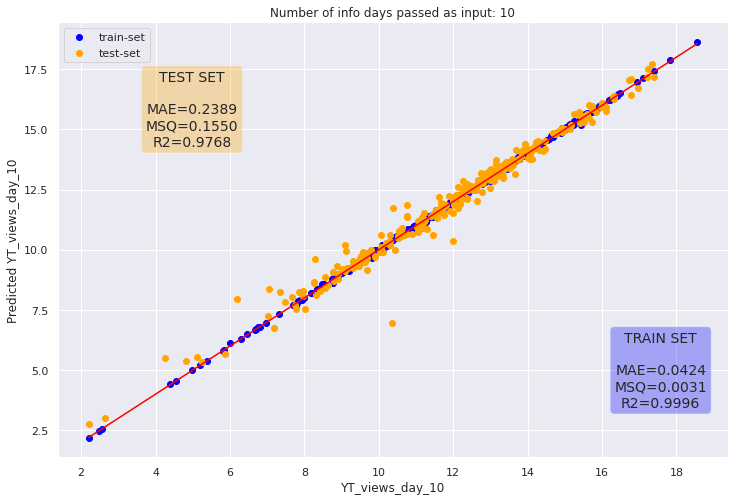

Number of input  143
Starting NN optimization!


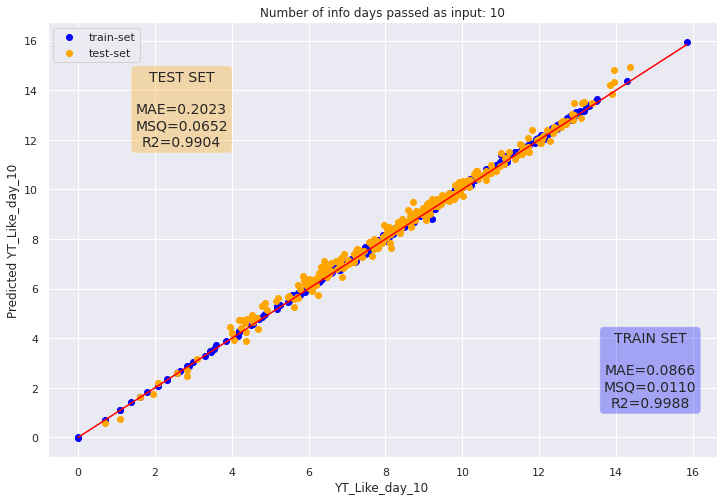

Number of input  143
Starting NN optimization!


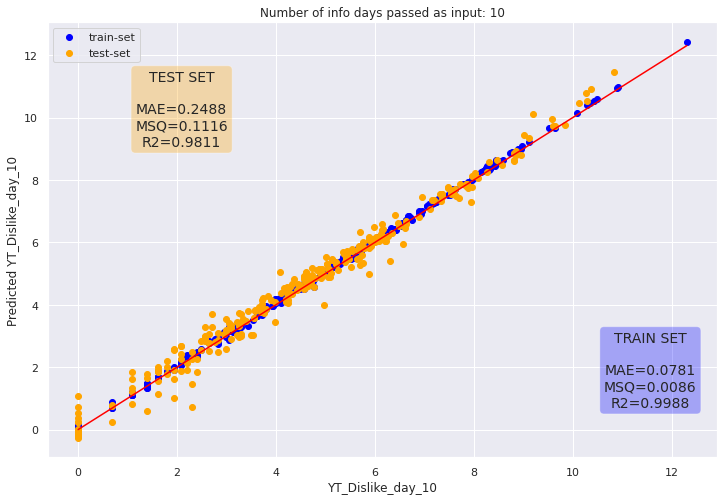

Number of input  143
Starting NN optimization!


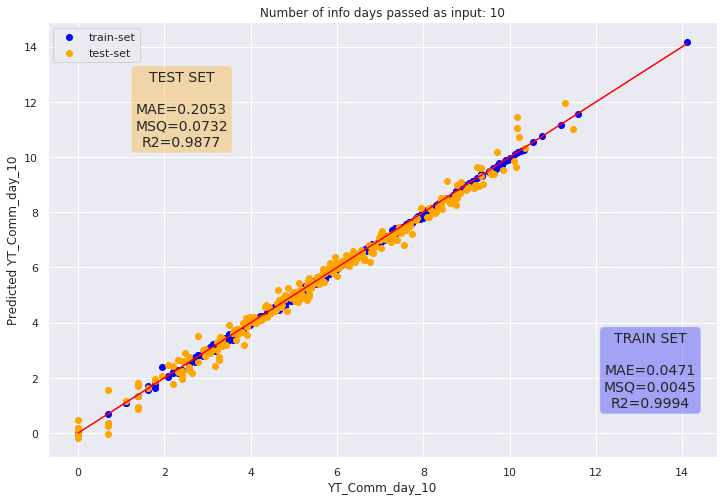

Number of input  143
Starting NN optimization!


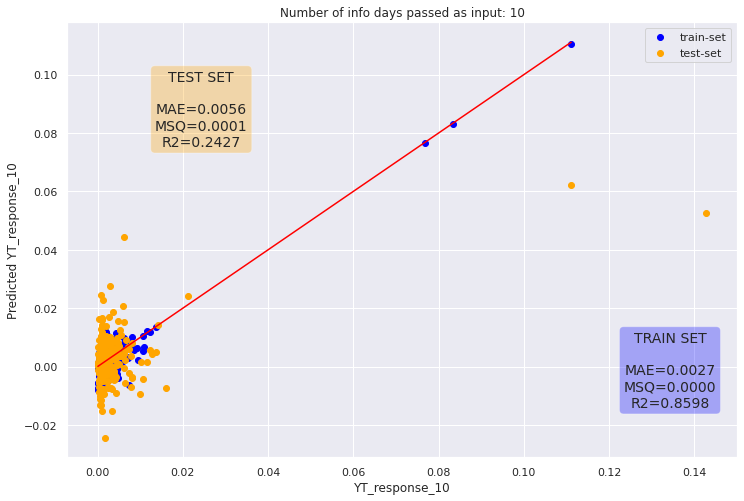

Number of input  143
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


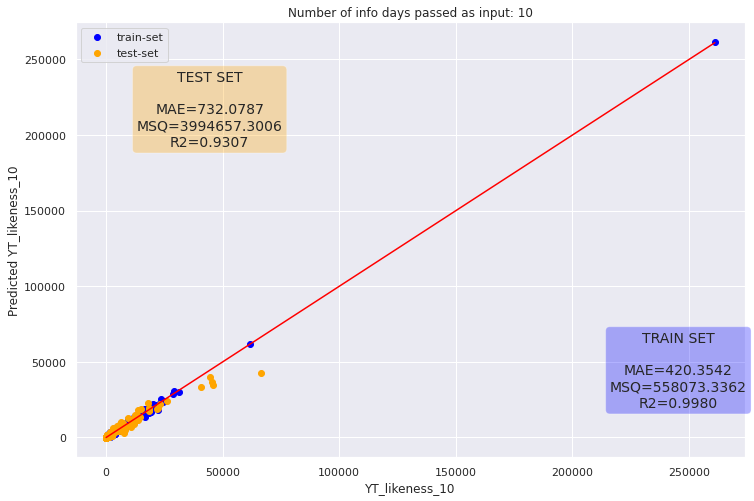

Number of input  143
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


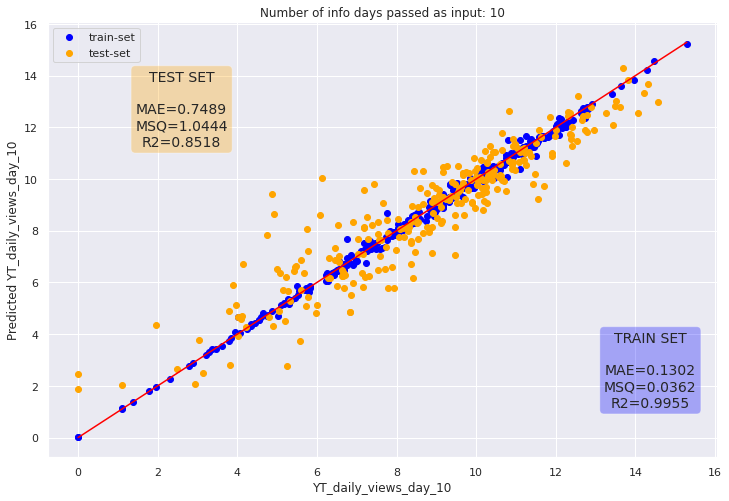

Number of input  143
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


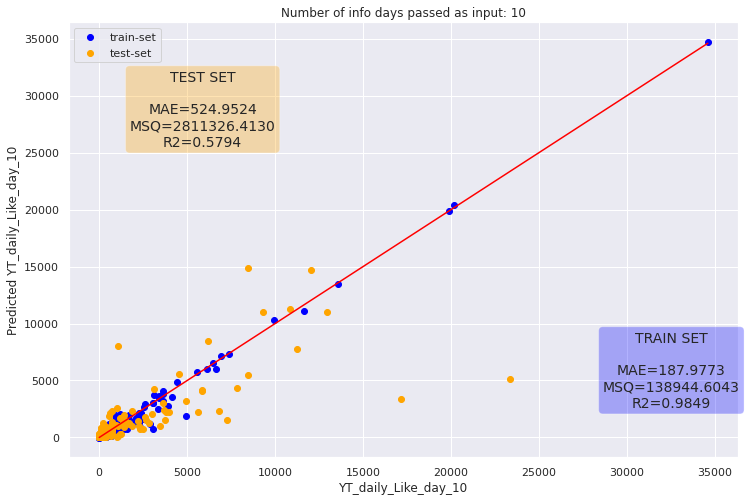

Number of input  143
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


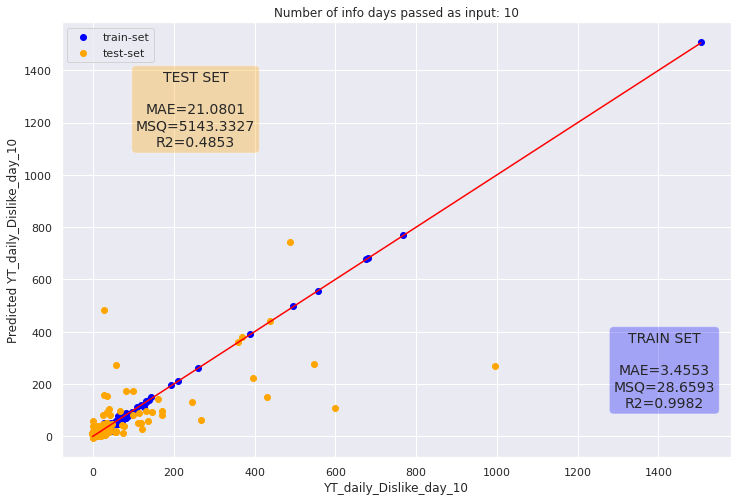

Number of input  143
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


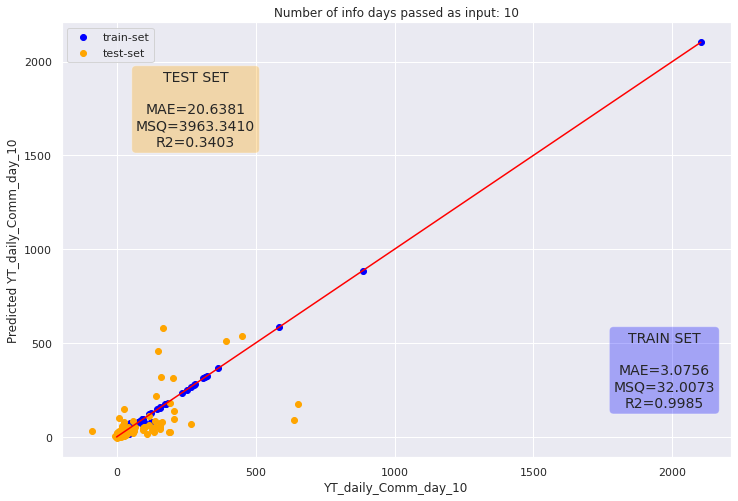

Number of input  156
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


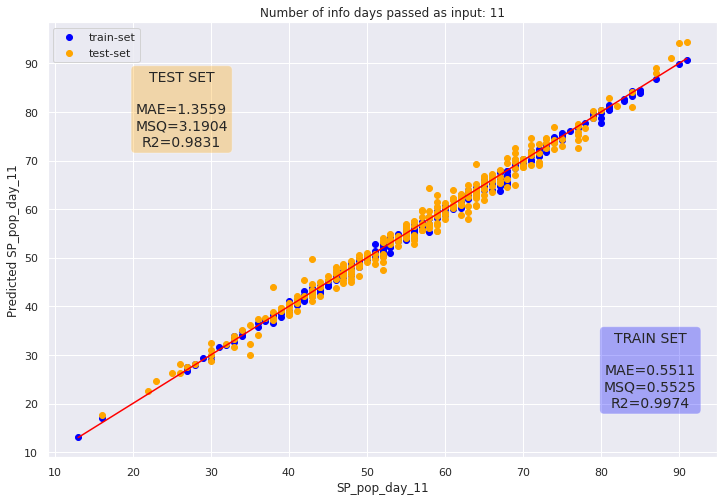

Number of input  156
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


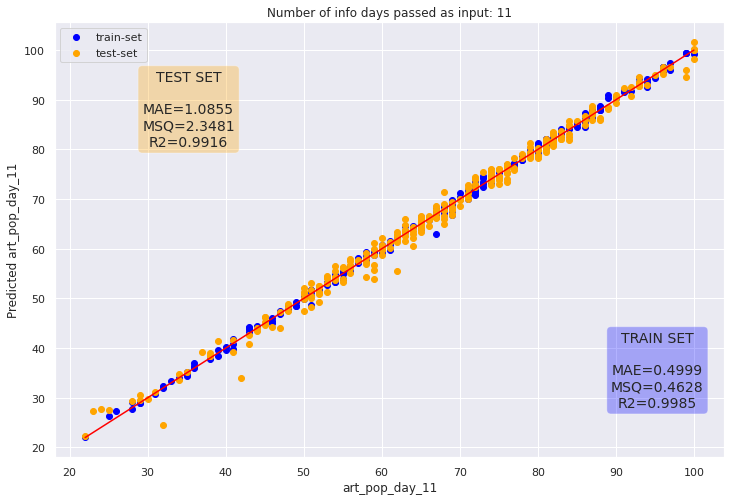

Number of input  156
Starting NN optimization!


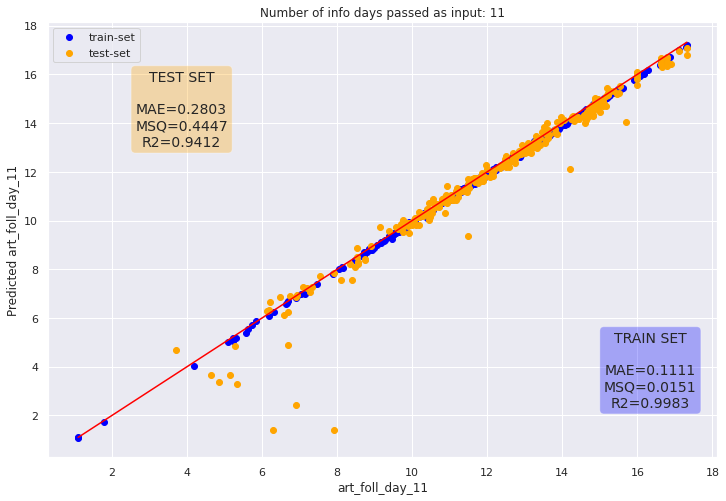

Number of input  156
Starting NN optimization!


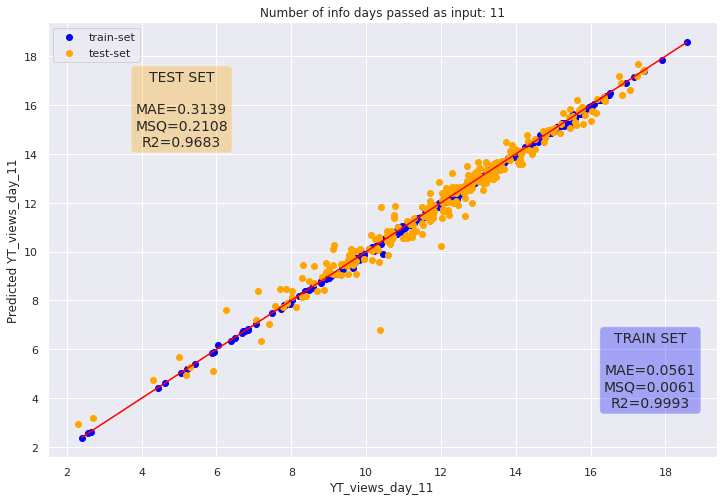

Number of input  156
Starting NN optimization!


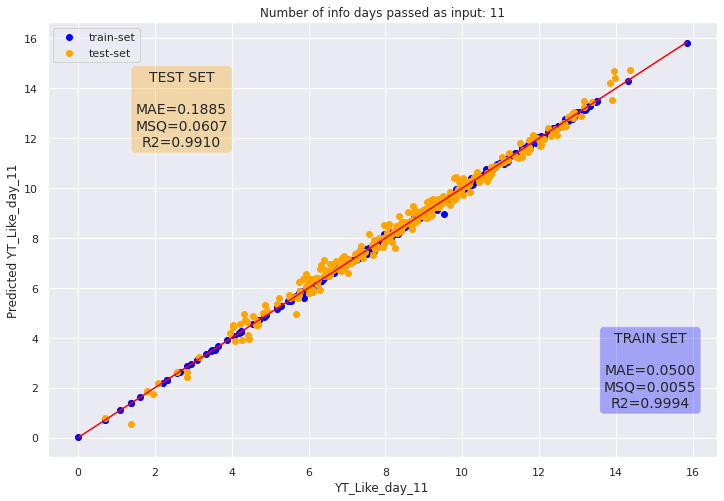

Number of input  156
Starting NN optimization!


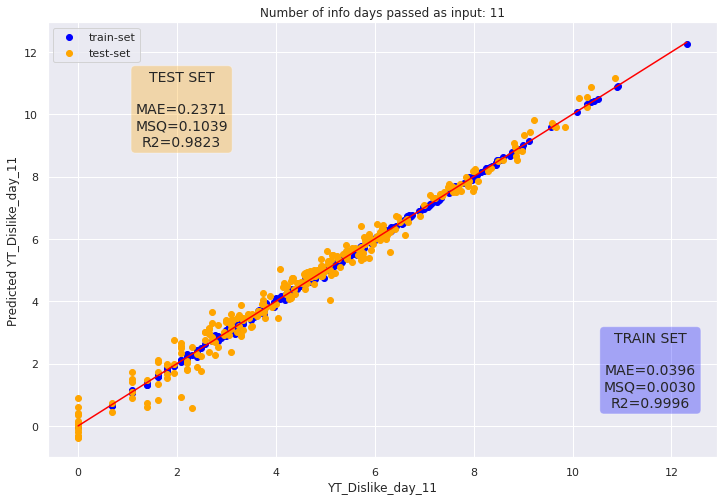

Number of input  156
Starting NN optimization!


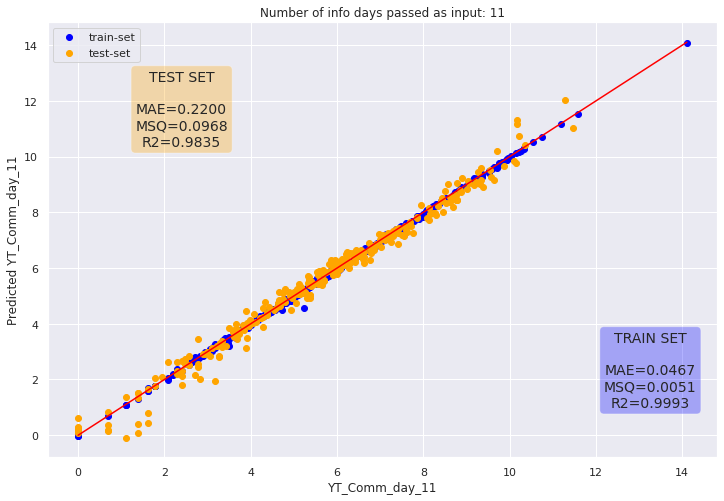

Number of input  156
Starting NN optimization!


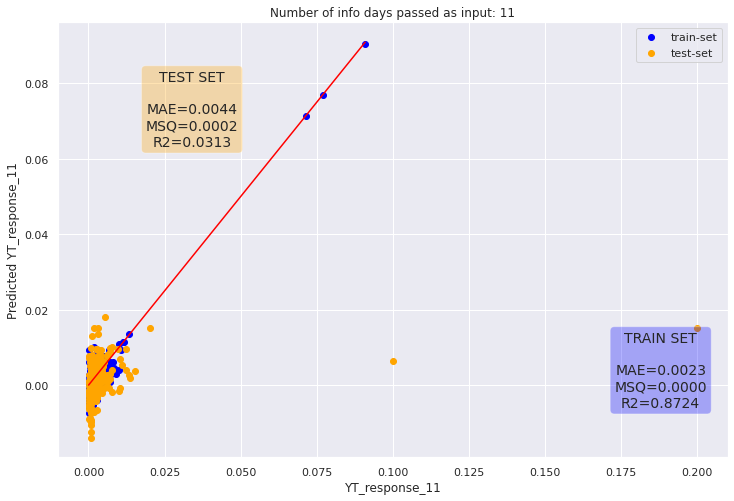

Number of input  156
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


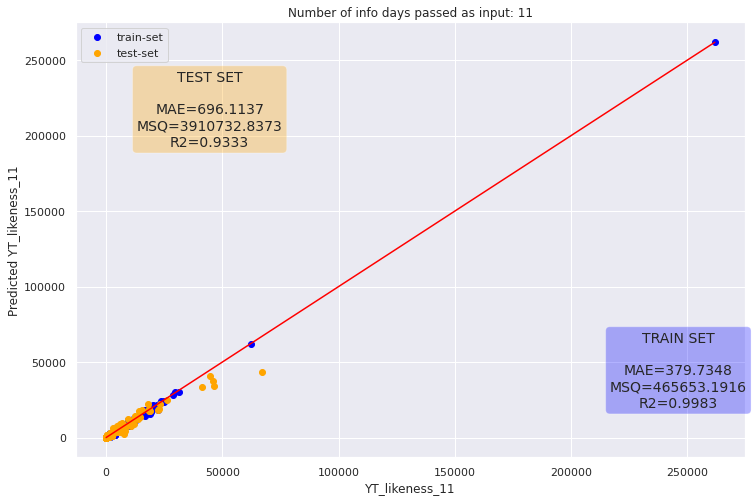

Number of input  156
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


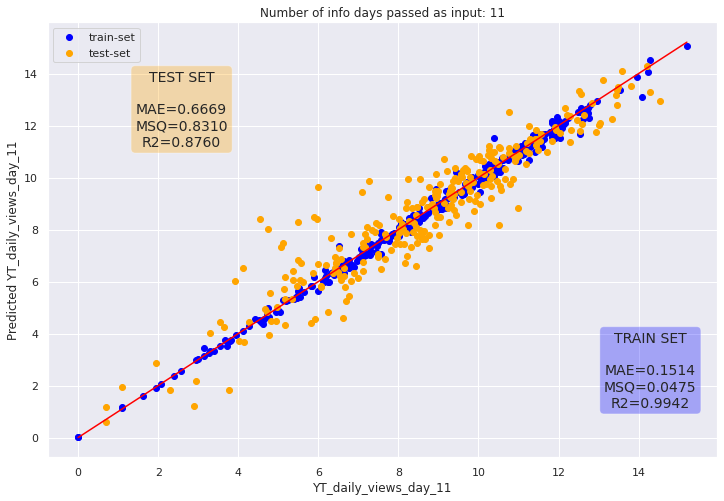

Number of input  156
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


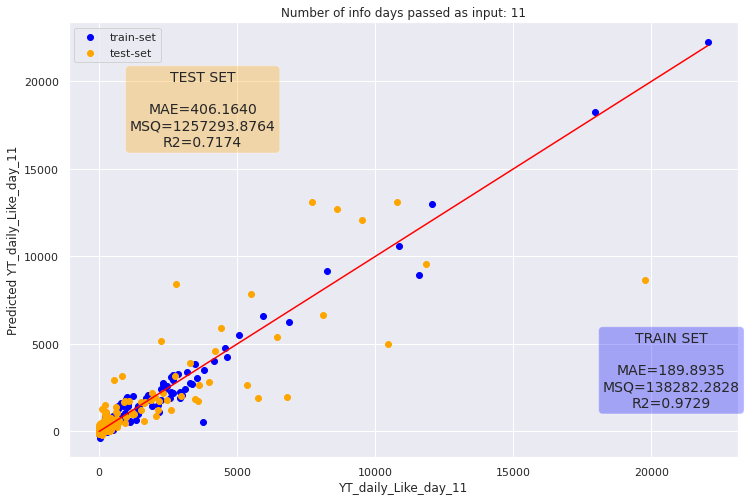

Number of input  156
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


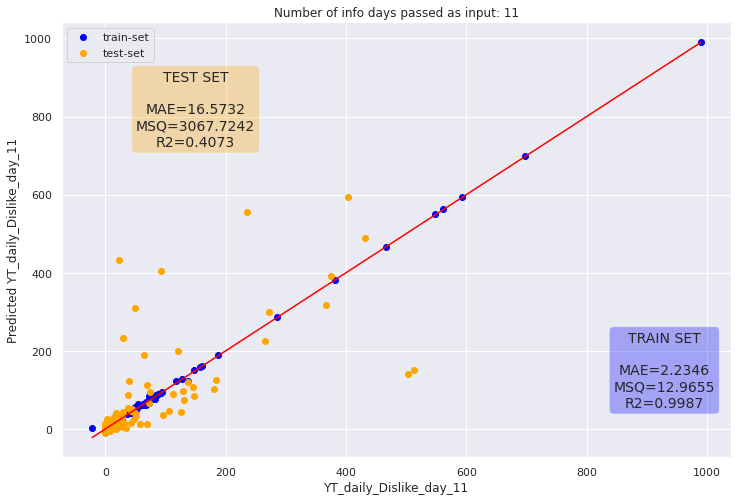

Number of input  156
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


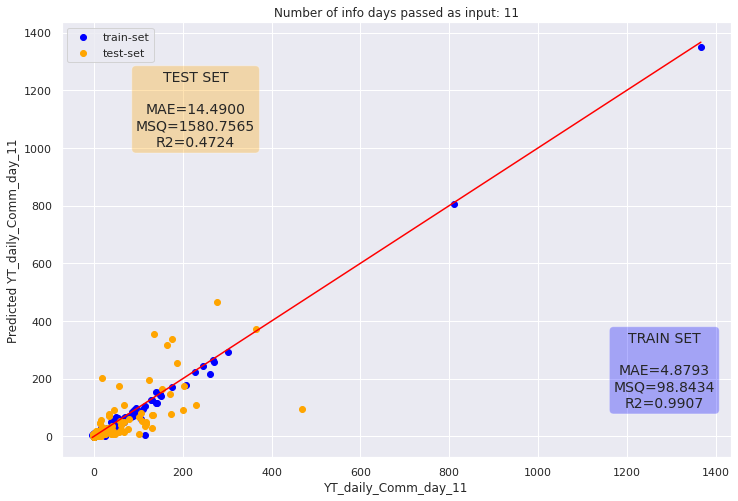

Number of input  169
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


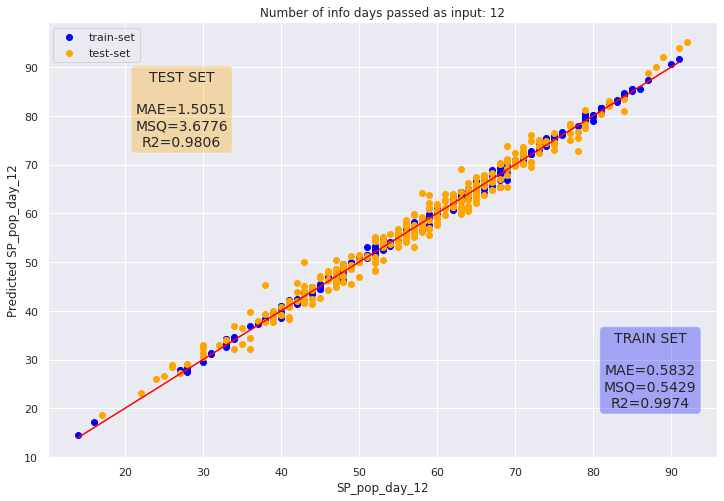

Number of input  169
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


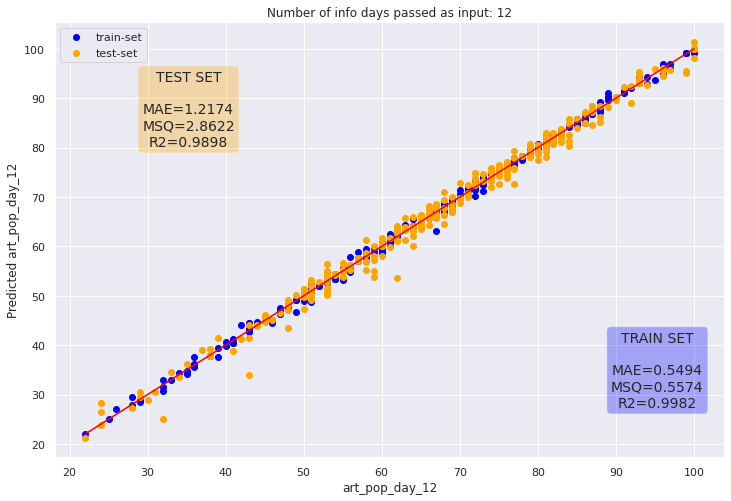

Number of input  169
Starting NN optimization!


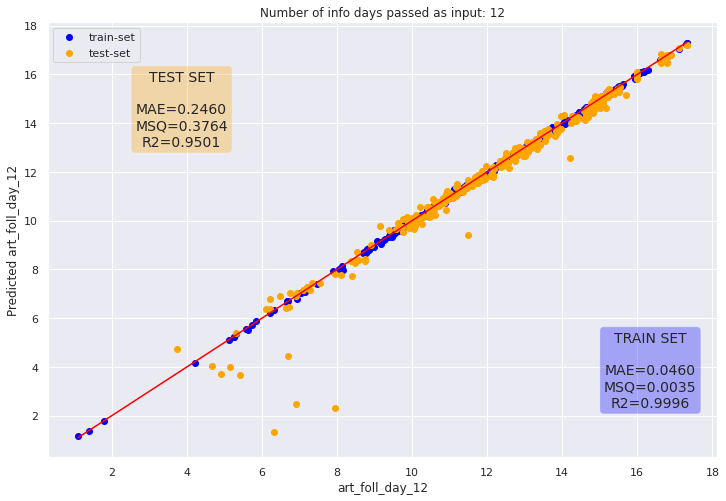

Number of input  169
Starting NN optimization!


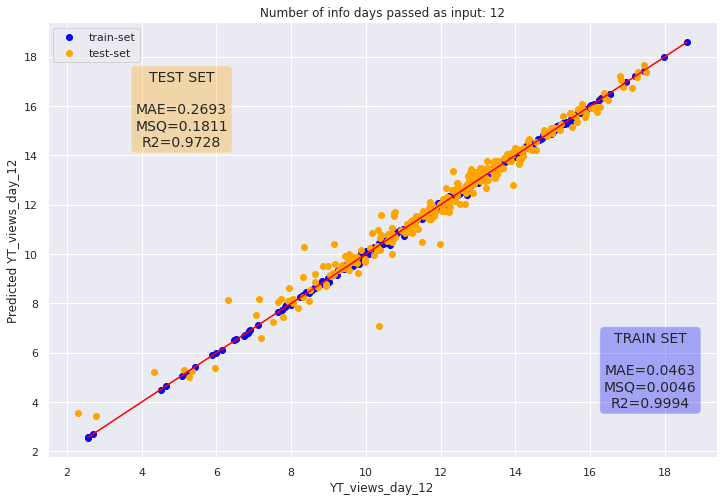

Number of input  169
Starting NN optimization!


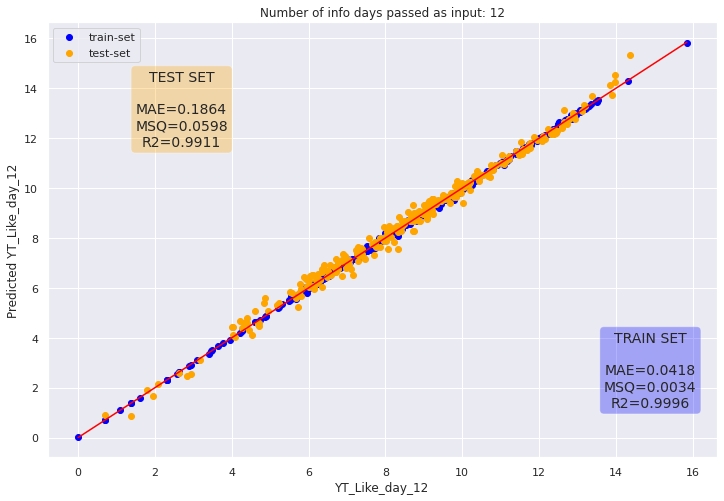

Number of input  169
Starting NN optimization!


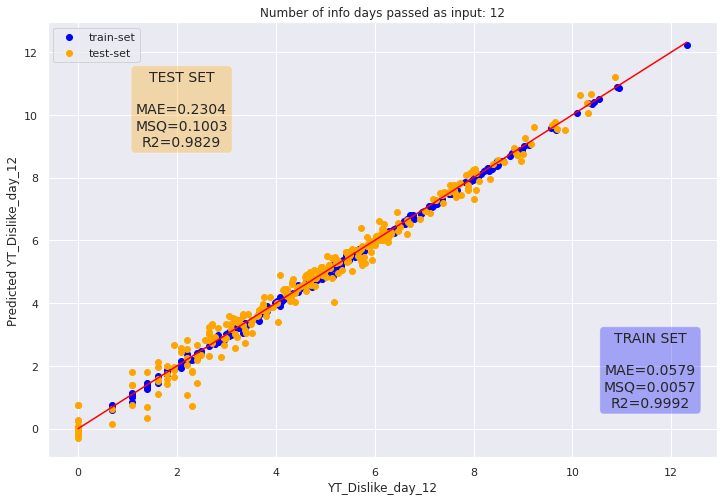

Number of input  169
Starting NN optimization!


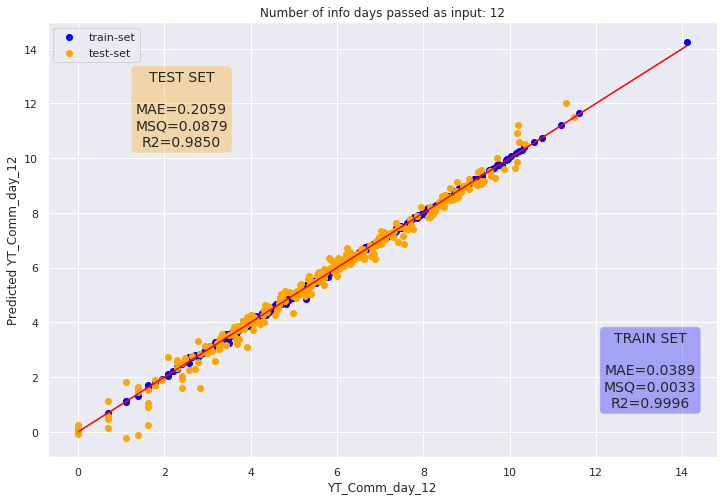

Number of input  169
Starting NN optimization!


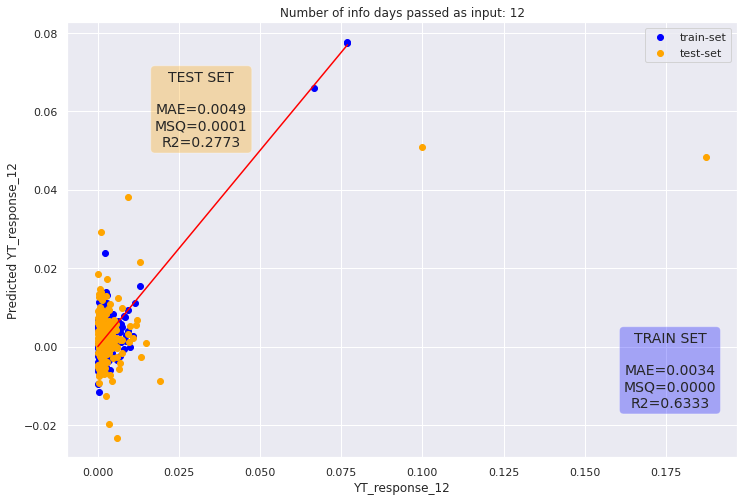

Number of input  169
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


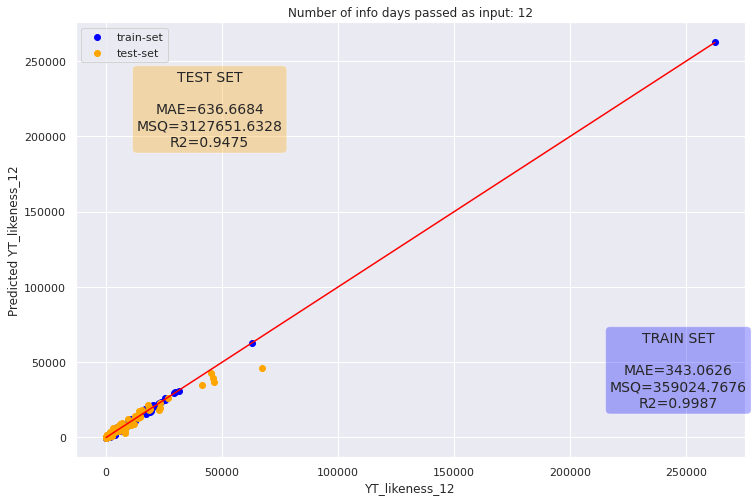

Number of input  169
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


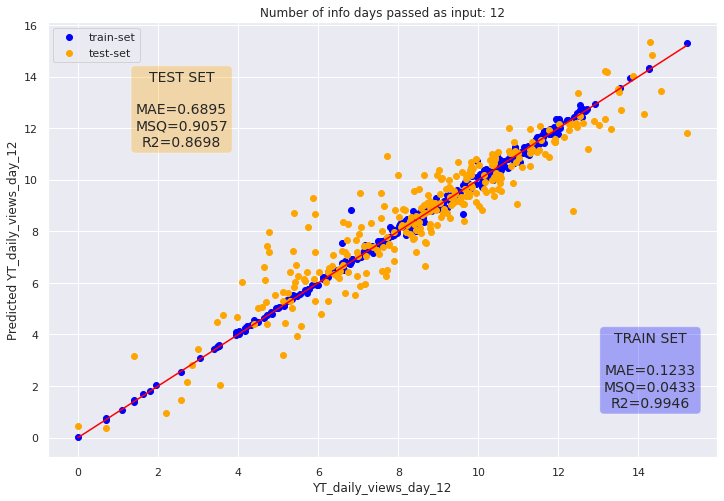

Number of input  169
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


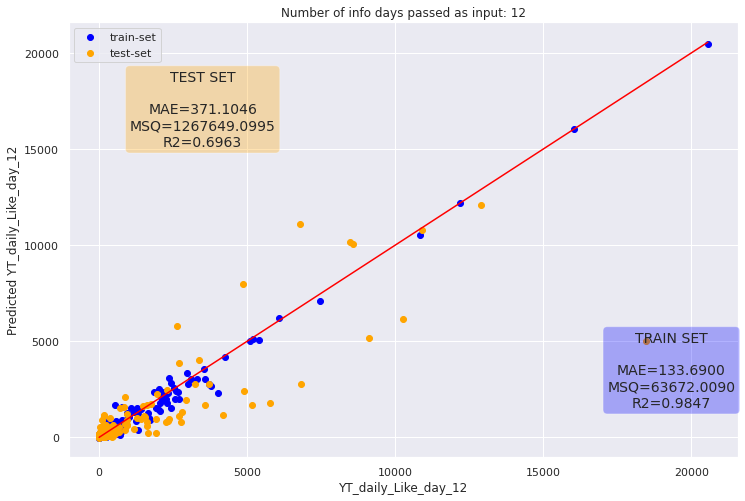

Number of input  169
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


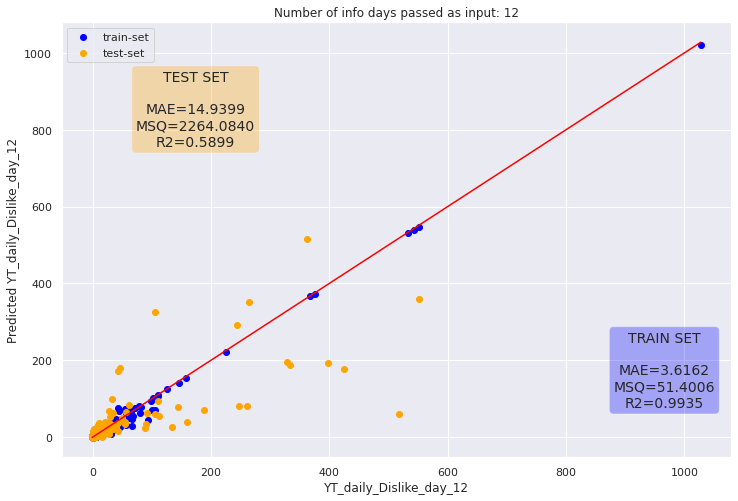

Number of input  169
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


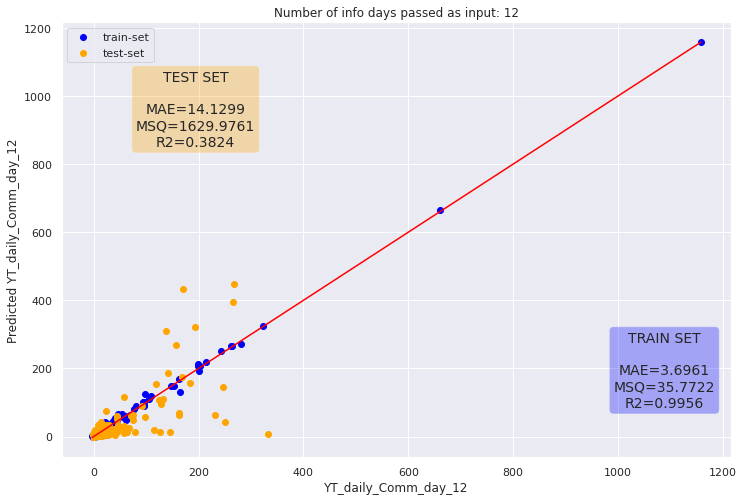

Number of input  182
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


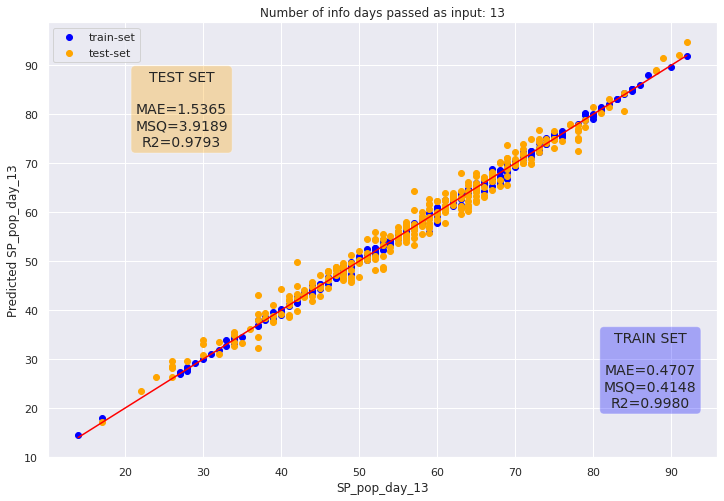

Number of input  182
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


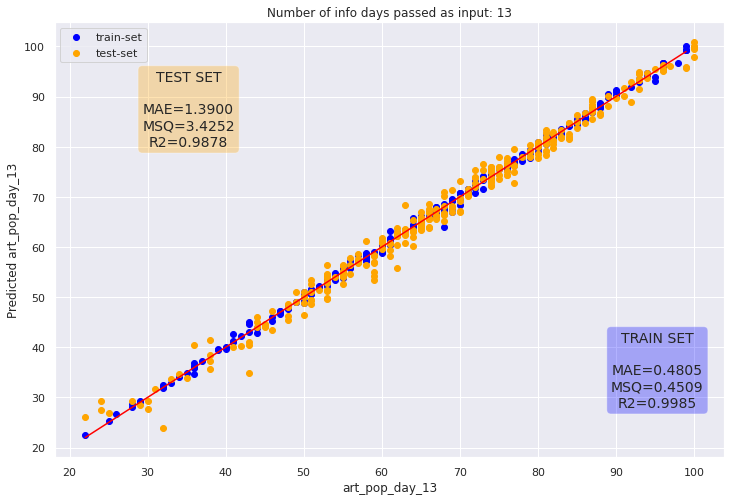

Number of input  182
Starting NN optimization!


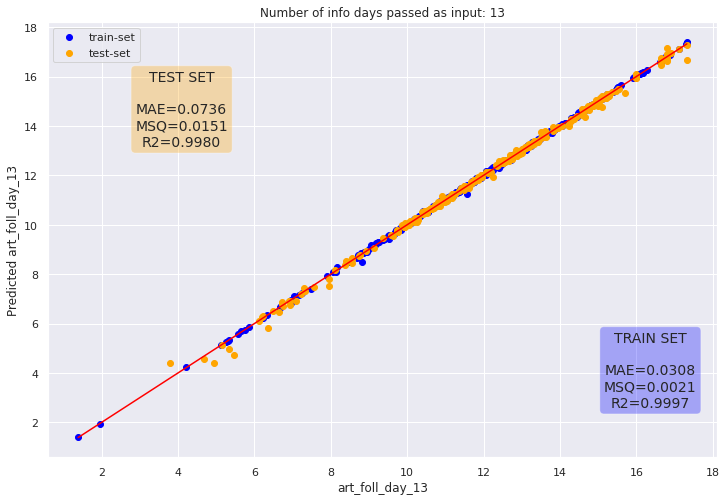

Number of input  182
Starting NN optimization!


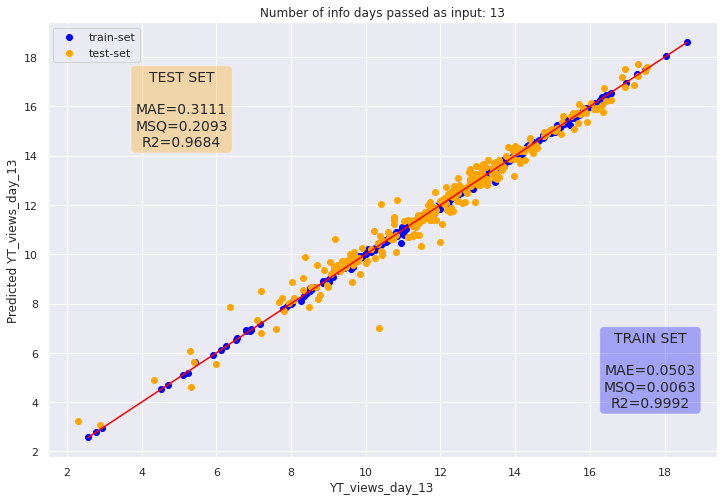

Number of input  182
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


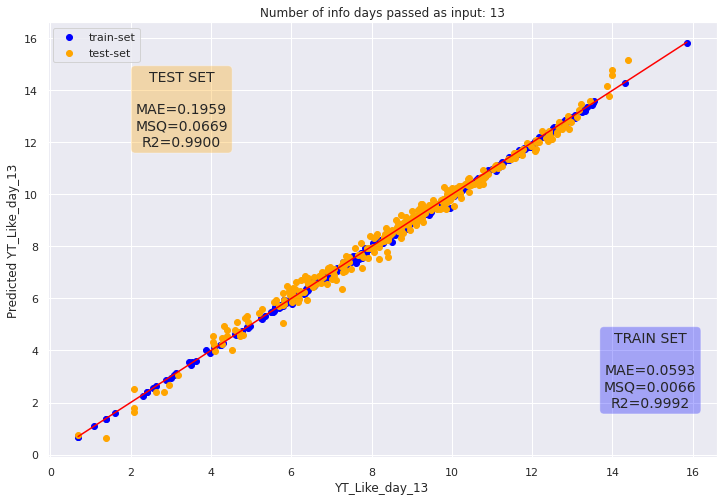

Number of input  182
Starting NN optimization!


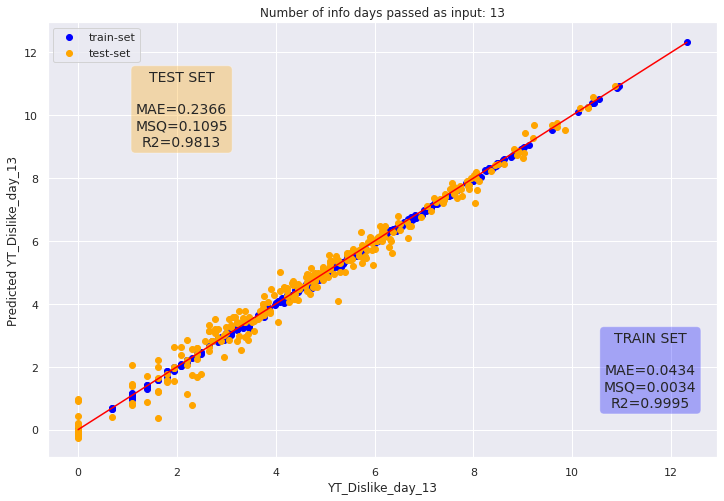

Number of input  182
Starting NN optimization!


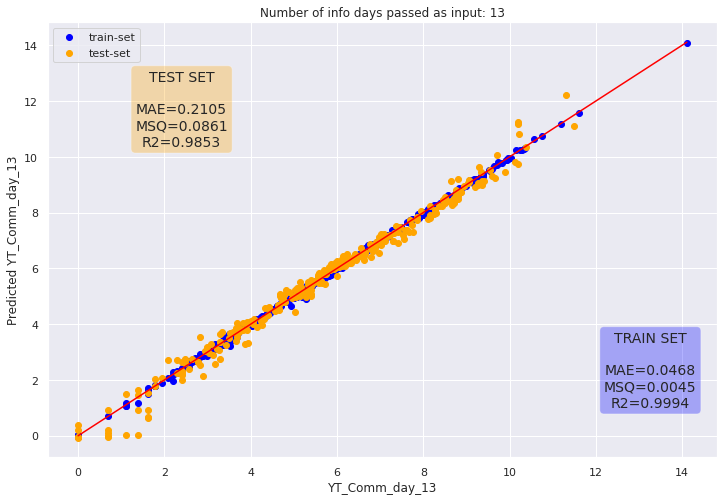

Number of input  182
Starting NN optimization!


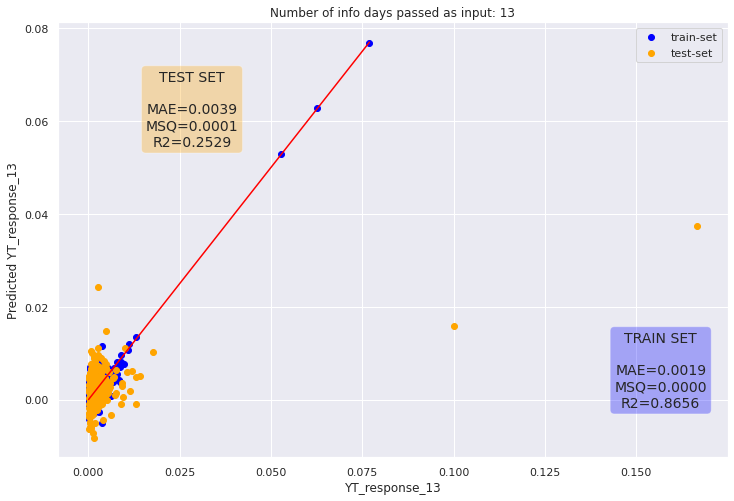

Number of input  182
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


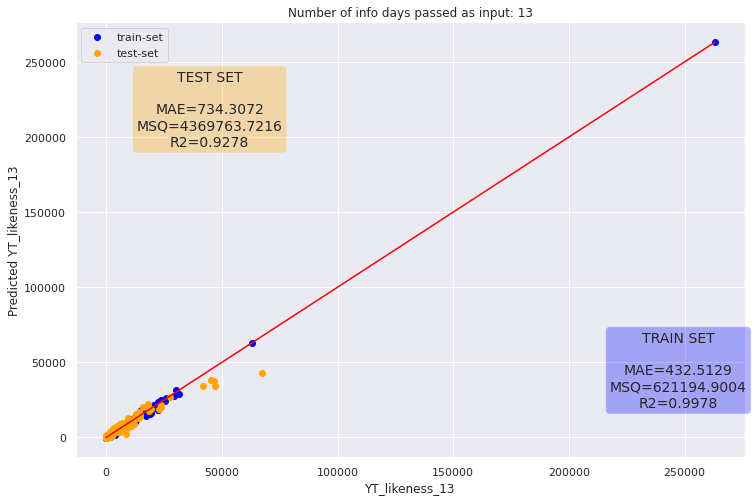

Number of input  182
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


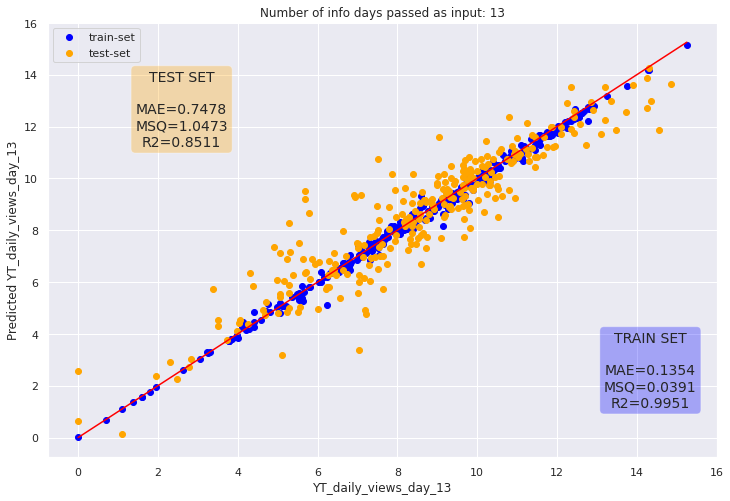

Number of input  182
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


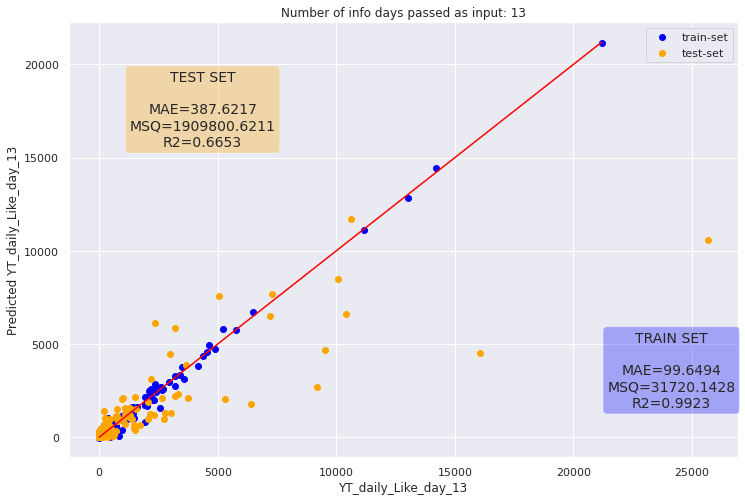

Number of input  182
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


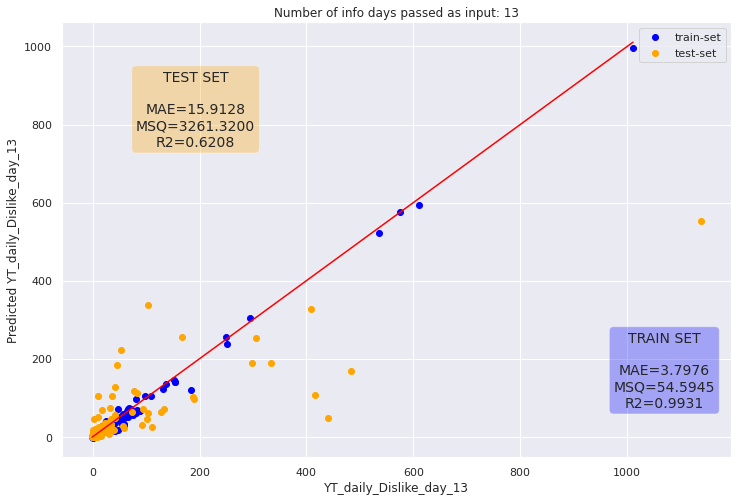

Number of input  182
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


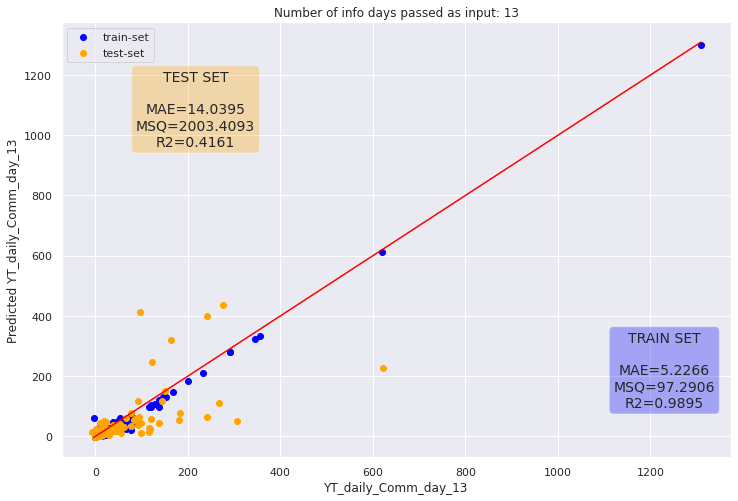

Number of input  195
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


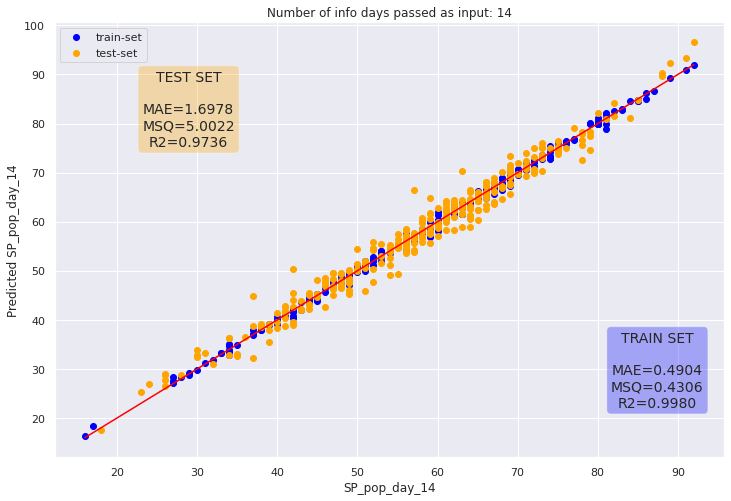

Number of input  195
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


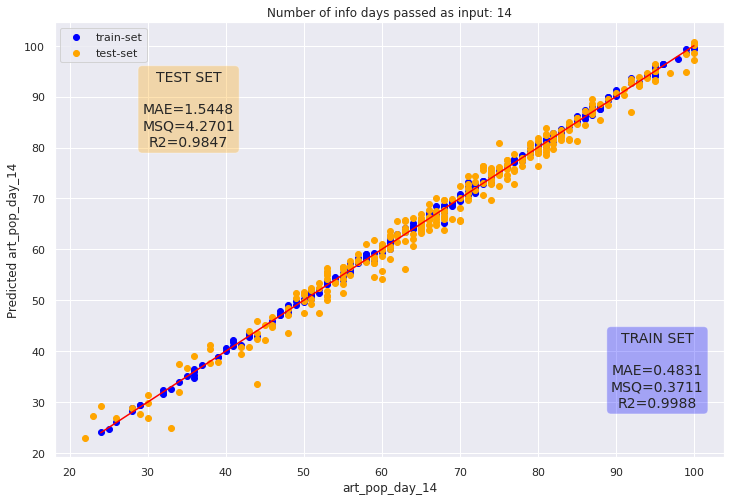

Number of input  195
Starting NN optimization!


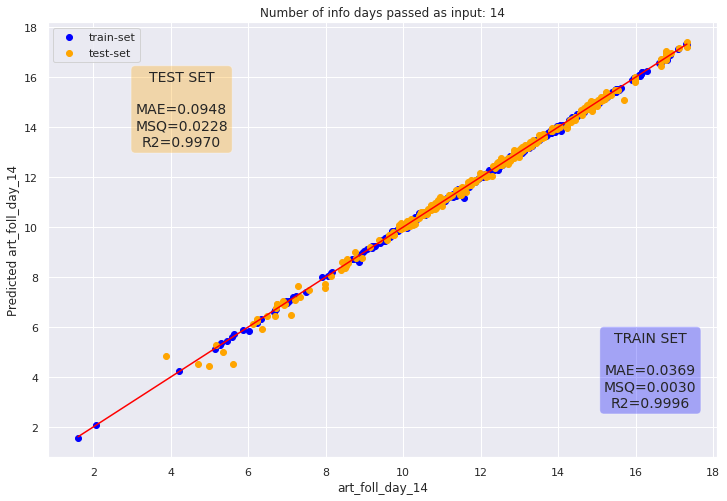

Number of input  195
Starting NN optimization!


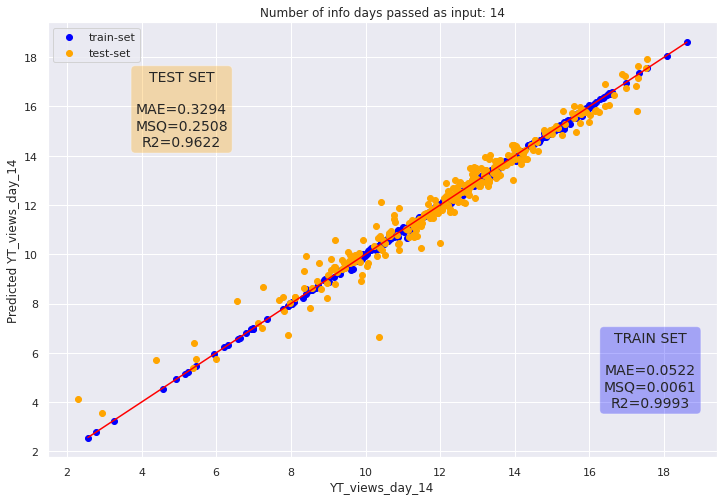

Number of input  195
Starting NN optimization!


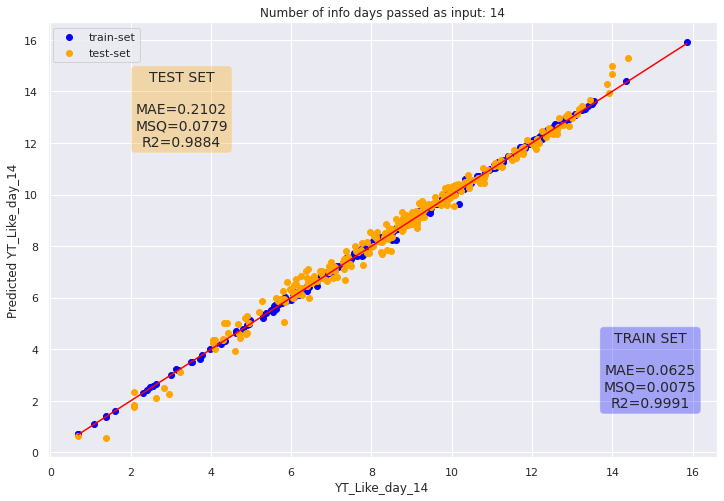

Number of input  195
Starting NN optimization!


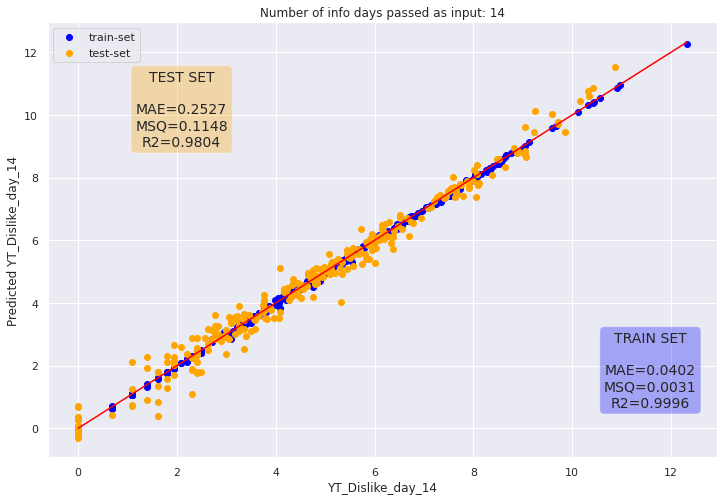

Number of input  195
Starting NN optimization!


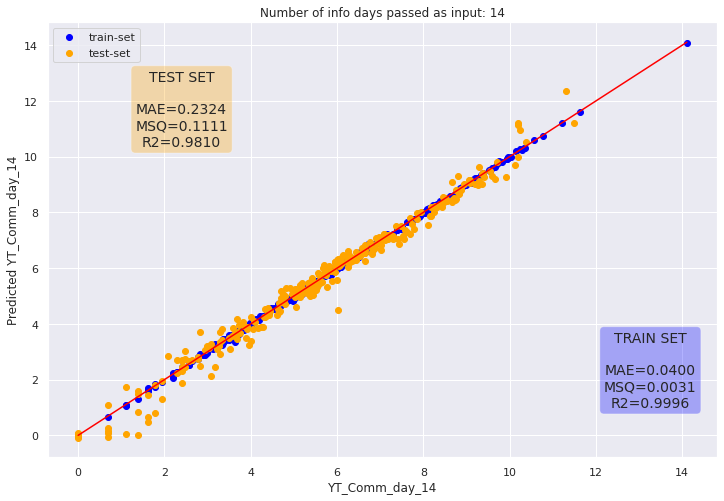

Number of input  195
Starting NN optimization!


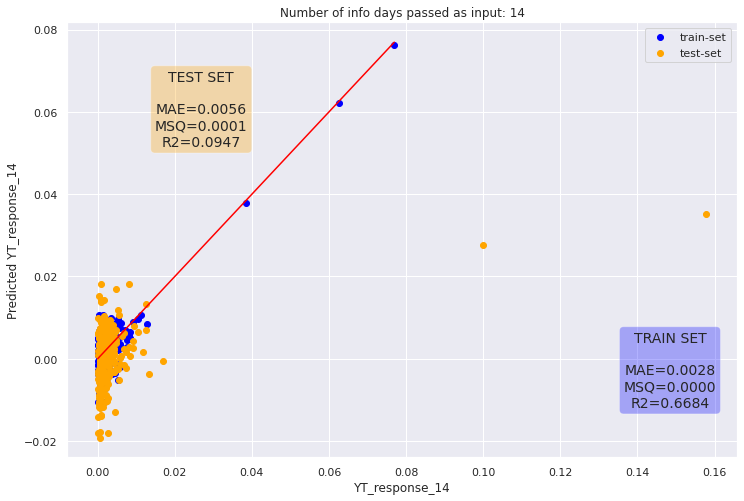

Number of input  195
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


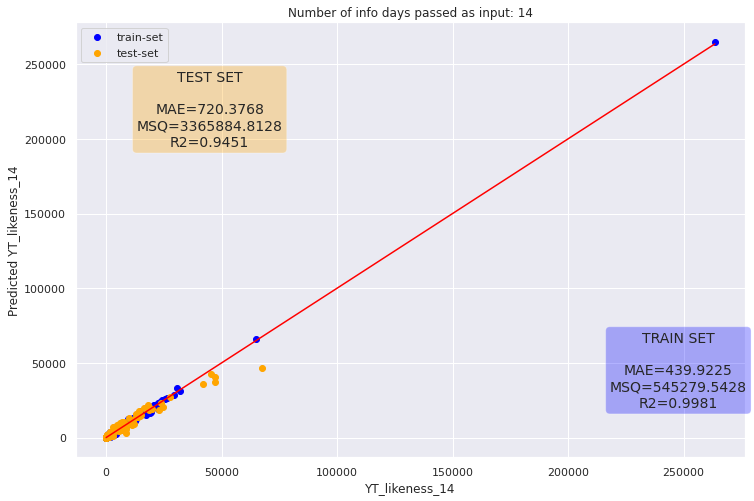

Number of input  195
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


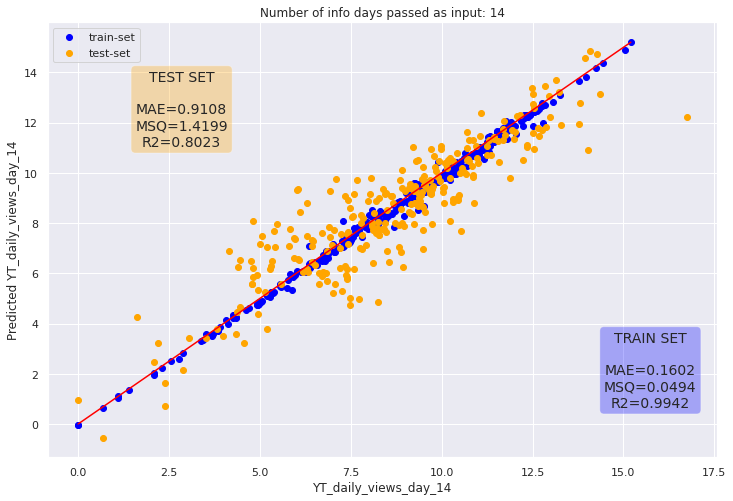

Number of input  195
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


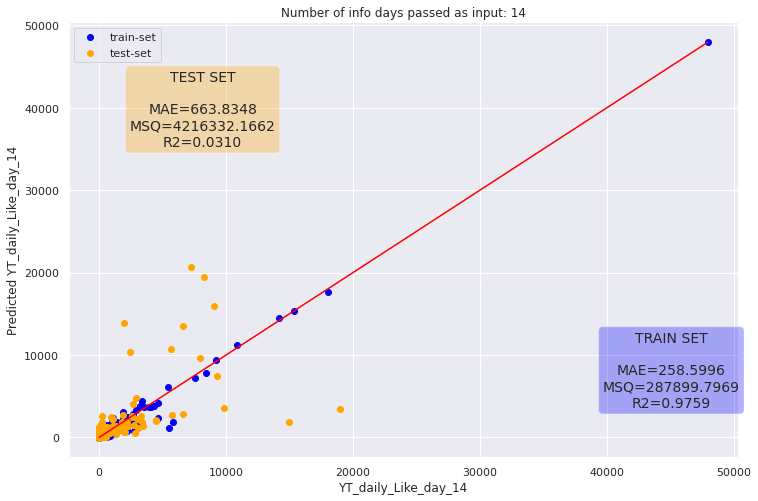

Number of input  195
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


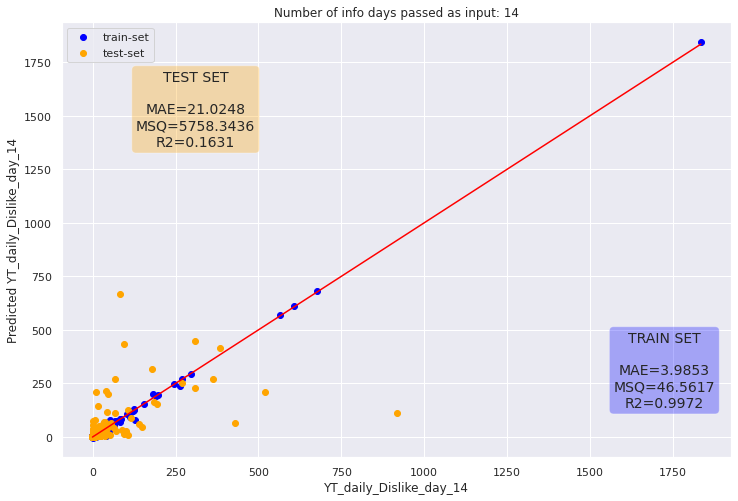

Number of input  195
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


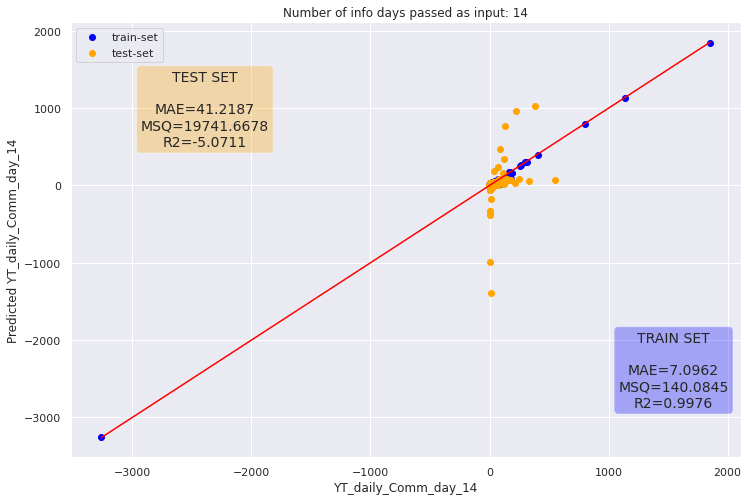

Number of input  208
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


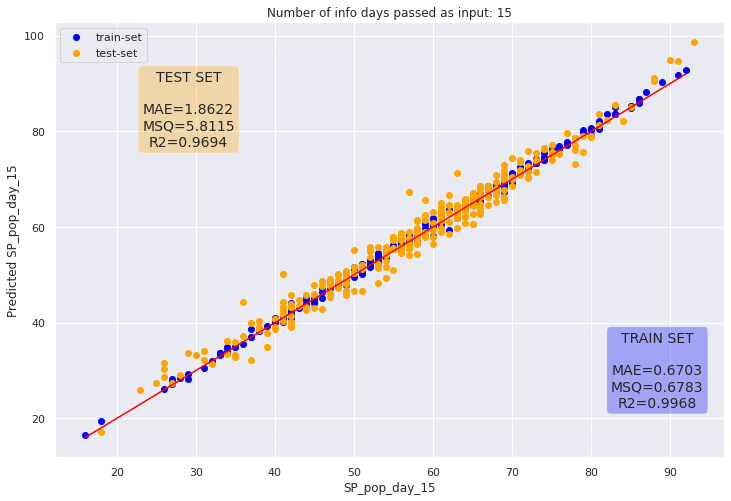

Number of input  208
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


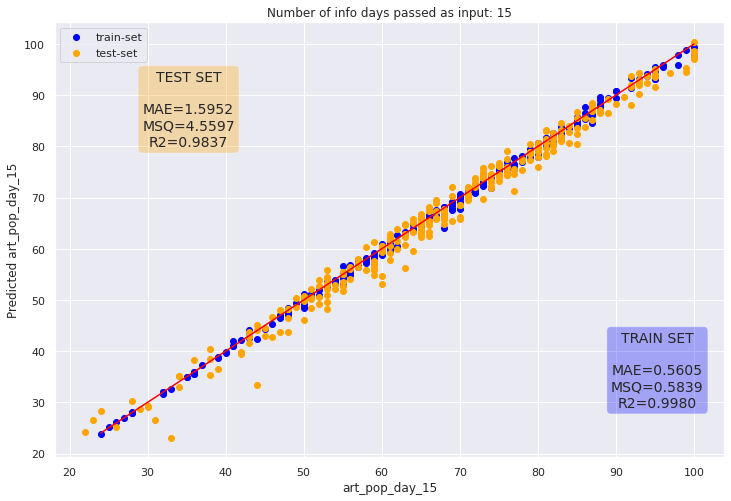

Number of input  208
Starting NN optimization!


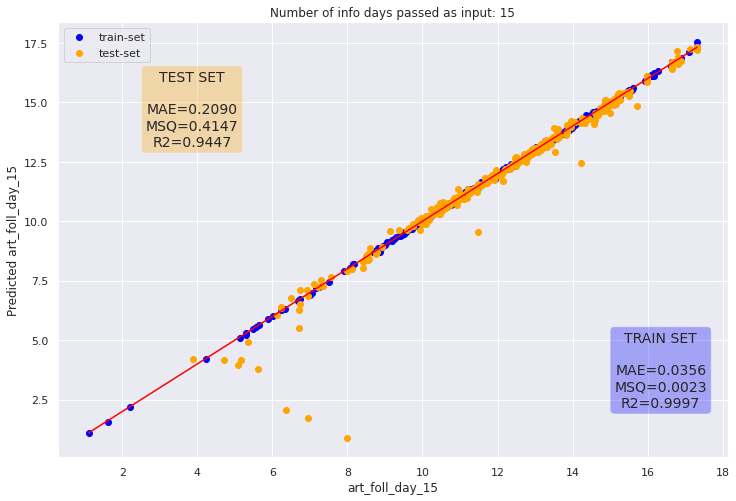

Number of input  208
Starting NN optimization!


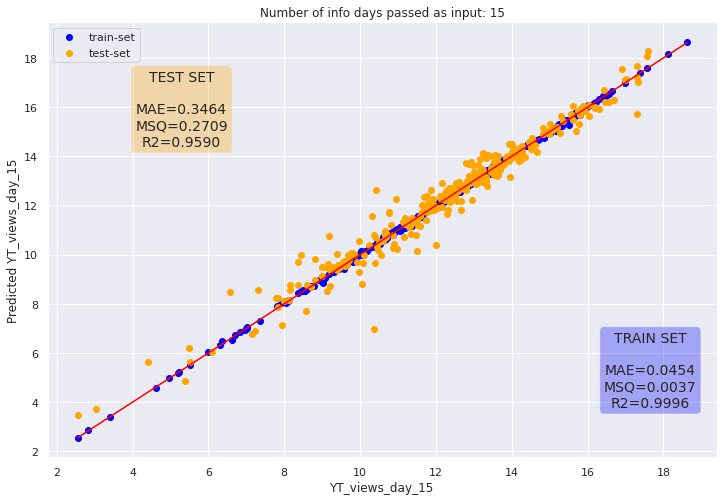

Number of input  208
Starting NN optimization!


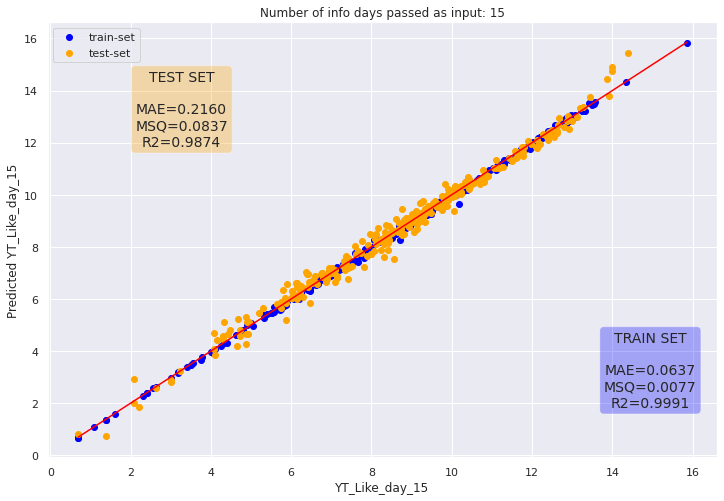

Number of input  208
Starting NN optimization!


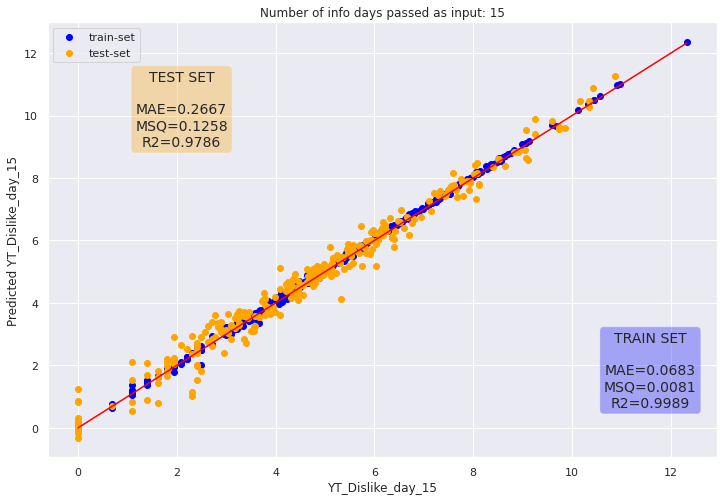

Number of input  208
Starting NN optimization!


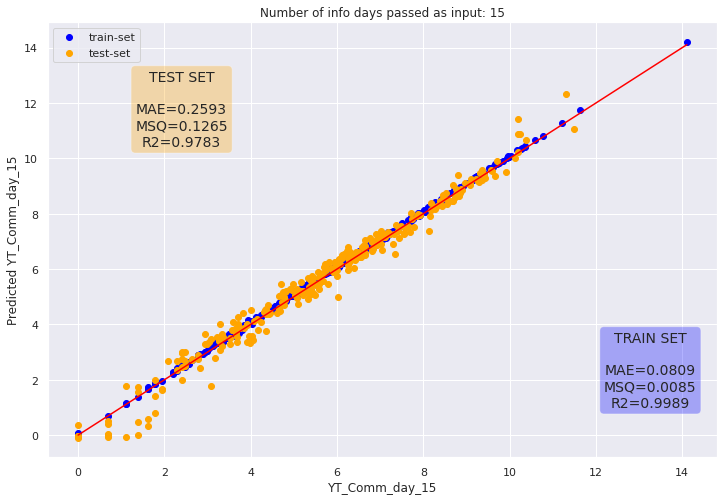

Number of input  208
Starting NN optimization!


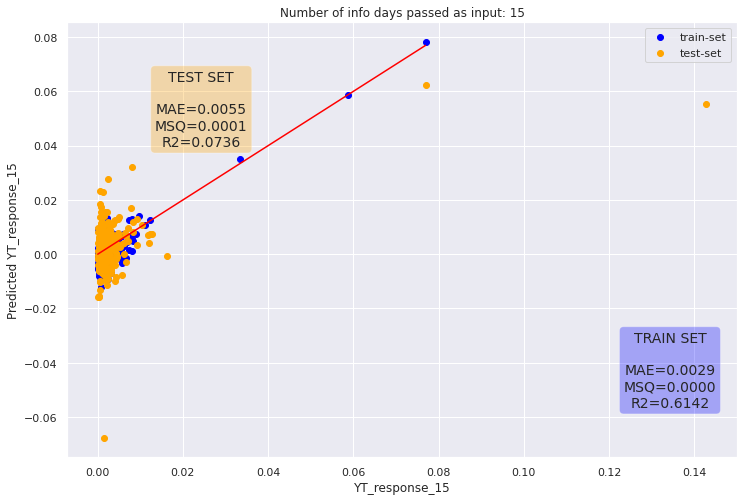

Number of input  208
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


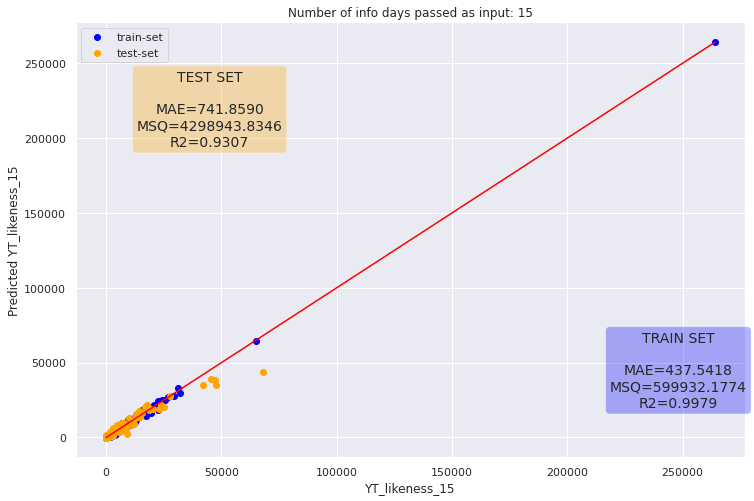

Number of input  208
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


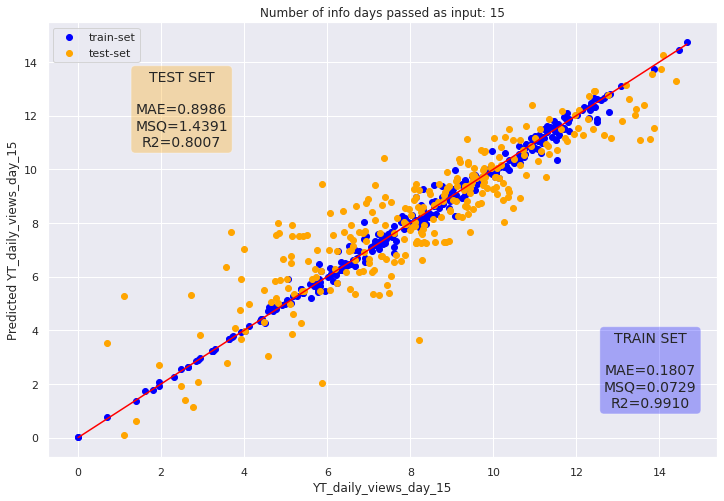

Number of input  208
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


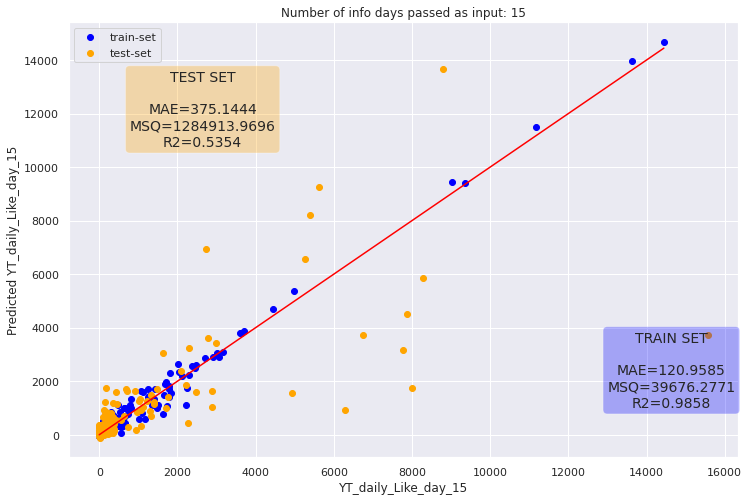

Number of input  208
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


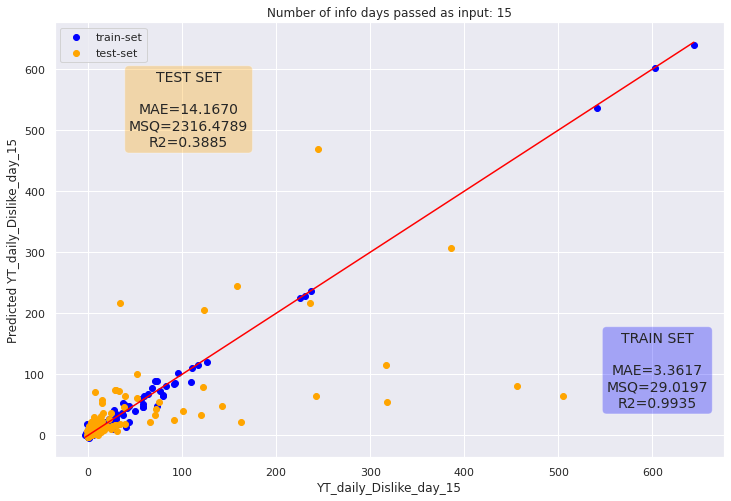

Number of input  208
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


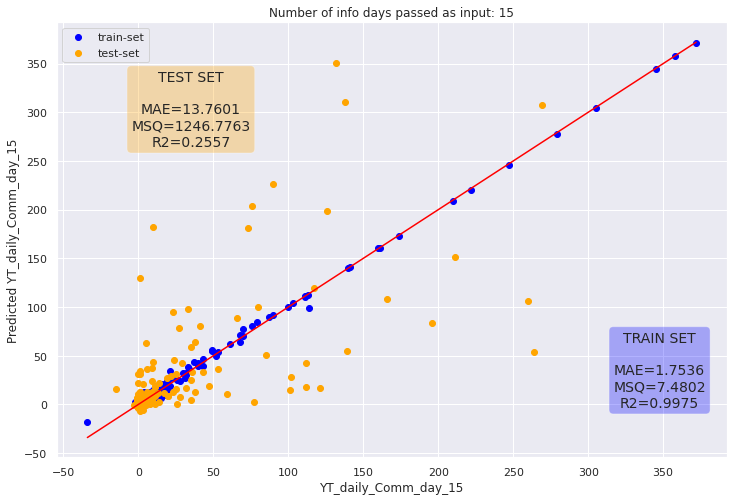

Number of input  221
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


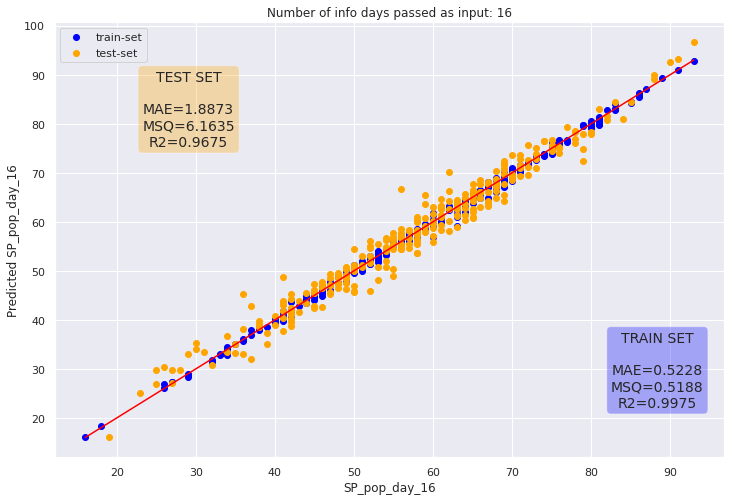

Number of input  221
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


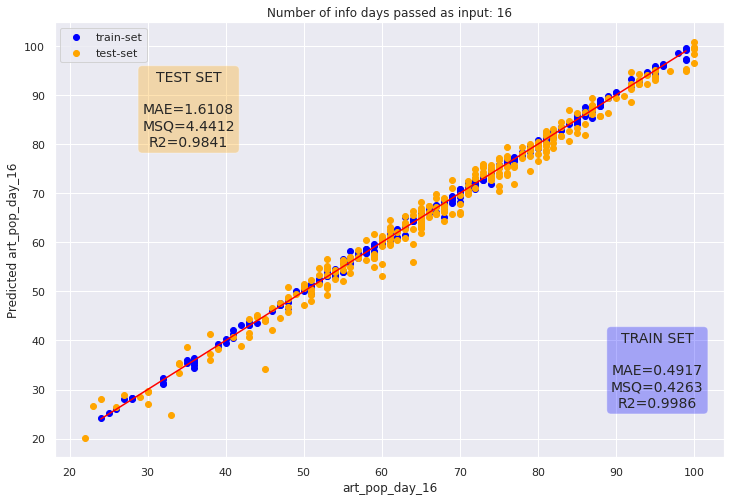

Number of input  221
Starting NN optimization!


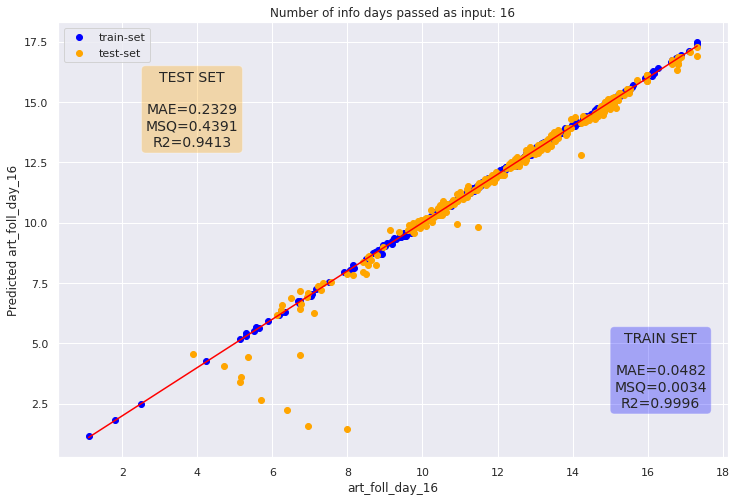

Number of input  221
Starting NN optimization!


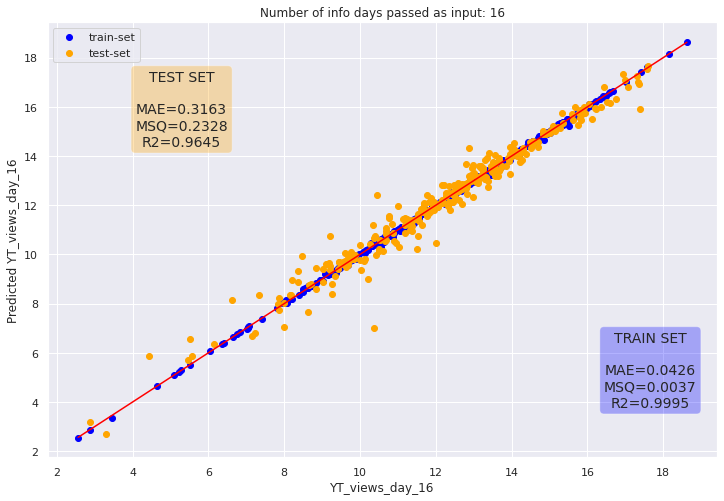

Number of input  221
Starting NN optimization!


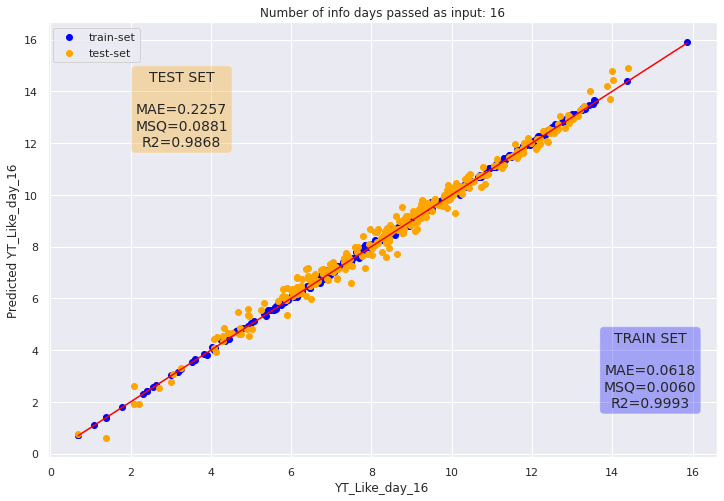

Number of input  221
Starting NN optimization!


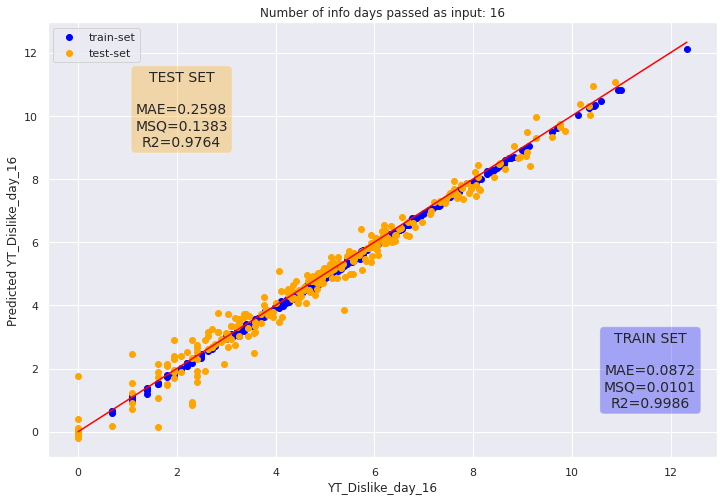

Number of input  221
Starting NN optimization!


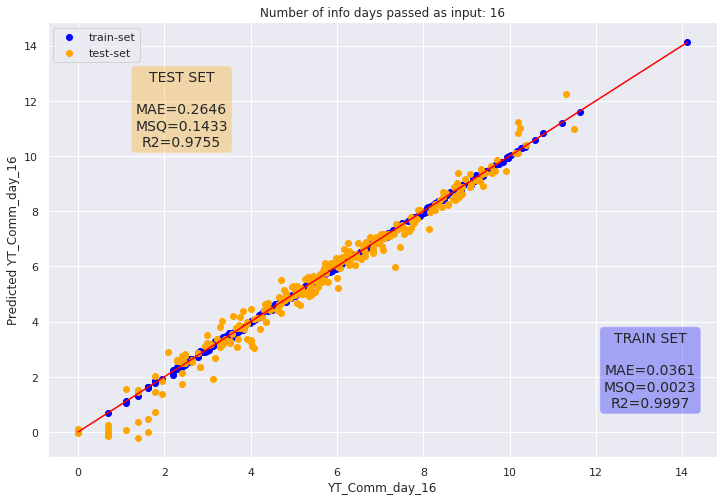

Number of input  221
Starting NN optimization!


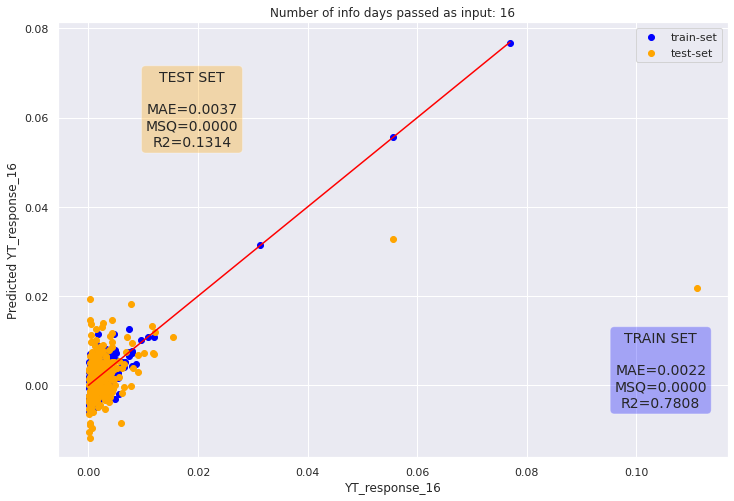

Number of input  221
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


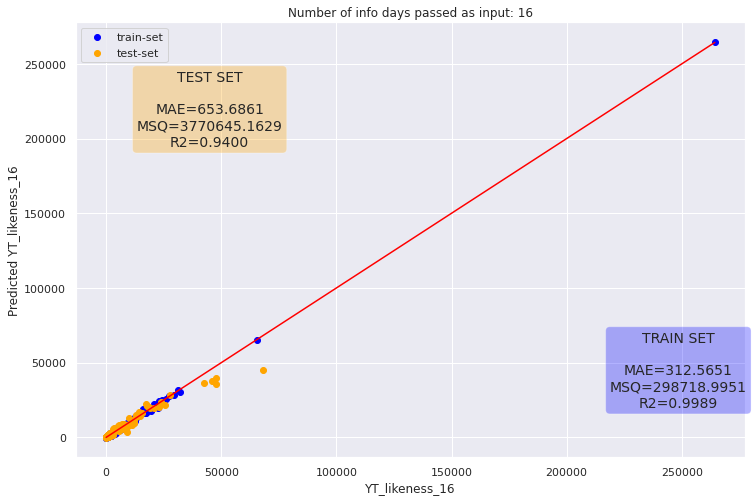

Number of input  221
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


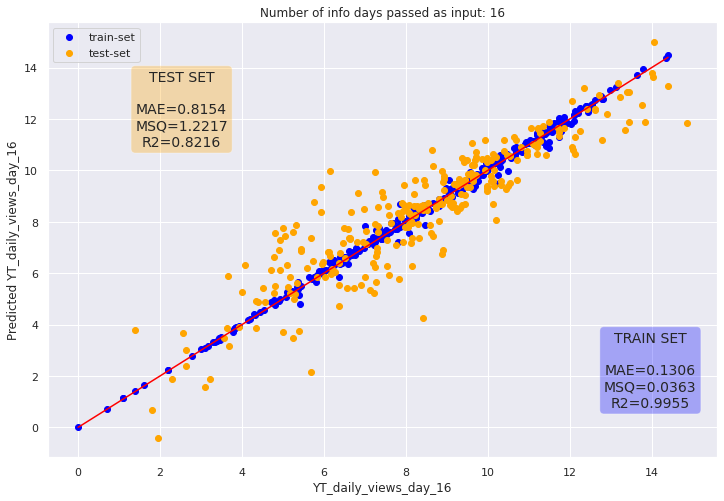

Number of input  221
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


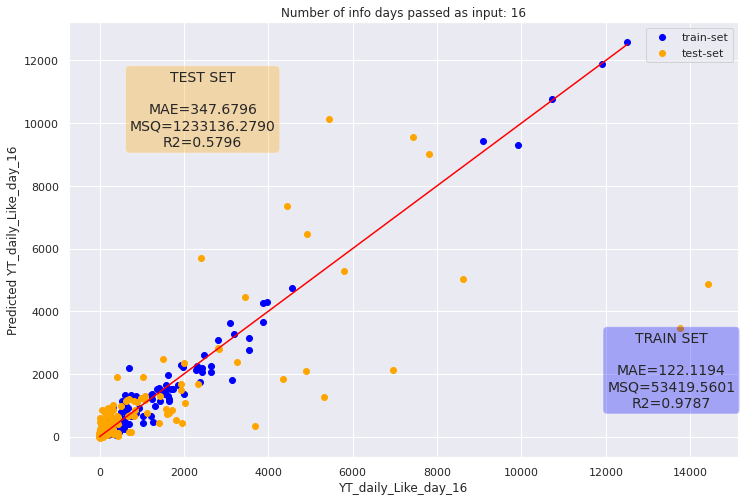

Number of input  221
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


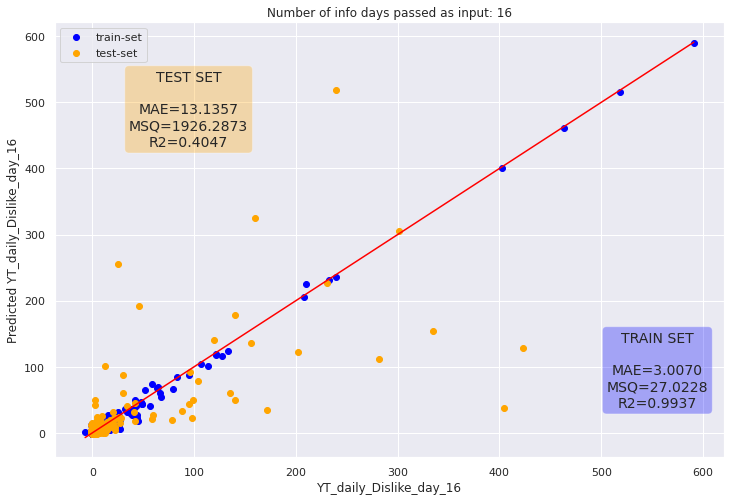

Number of input  221
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


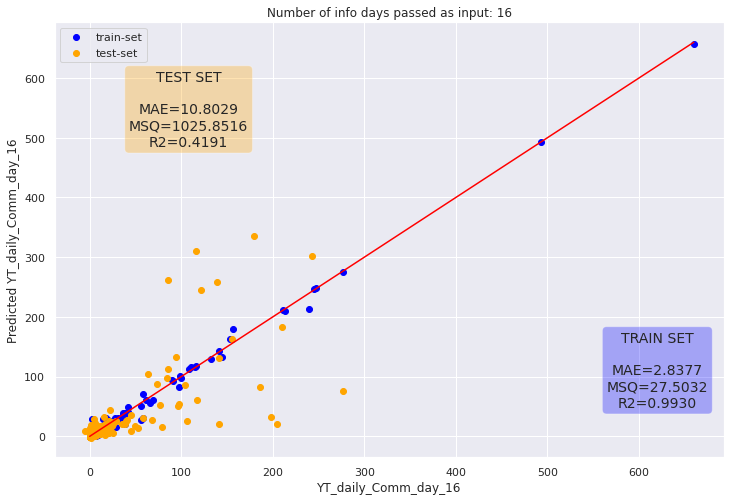

Number of input  234
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


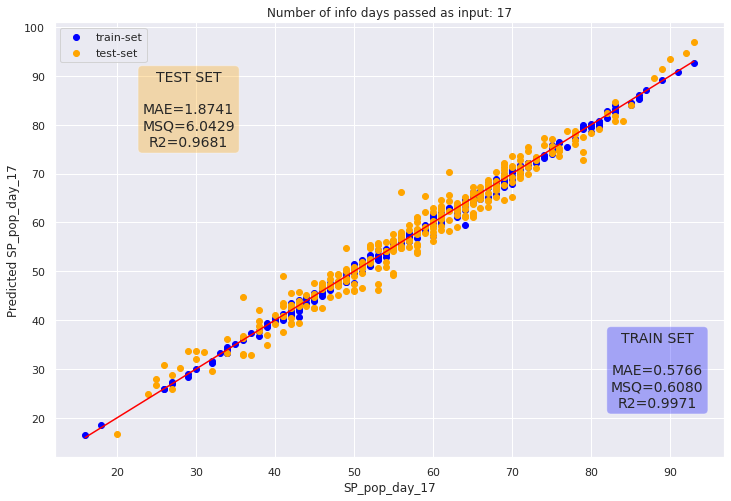

Number of input  234
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


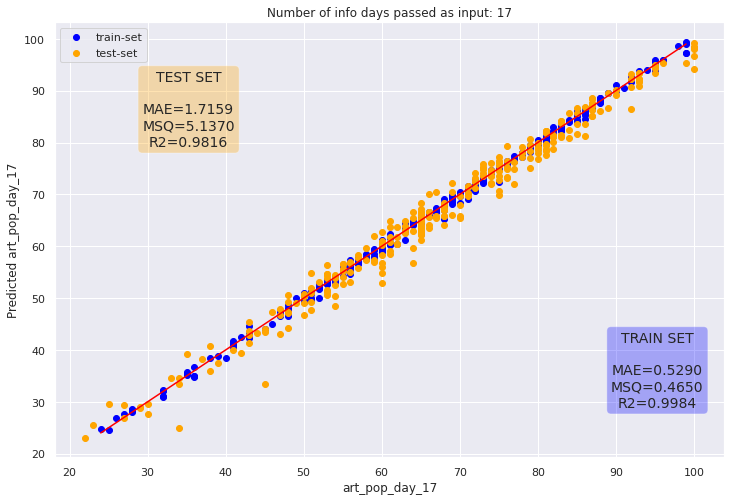

Number of input  234
Starting NN optimization!


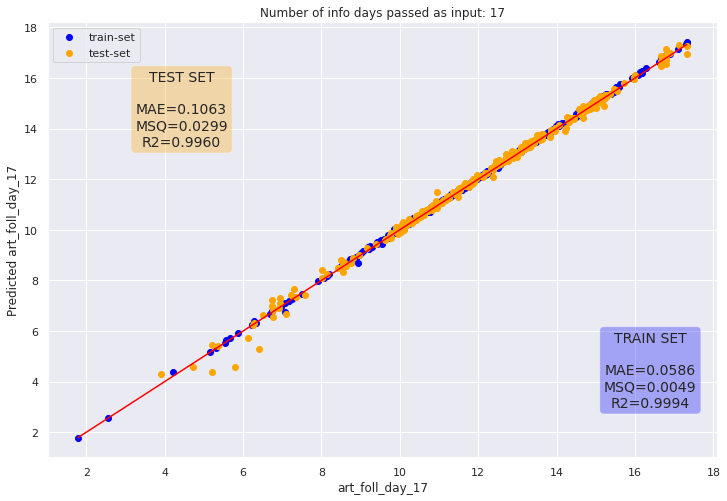

Number of input  234
Starting NN optimization!


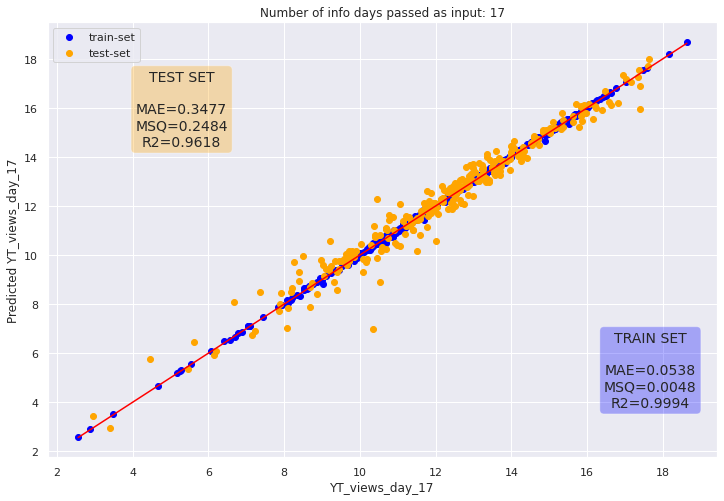

Number of input  234
Starting NN optimization!


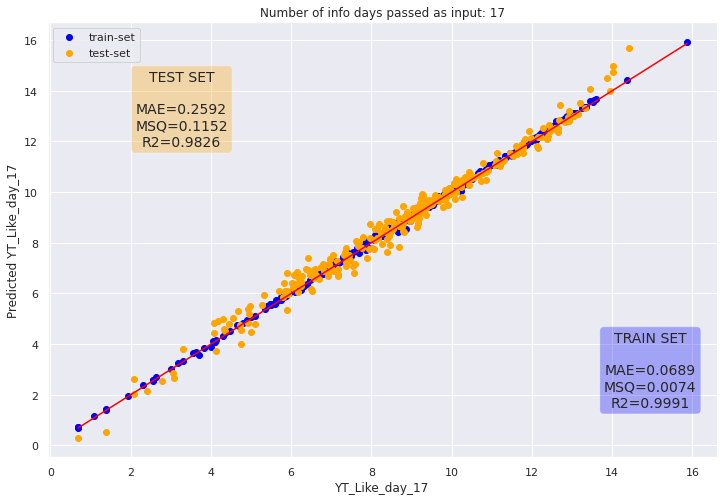

Number of input  234
Starting NN optimization!


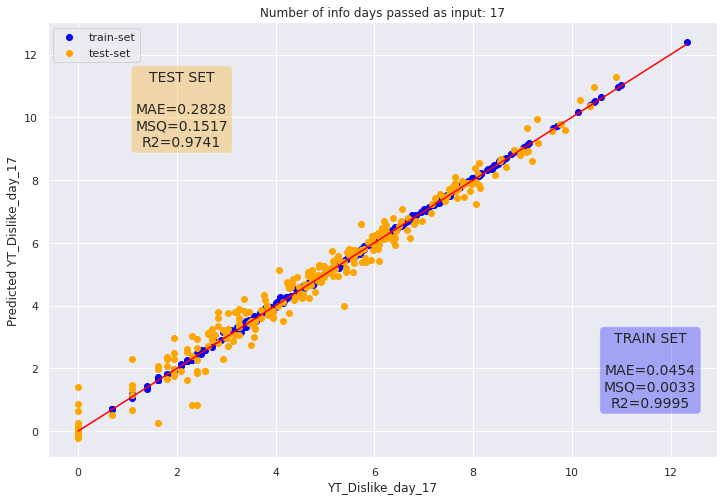

Number of input  234
Starting NN optimization!


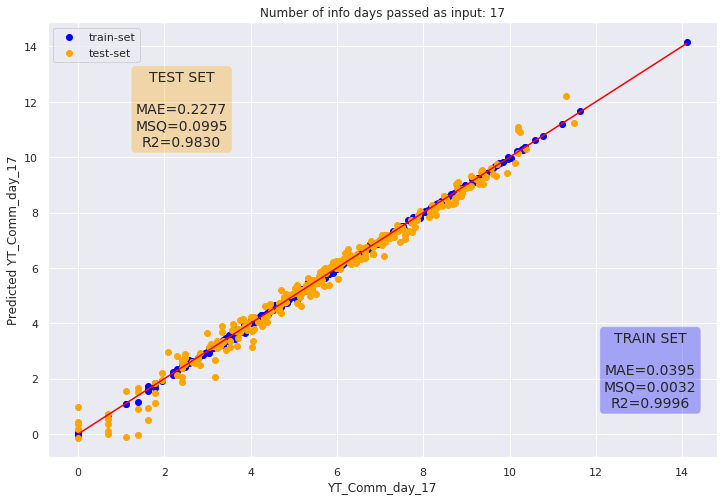

Number of input  234
Starting NN optimization!


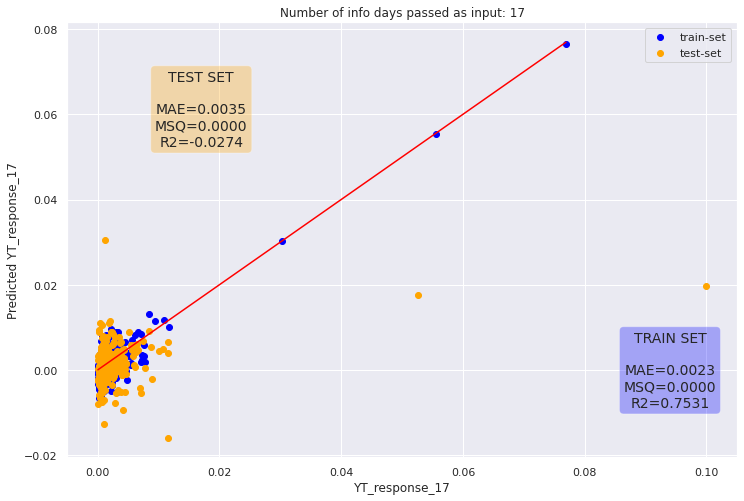

Number of input  234
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


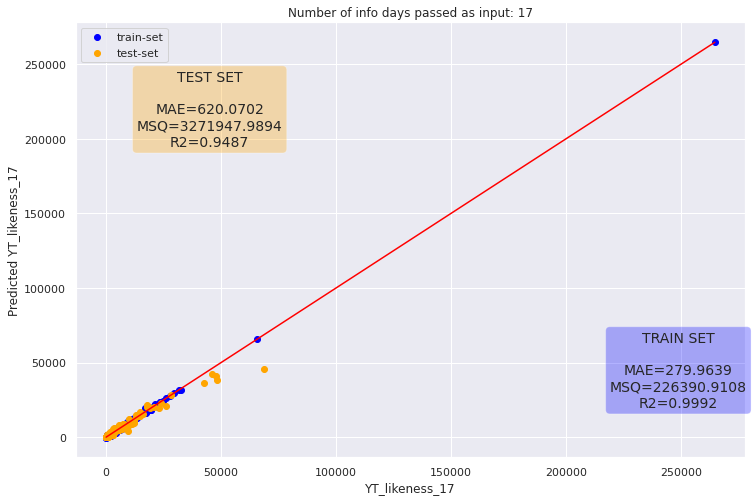

Number of input  234
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


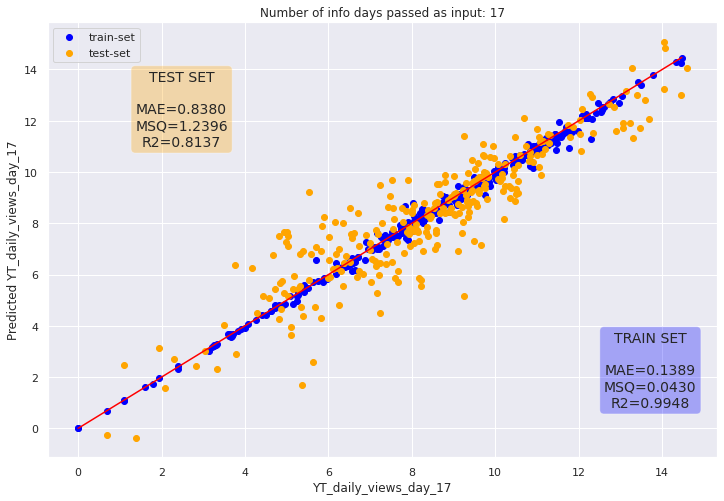

Number of input  234
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


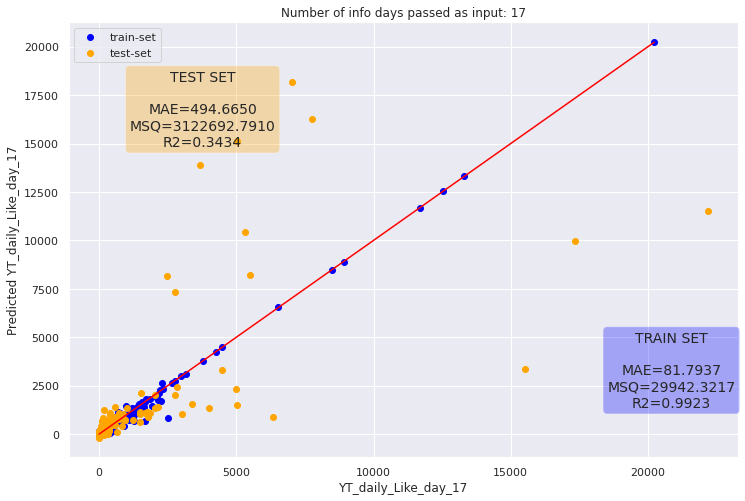

Number of input  234
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


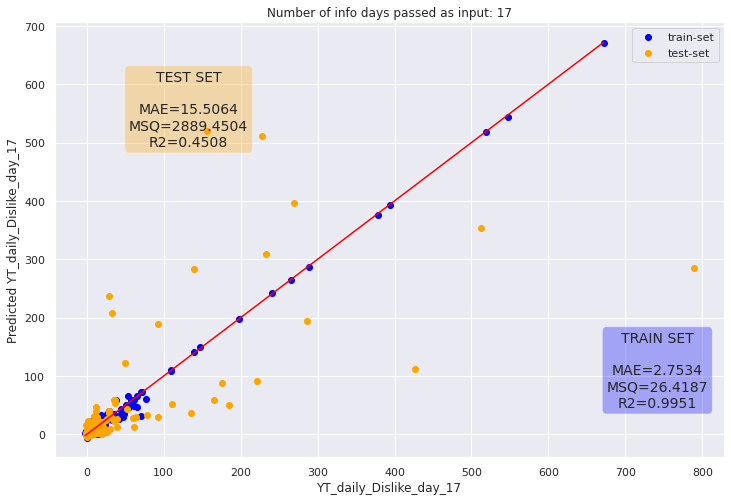

Number of input  234
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


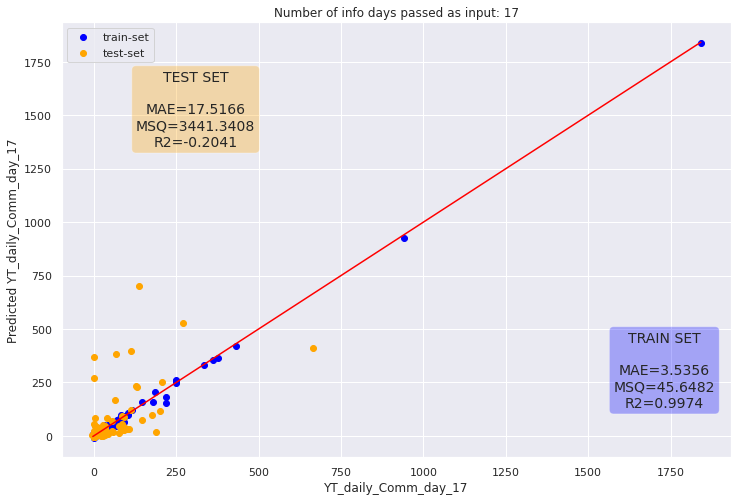

Number of input  247
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


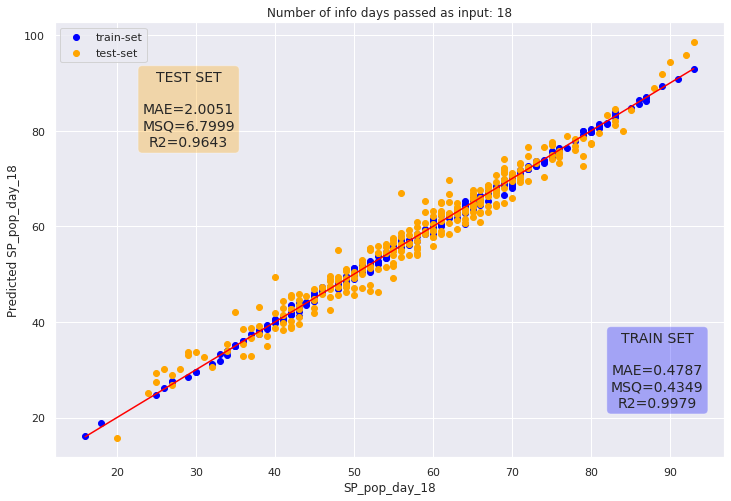

Number of input  247
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


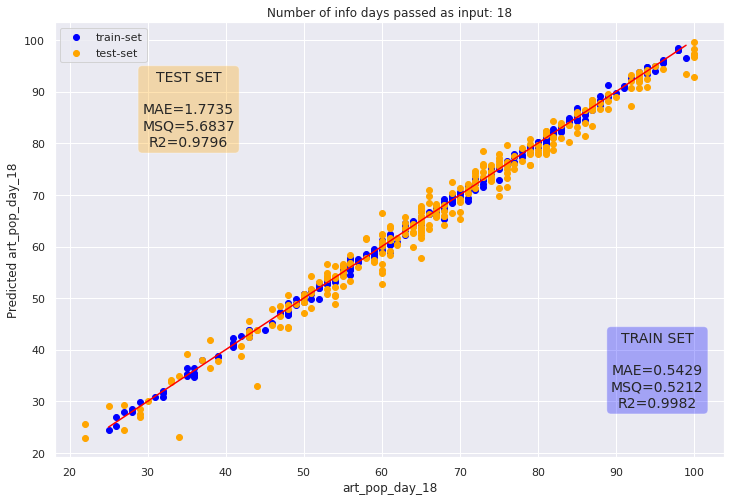

Number of input  247
Starting NN optimization!


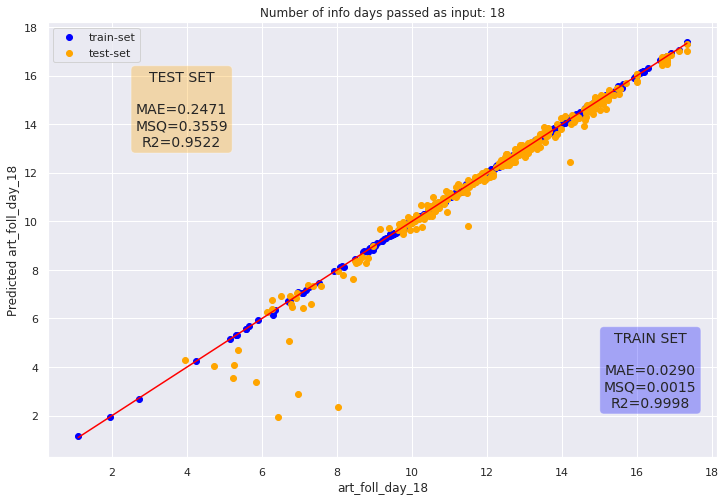

Number of input  247
Starting NN optimization!


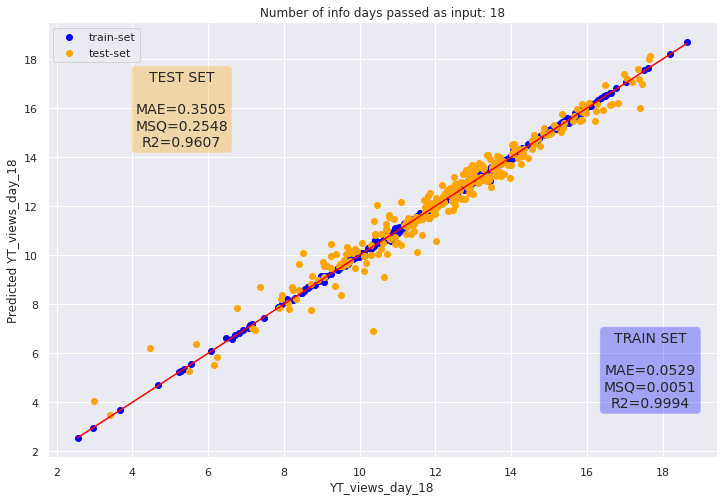

Number of input  247
Starting NN optimization!


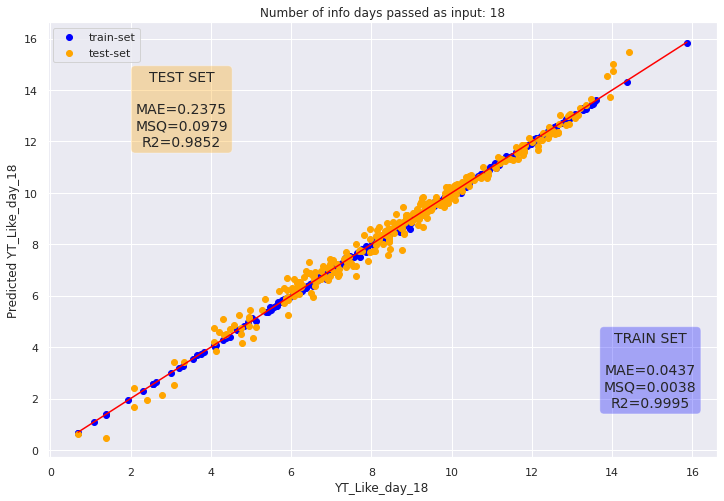

Number of input  247
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


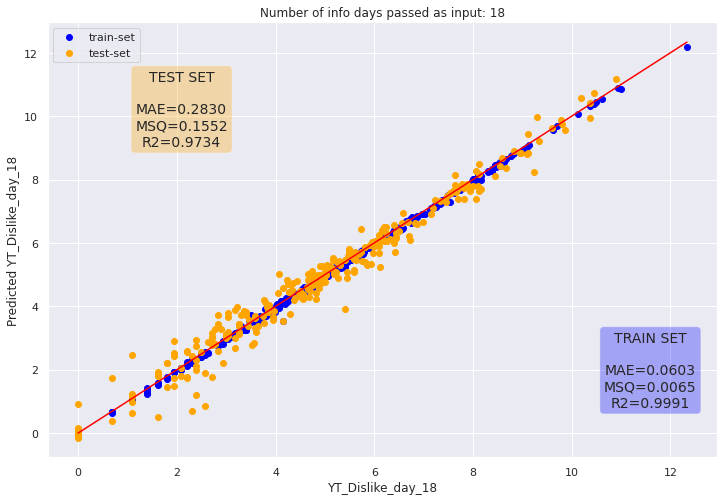

Number of input  247
Starting NN optimization!


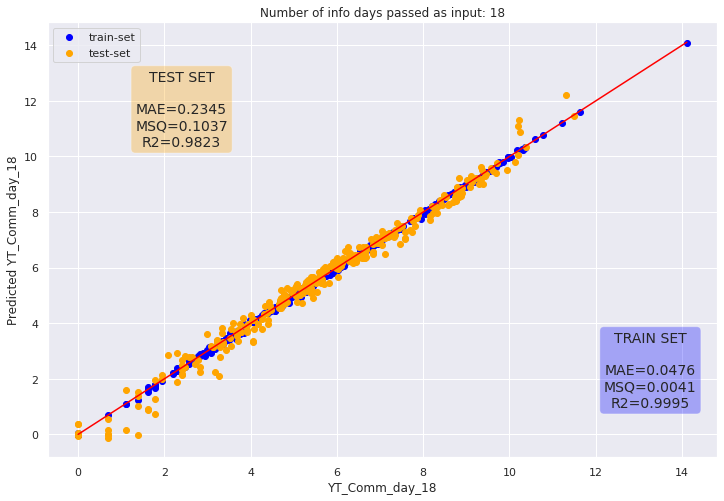

Number of input  247
Starting NN optimization!


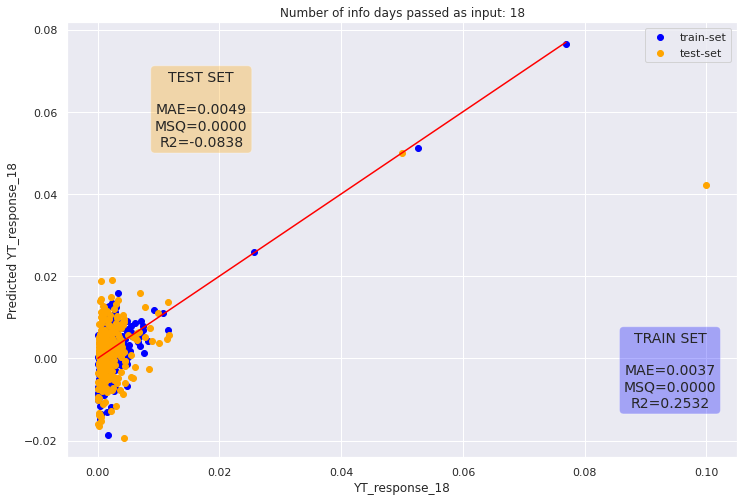

Number of input  247
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


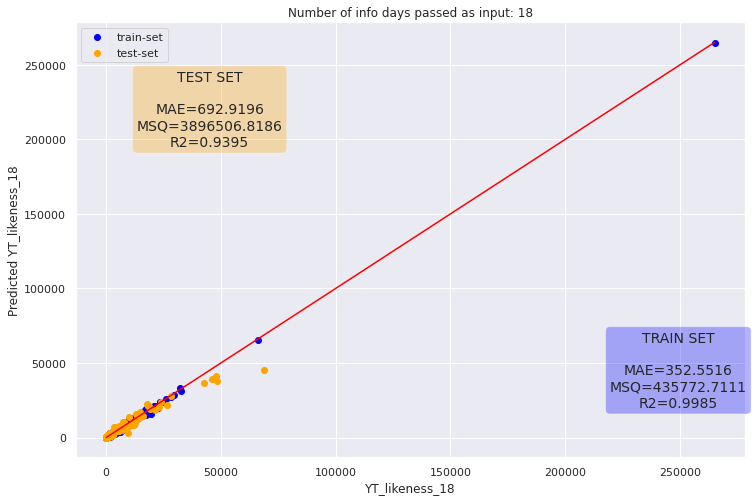

Number of input  247
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


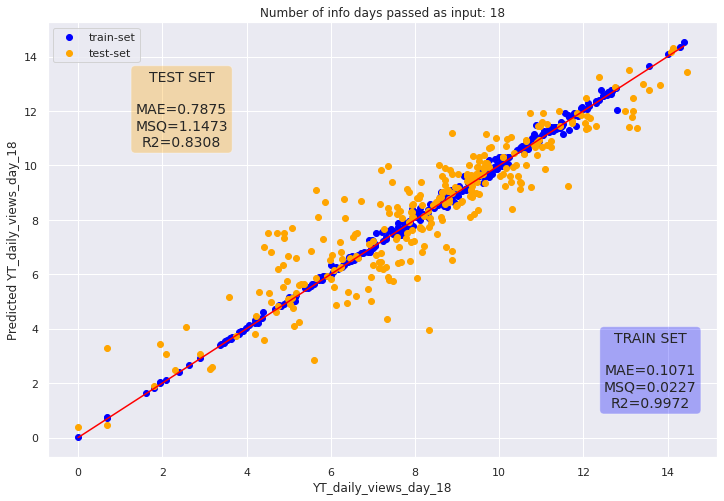

Number of input  247
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


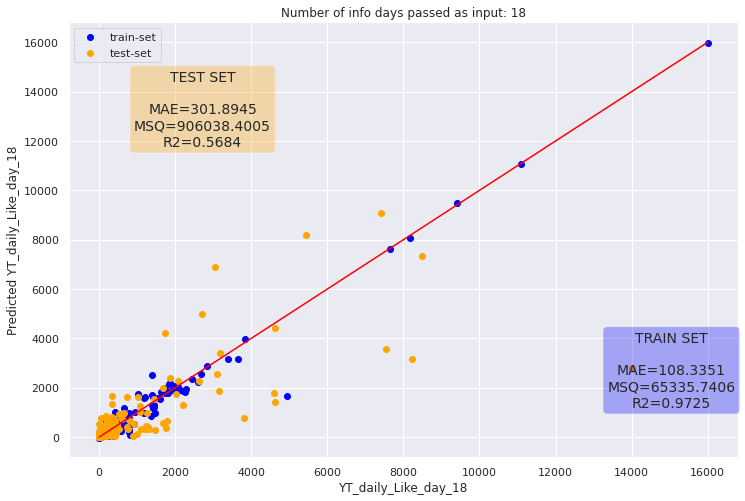

Number of input  247
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


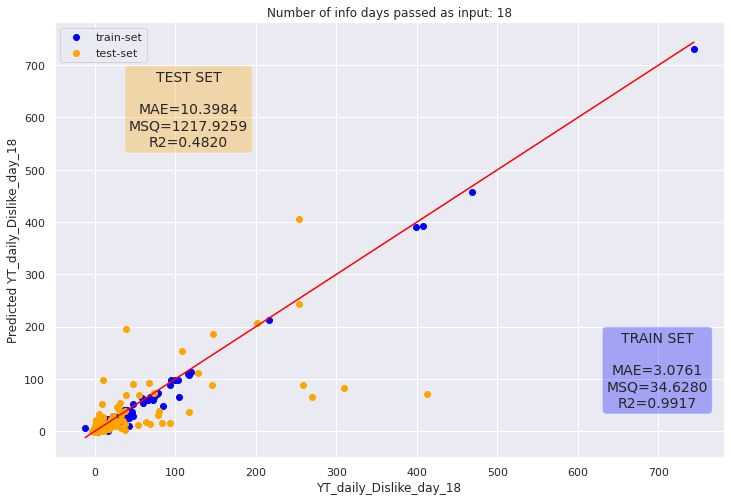

Number of input  247
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


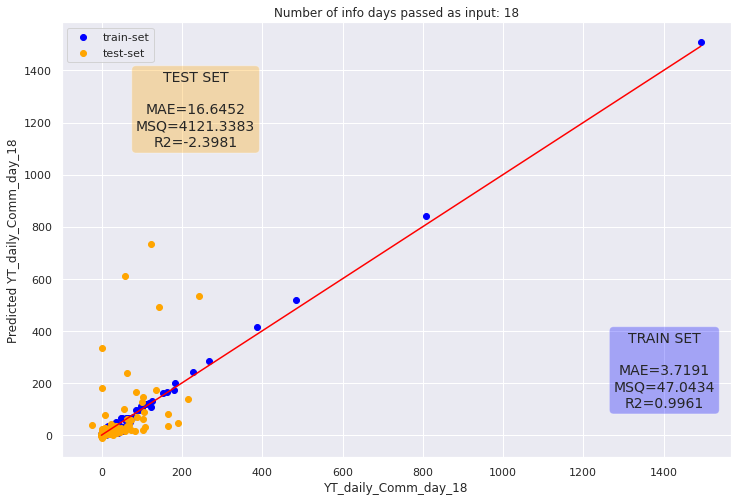

Number of input  260
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


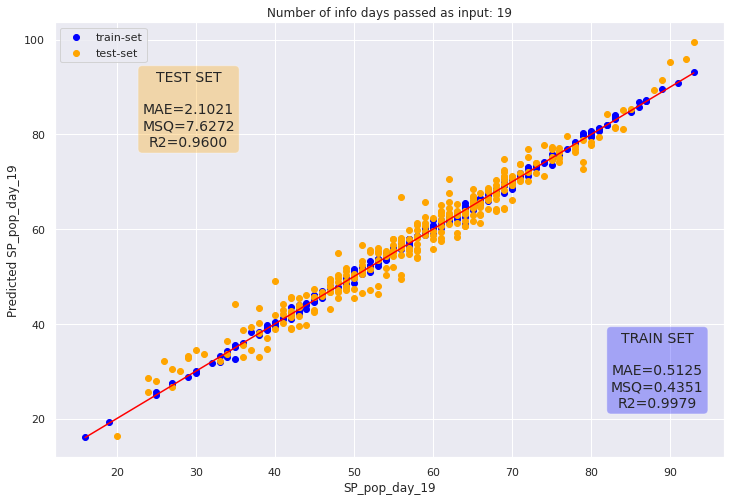

Number of input  260
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


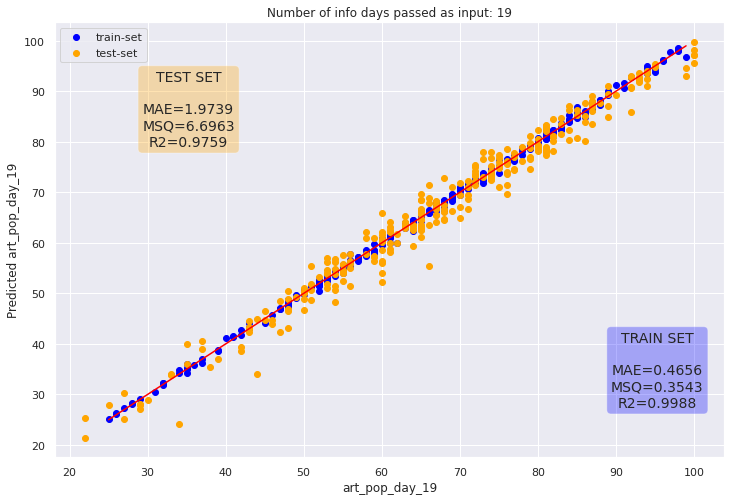

Number of input  260
Starting NN optimization!


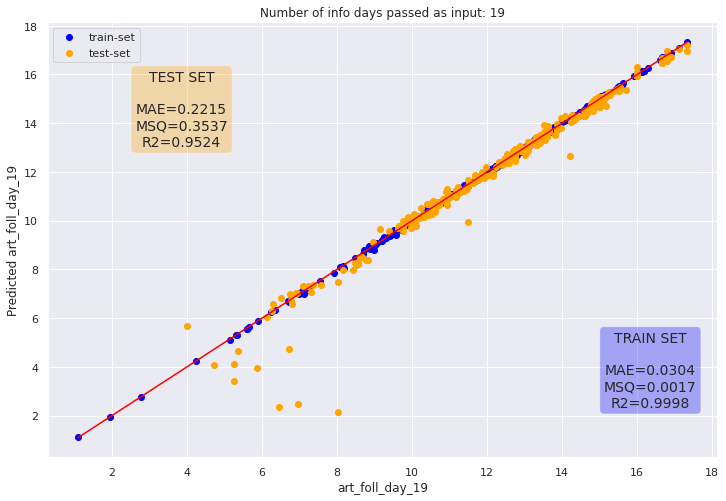

Number of input  260
Starting NN optimization!


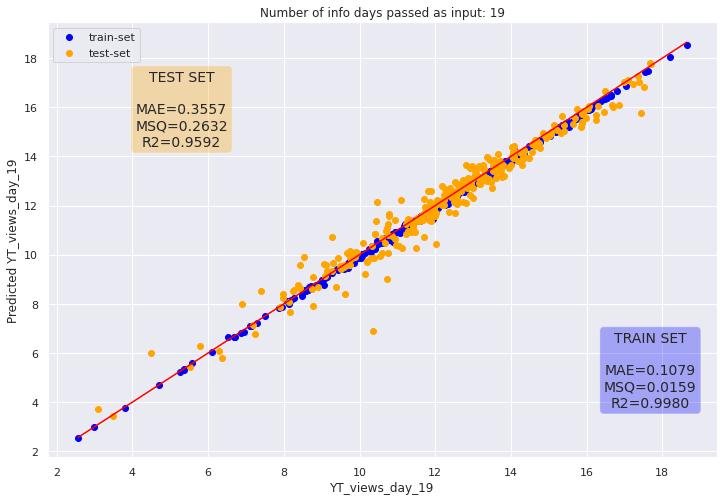

Number of input  260
Starting NN optimization!


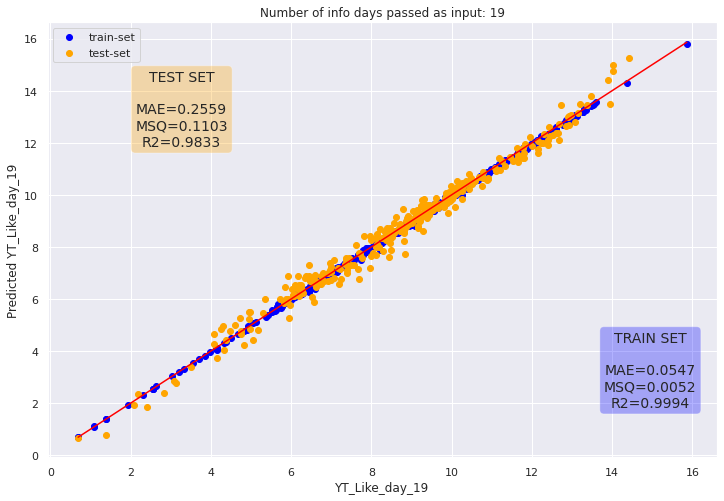

Number of input  260
Starting NN optimization!


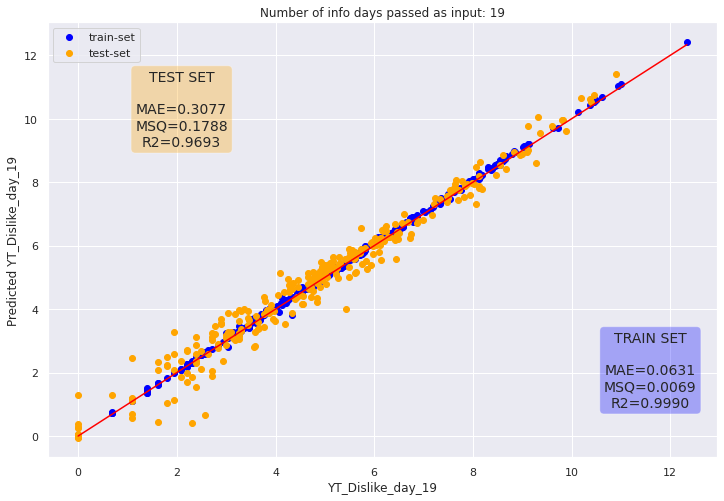

Number of input  260
Starting NN optimization!


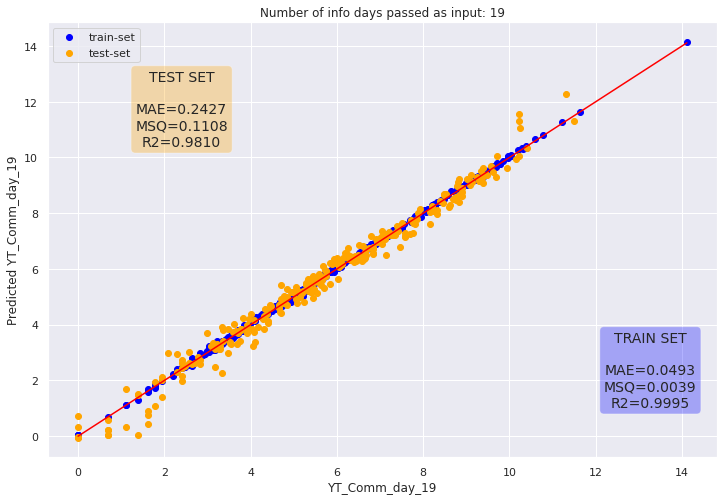

Number of input  260
Starting NN optimization!


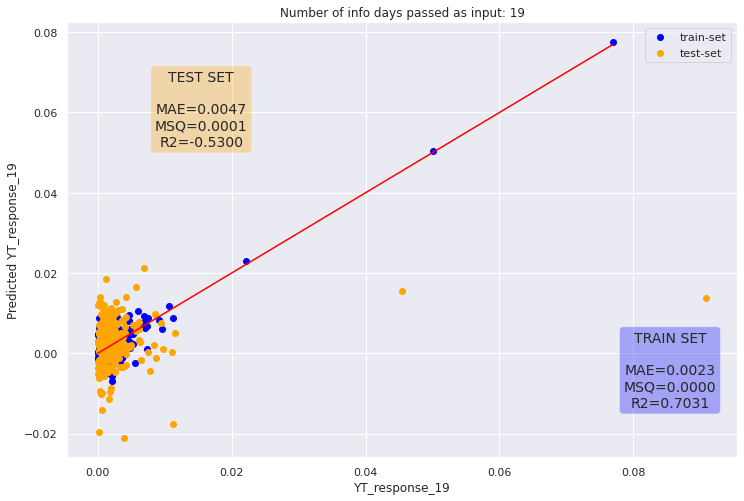

Number of input  260
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


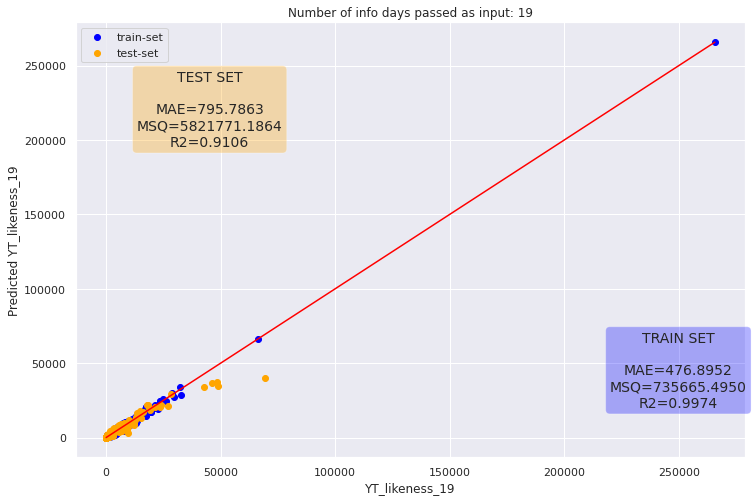

Number of input  260
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


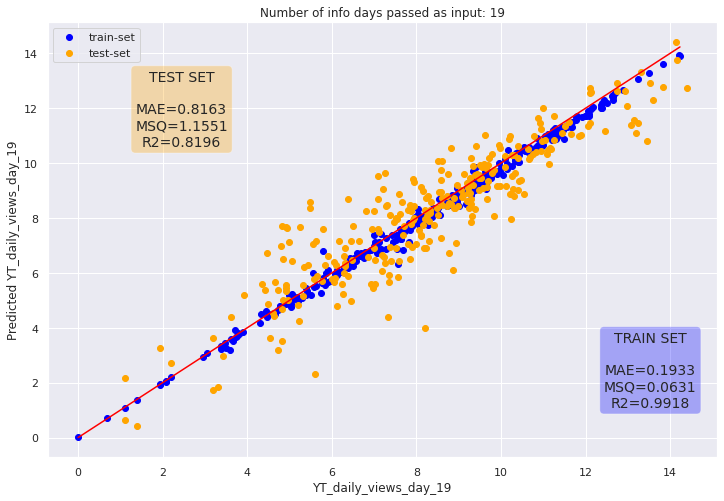

Number of input  260
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


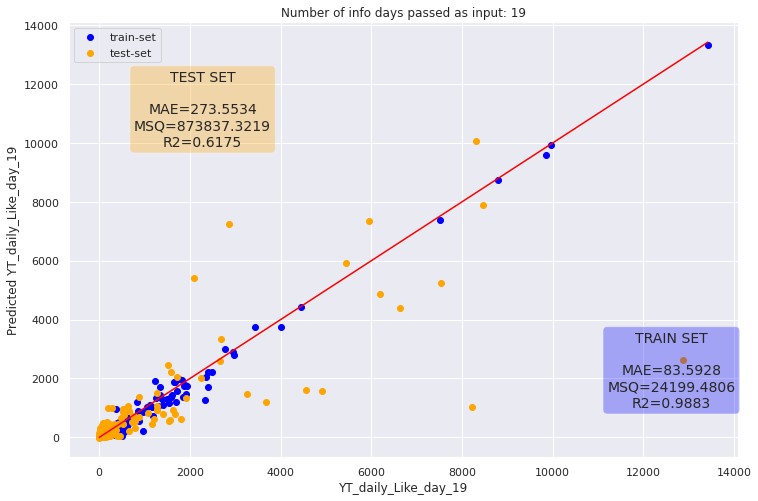

Number of input  260
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


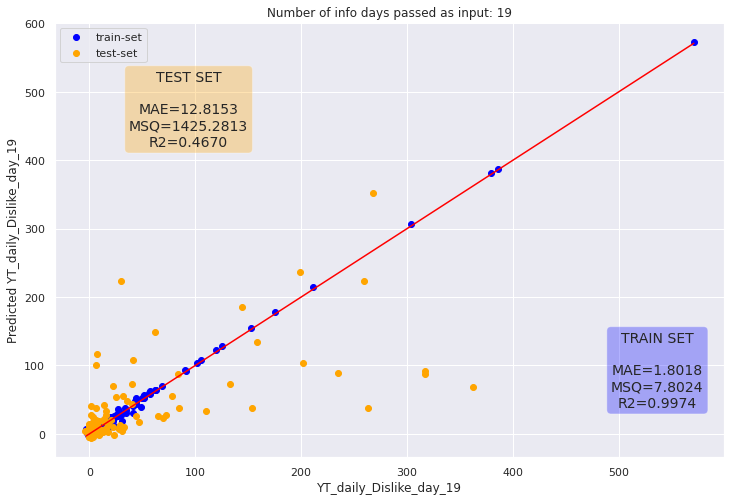

Number of input  260
Starting NN optimization!


/home/gianluca/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


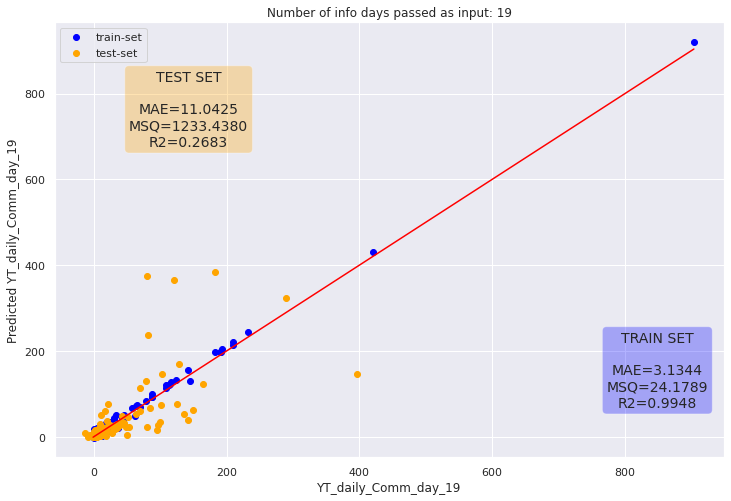

In [17]:
mae_dict ={}
R2_dict = {}
msq_dict = {}
for target_time_series in predicting_time_series:
    mae_dict[target_time_series] = []
    R2_dict[target_time_series] = []
    msq_dict[target_time_series] = []
    
for day in np.arange(6,20):
    for target_time_series in predicting_time_series:  #for each day and for each time_series a new model is trained
        target = target_time_series + str(day) #this controls which value of which time series is going to be predicted (e.g 'art_foll day 7'). The first 6
                                               #records of each time series are given as input


        Ytrain = copy_super_df.loc[copy_super_df.id.isin(train_id),target]
        Ytest  = copy_super_df.loc[copy_super_df.id.isin(test_id),target]
        
        #all the static and dynamic features before time 'day' are used as input to the multilayer perceptron to predict the value of the target time
        #series at time 'day'
        Xtrain = copy_super_df.loc[copy_super_df.id.isin(train_id),static_features + [column for column in dynamic_features if int(column[-2:]) < day]]   
        Xtest = copy_super_df.loc[copy_super_df.id.isin(test_id),static_features + [column for column in dynamic_features if int(column[-2:]) < day]]   

        print('Number of input ',len(Xtrain.columns))


        scaler = MinMaxScaler()
        scaler.fit(Xtrain)
        Xtrain = scaler.transform(Xtrain)
        Xtest = scaler.transform(Xtest)

        print("Starting NN optimization!")
        
        #definition of the model
        nn = MLPRegressor(
                          max_iter=1000,
                          hidden_layer_sizes=(64,64,64,64),
                          n_iter_no_change=100
                         )
        
        history = nn.fit(Xtrain,Ytrain.values.ravel())

        predictions_train = nn.predict(Xtrain) #prediction on train-set
        predictions_test = nn.predict(Xtest) #prediction on test-set
        
        
        mae_train = mean_absolute_error(Ytrain,predictions_train)
        rsq_train = r2_score(Ytrain,predictions_train)
        msq_train = mean_squared_error(Ytrain,predictions_train)

        mae_test = mean_absolute_error(Ytest,predictions_test)
        rsq_test = r2_score(Ytest,predictions_test)
        msq_test = mean_squared_error(Ytest,predictions_test)
        
        mae_dict[target_time_series].append(mae_test)
        R2_dict[target_time_series].append(rsq_test)
        msq_dict[target_time_series].append(msq_test)

        copy_super_df.loc[copy_super_df.id.isin(test_id),target] = predictions_test # update the values in the dataframe with the values got as output from the neural network, they will be used as input 
        #values for the next step
        textstr_train = '\n'.join((
        'TRAIN SET\n',
        'MAE=%.4f' % (mae_train, ),
        'MSQ=%.4f' % (msq_train, ),
        'R2=%.4f' % (rsq_train, )))

        textstr_test = '\n'.join((
        'TEST SET\n',
        'MAE=%.4f' % (mae_test, ),
        'MSQ=%.4f' % (msq_test, ),
        'R2=%.4f' % (rsq_test, )))

        props_train = dict(boxstyle='round', facecolor='blue', alpha=0.3)
        props_test = dict(boxstyle='round', facecolor='orange', alpha=0.3)
        # place a text box in upper left in axes coords

        ##############################################################################################################
        #scatter plots to visualize the performance of the neural network for each predictions 

        f,ax =plt.subplots(figsize=(12,8))
        ax.scatter(Ytrain,predictions_train, label = 'train-set',color = 'blue')
        ax.scatter(Ytest,predictions_test,label = 'test-set', color = 'orange')
        #ax.grid()
        ax.set_xlabel(target.replace(" ","_"))
        ax.set_ylabel('Predicted ' + target.replace(" ","_"))
        title = 'Number of info days passed as input: '+str(day)

        ax.plot(np.linspace(min(Ytrain),max(Ytrain),30),np.linspace(min(Ytrain),max(Ytrain),30),'red')

        plt.text(.9, .2, textstr_train, fontsize=14,horizontalalignment='center',verticalalignment='center'
                 ,bbox=props_train,transform = ax.transAxes)
        plt.text(.20, .8, textstr_test, fontsize=14,horizontalalignment='center',verticalalignment='center'
                 , bbox=props_test,transform = ax.transAxes)
        plt.title(title)
        plt.legend()
        plt.savefig(saving_path_regression+'/' + str(day)+target.replace(" ","_")+'.png')
        plt.show()
        plt.close()

In [18]:
import copy
time_series[list(time_series.keys())[0]].keys()

dict_keys(['track_pop', 'art_pop', 'art_foll', 'yt_views', 'yt_like', 'yt_dislike', 'yt_comments'])

In [19]:
time_series_predicted = copy.deepcopy(time_series)
for id_ in test_id:
    yt_views = []
    sp_pop = []
    art_pop = []
    for day in np.arange(0,20):
        yt_views.append(np.exp(copy_super_df.loc[super_df.id == id_, 'YT views day '+str(day)].values[0]))
        sp_pop.append(copy_super_df.loc[super_df.id == id_, 'SP_pop day '+str(day)].values[0])
        art_pop.append(copy_super_df.loc[super_df.id == id_, 'art_pop day '+str(day)].values[0])
    time_series_predicted[id_]['yt_views'] = yt_views
    time_series_predicted[id_]['track_pop'] = sp_pop
    time_series_predicted[id_]['art_pop'] = art_pop

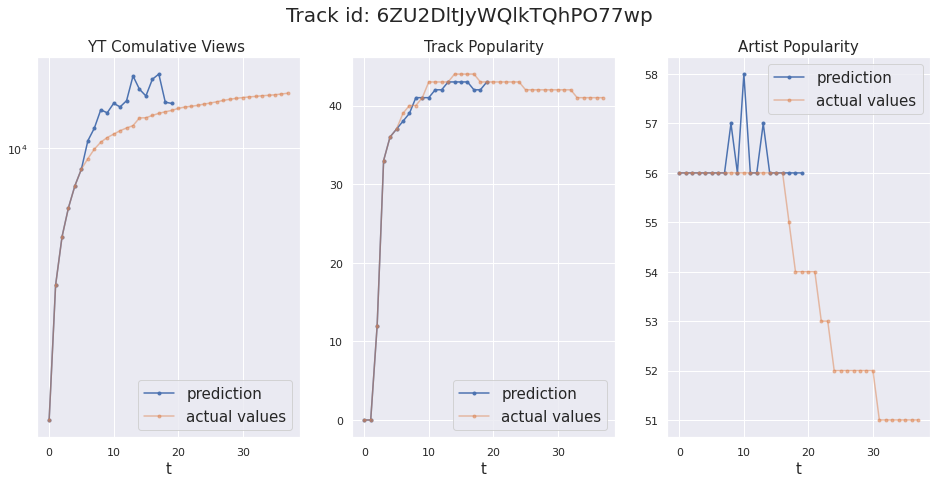

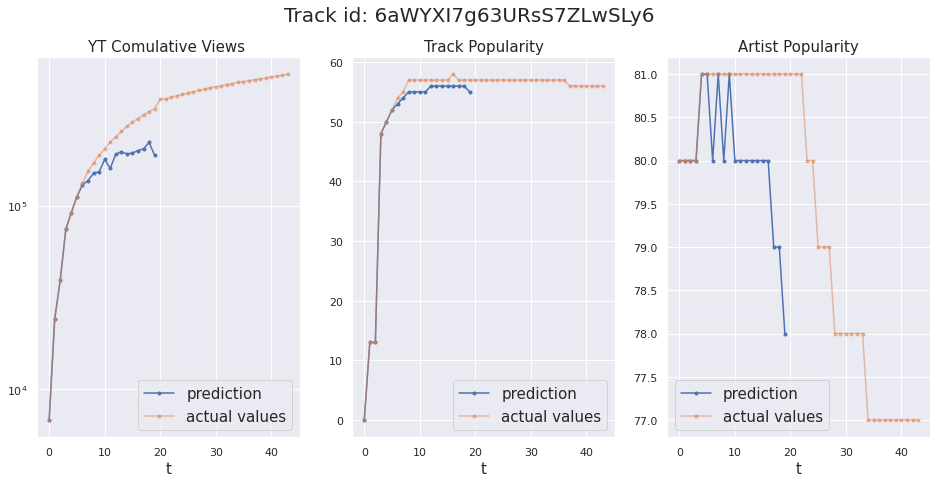

In [22]:
for id_track in list(test_id)[12:14]:
    track_to_plot = id_track

    f, ax = plt.subplots(1,3,figsize=(16,7))
    fs = 15
    f.suptitle('Track id: '+track_to_plot, fontsize = 20)

    ax[0].plot(np.array(time_series_predicted[track_to_plot]['yt_views'][:20]).astype(int),
               '.-',label = 'prediction')
    ax[0].plot(time_series[track_to_plot]['yt_views'],'.-',alpha=.5,label = 'actual values')
    ax[0].legend(fontsize = fs)
    ax[0].set_title('YT Comulative Views ',fontsize = fs)
    ax[0].set_xlabel('t',fontsize = fs)
    ax[0].set_yscale('log')
    #ax[0].grid()

    ax[1].plot(np.array(time_series_predicted[track_to_plot]['track_pop'][:20]).astype(int),
               '.-',label = 'prediction')
    ax[1].plot(time_series[track_to_plot]['track_pop'],'.-',alpha=.5,label = 'actual values')
    ax[1].legend(fontsize = fs)
    ax[1].set_title('Track Popularity',fontsize = fs)
    ax[1].set_xlabel('t',fontsize = fs)
    #ax[1].grid()

    ax[2].plot(np.array(time_series_predicted[track_to_plot]['art_pop'][:20]).astype(int),
               '.-',label = 'prediction')
    ax[2].plot(time_series[track_to_plot]['art_pop'],'.-',alpha=.5,label = 'actual values')
    ax[2].set_title('Artist Popularity',fontsize = fs)
    ax[2].legend(fontsize = fs)
    ax[2].set_xlabel('t',fontsize = fs)
    #ax[2].grid()
    plt.savefig(saving_path_regression+'/predictions_'+track_to_plot)
    plt.show()
